# Aprendizaje Automático - Trabajo Práctico
## Profesores
* Joel Spak
* Augstín Almada
* Bruno Cocitto López
## Alumnos
* Ezequiel Arévalo
* Simón Revello

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sbn
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
import warnings

In [2]:
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
DATA_FILE = "weatherAUS.csv"
data = pd.read_csv(DATA_FILE)

## Análisis Descriptivo

Nos quedamos con las localidades que corresponden para el trabajo práctico e imprimimos los campos del dataset para entenderlo mejor.

In [4]:
data.query("Location in ('Sydney', 'SydneyAirport', 'Canberra', 'Melbourne', 'MelbourneAirport')", inplace=True)
data.drop("Unnamed: 0", axis=1, inplace=True)

In [5]:
print(data.info())
print("-----------------------------------")
print(data.describe())
print("-----------------------------------")
print(data.head())

<class 'pandas.core.frame.DataFrame'>
Index: 15986 entries, 30167 to 70370
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              15986 non-null  object 
 1   Location          15986 non-null  object 
 2   MinTemp           15495 non-null  float64
 3   MaxTemp           15500 non-null  float64
 4   Rainfall          15199 non-null  float64
 5   Evaporation       14280 non-null  float64
 6   Sunshine          14038 non-null  float64
 7   WindGustDir       14529 non-null  object 
 8   WindGustSpeed     14531 non-null  float64
 9   WindDir9am        15291 non-null  object 
 10  WindDir3pm        15696 non-null  object 
 11  WindSpeed9am      15725 non-null  float64
 12  WindSpeed3pm      15737 non-null  float64
 13  Humidity9am       15416 non-null  float64
 14  Humidity3pm       15461 non-null  float64
 15  Pressure9am       15251 non-null  float64
 16  Pressure3pm       15260 non-null  float64

## Valores Nulos
Graficamos la dispersion de los valores nulos en un mapa de calor

<Axes: >

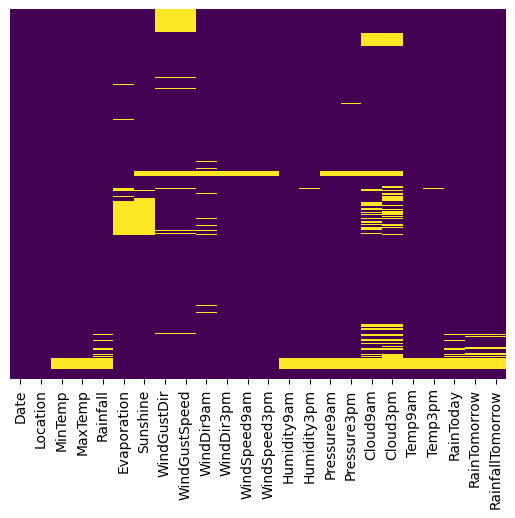

In [6]:
sbn.heatmap(data.isnull(), yticklabels=False, cmap="viridis", cbar=False)

# Tratamiento de los valores nulos
---
## RainTomorrow, RainToday y RainfallTomorrow

<p> Removeremos las filas que contengan valores nulos para RainToday, RainTomorrow y RainfallTomorrow y la almacenaremos en una variable para utilizarla para predecir sus valores como practica un vez que se tenga el modelo armado con la regresion lineal. </p>

In [7]:
null_rows_for_predictions = data.loc[ data['RainTomorrow'].isnull() | data['RainfallTomorrow'].isnull() | data['Rainfall'].isnull()  ]
data = data [ data['RainTomorrow'].notna() & data["RainfallTomorrow"].notna() & data["RainToday"].notna() ]

## Generar encodings para variable categoricas no numericas
### Encoding de la variable Date
<p> Se intentaron realizar 3 versiones de encoding para la variable date, por semanas, por meses y por estacion </p>
<p> Luego de probar concluimos que el modelo arrojaba valores muy simalares para las 3 formas de codificar la fecha.</p>
<p> Euristicamente concluimos que no hay un impacto significativo en elegir una de las 3 pero se elige la agrupacion por estacion porque al ser solo 4 variables ayuda a explicar el modelo.</p>
<p> Se deja comentado el codigo del encoding para semanas y meses, pero no se utiliza para un mejor entendimiento de los graficos </p>


In [8]:
from datetime import datetime

#data["Week"] = data["Date"].apply(lambda time: datetime.strptime(time, '%Y-%m-%d').date().isocalendar().week )
#data["Month"] = data["Date"].apply(lambda time: datetime.strptime(time, '%Y-%m-%d').month)
data["Season"] = data["Date"].apply(lambda time: ( datetime.strptime(time, '%Y-%m-%d').month ) %12 // 3 + 1 )

data.drop("Date", axis=1, inplace=True)

### Generar enconding para el resto de las variables

Para variables Yes/No como RainToday and RainTomorrow generamos encoding binarios asignando 1 y 0 respectivamente.
<p> Para variables que describen las direcciones del viento, las colapsamos en 4 valores N,S,W y E. Luego la transformamos a variables dummies al igual que Location. </p>

In [9]:
from sklearn.preprocessing import LabelEncoder

one_hot_encoding=pd.get_dummies(data.Location, dtype=int)
data.drop("Location", axis=1, inplace=True)
data = data.join(one_hot_encoding)

cardinal_points_map = {
    "N" : "^N.*$",
    "S" : "^S.*$",
    "W" : "^W.*$",
    "E" : "^E.*$"
}

for k,v in cardinal_points_map.items():
    data.WindGustDir.replace( to_replace=v, value=k, regex=True, inplace=True)
    data.WindDir3pm.replace( to_replace=v, value=k, regex=True, inplace=True)
    data.WindDir9am.replace( to_replace=v, value=k, regex=True, inplace=True)

one_hot_encoding=pd.get_dummies(data.WindGustDir, dtype=int, prefix="WindGustDir_")
data.drop("WindGustDir", axis=1, inplace=True)
data= data.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(data.WindDir9am, dtype=int,  prefix="WindDir9am_")
data.drop("WindDir9am", axis=1, inplace=True)
data = data.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(data.WindDir3pm, dtype=int,  prefix="WindDir3pm_")
data.drop("WindDir3pm", axis=1, inplace=True)
data = data.join(one_hot_encoding)

# one_hot_encoding=pd.get_dummies(data.Month, dtype=int, prefix="Month_")
# data.drop("Month", axis=1, inplace=True)
# data= data.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(data.Season, dtype=int, prefix="Season_")
data.drop("Season", axis=1, inplace=True)
data= data.join(one_hot_encoding)

# one_hot_encoding=pd.get_dummies(data.Week, dtype=int, prefix="Week_")
# data.drop("Week", axis=1, inplace=True)
# data= data.join(one_hot_encoding)

le = LabelEncoder()
data["RainToday"] = le.fit_transform(data.RainToday)
data["RainTomorrow"] = le.fit_transform(data.RainTomorrow)

full_data_encoded = data.copy() # esta variable se utilizara mas adelante para calcular una regresion sobre los datos sin interpolar

## Graficar y entendier la distribucion de las variables

Primero, trataremos de entender la distribucion del resto de las variables y cómo se ajustan los distintos métodos de interpolación a los datos.

### Interpolar utilizando method='linear'

Considerando que los datos están organizados de manera cronológica y representan valores recolectados cronologicamente para fechas consecutivas, estas no deberian variar demasiado, asi que aplicamos la función de interpolación utilizando el parámetro 'linear' para completar los valores faltantes con datos similares.

A continuación, se muestran como se reemplazan los valores nulos en el conjunto de datos, demostrando que la interpolación 'linear' es más efectiva que, por ejemplo, el uso del 'promedio' para rellenar valores nulos en todas las variables a excepción de Cloud9am, Cloud3pm, Evaporation y Sunshine.

In [10]:
def plot_interpolated_scatter(cols: list, pd_data: pd.DataFrame, method: str, order:any = None, sx :int = None, sy:int = None, fsize : tuple=(12,12)):

    sx = int(len(cols)/2) + int(len(cols)%2) if not sx else sx 
    sy = 2 if not sy else sy 

    f, axs = plt.subplots(sx,sy, figsize=fsize, squeeze=False)
    
    i = 0
    for x in range(0, sx):
        for y in range(0,sy):
            if i > len(cols)-1:
                break
            col = cols[i]
            data_to_plot = pd_data[[col]].copy()
            data_to_plot.loc[:, "is_nan"] = data_to_plot[col].isnull()
            data_to_plot.interpolate(method=method,order=order, inplace=True)
            sbn.scatterplot(data=data_to_plot, x=range(0, data_to_plot.shape[0] ), y=col, hue="is_nan", ax=axs[x][y])
            i+=1
    plt.show()    

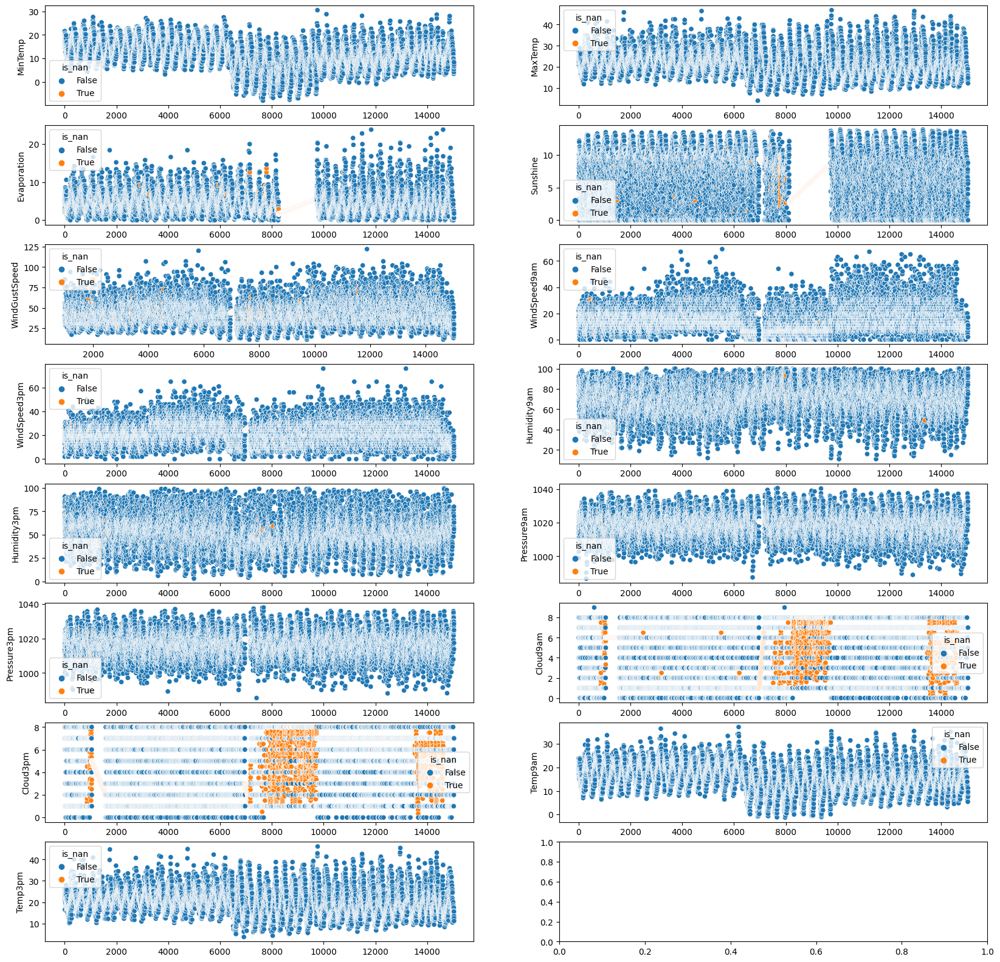

In [11]:
cols = ['MinTemp','MaxTemp','Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm' ]

plot_interpolated_scatter(cols, data, "linear", fsize=(20,20))

### Interpolar utilizando method='nearest'
<p> Al intentar interpolar el resto de las variables utilizando nearest vemos que el resultado no es bueno para Evaporation y Sunshine por la gran cantidad de datos consecutivos faltantes en ambas. </p>
<p> Se nota una mejora en el caso de Cloud9am y Cloud3pm el cual puede ser considerado posteriormente si no se encuentra una forma mas optima de interpolar los valores nulos de estas variables.</p>

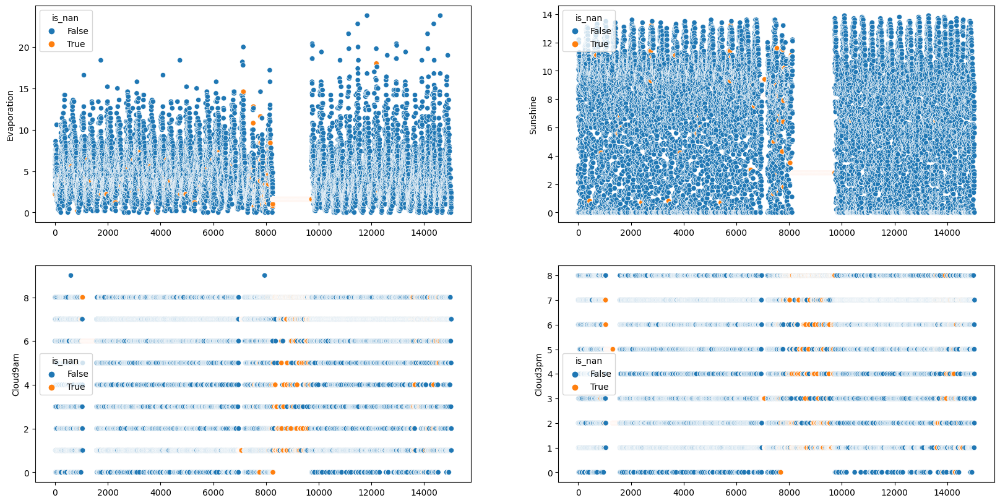

In [12]:
cols = [
    'Evaporation', 'Sunshine',
    'Cloud9am', 'Cloud3pm',
]

plot_interpolated_scatter(cols, data, "nearest", fsize=(20,10))

### Interpolar utilizando method='cubicspline'
Intentamos a continuación inteporlar utilizando distintos métodos polinómicos para intentar conseguir un mejor ajuste para la interpolacion, pero para grandes brechas entre datos los modelos polinómicos no se ajustan bien. 
<p> Por lo que interpolacion mediante metodos polinomicos es la peor opción de todas las analizadas hasta ahora, incluso intentando métodos de órden de diferente exponentes.</p>

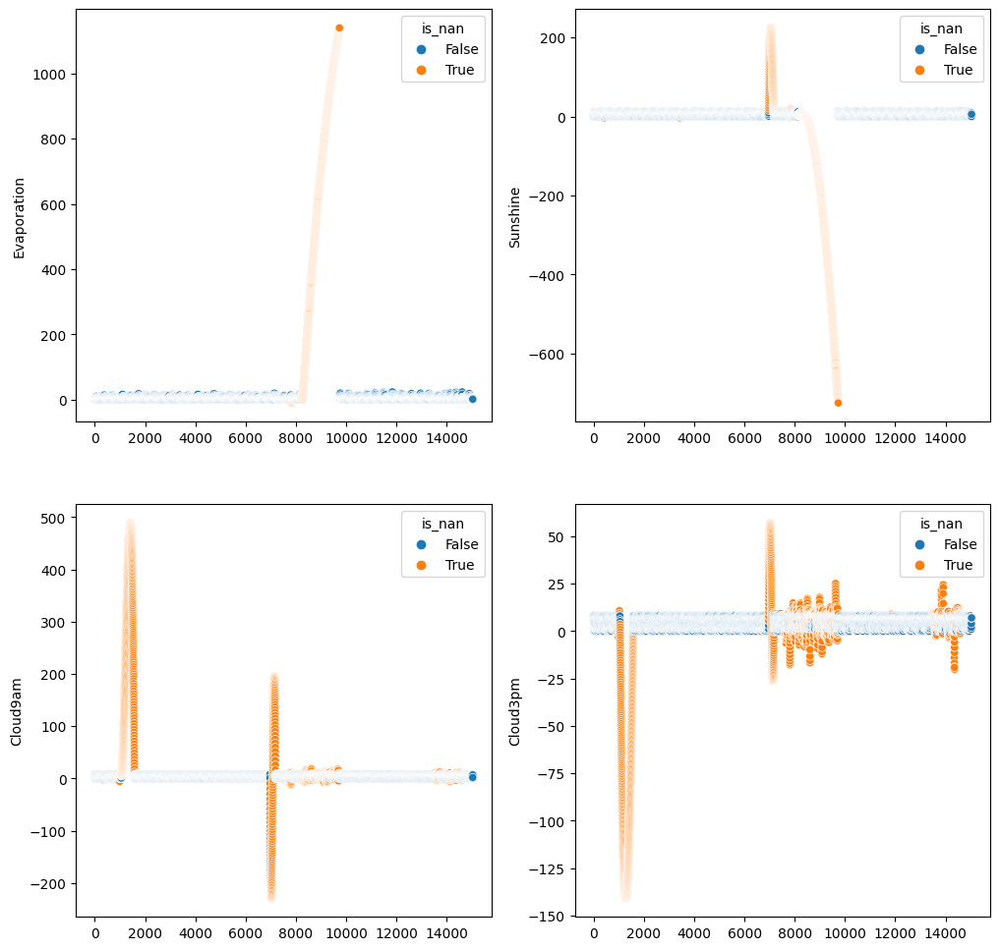

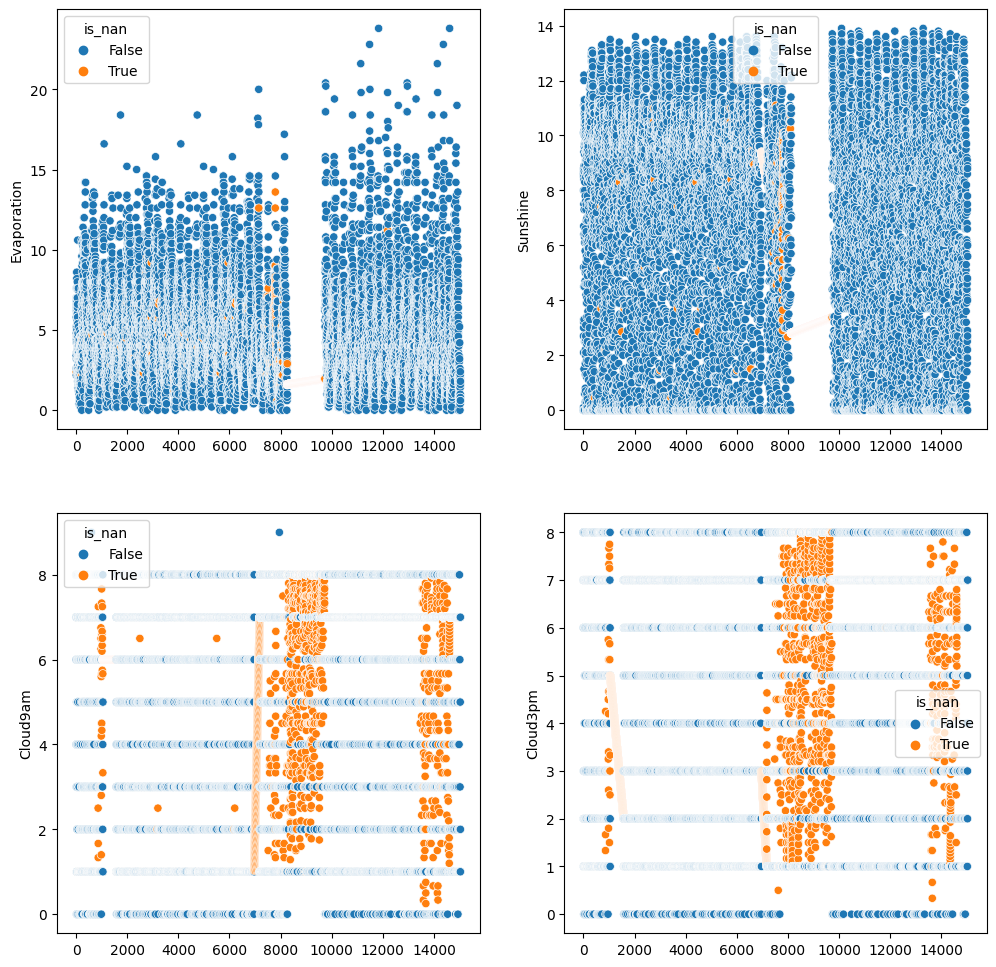

In [13]:
cols = [
    'Evaporation', 'Sunshine',
    'Cloud9am', 'Cloud3pm',
]
plot_interpolated_scatter(cols, data, method="cubicspline")
plot_interpolated_scatter(cols, data, method="polynomial", order=1)

### Conclusión de interpolaciones
Utilizaremos una interpolación lineal para las variables 'MinTemp','MaxTemp', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am' y 'Temp3pm'.

Borraremos las filas nulas para las variables 'Cloud9am' y 'Cloud3pm'.
       
Para Evaporation y Sunshine intentaremos posteriormente encontrar variables explicativas para estas para generar un modelo, e intentar predecir los valores nulos faltantes de la forma mas cercana posible.

In [14]:
linear_cols = ['MinTemp','MaxTemp', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
nearest_cols = ['Cloud9am', 'Cloud3pm']

for col in linear_cols:
    data[col].interpolate(method="linear", inplace=True)
    print( f"{col} valores nulos : {data[col].isnull().sum()}")

for col in nearest_cols:
    data[col].interpolate(method="nearest", inplace=True)
    print( f"{col} valores nulos : {data[col].isnull().sum()}")


MinTemp valores nulos : 0
MaxTemp valores nulos : 0
WindSpeed9am valores nulos : 0
WindSpeed3pm valores nulos : 0
Humidity9am valores nulos : 0
Humidity3pm valores nulos : 0
Pressure9am valores nulos : 0
Pressure3pm valores nulos : 0
Temp9am valores nulos : 0
Temp3pm valores nulos : 0
Cloud9am valores nulos : 0
Cloud3pm valores nulos : 0


### Nota
Vemos que la interpolacion lineal no se completa exitosamente para "WindGustSpeed". Esto se debe a que la ultima row para esta columna está vacia, por lo que no puede crearse una relación entre el último dato registrado y la última row de esta columna.
<p>Graficamos nuevamente un heatmap para entender cómo quedó la distribución de valores nulos en el dataset después de la interpolación</p>

<Axes: >

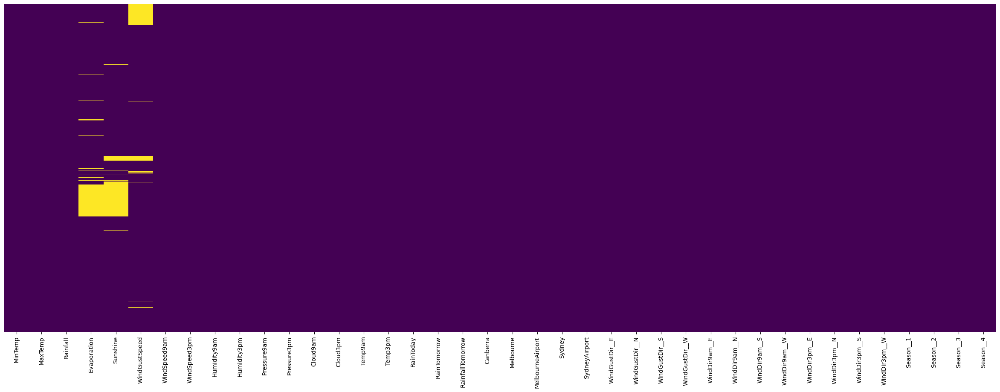

In [15]:
fig, ax = plt.subplots(figsize=(30, 10))
sbn.heatmap(data.isnull(), yticklabels=False, cmap="viridis", cbar=False,)

Normalizaremos los datos y crearemos una matriz de correlación para tratar de entender la importancia y el peso de las mismas.
Se puede asumir que todavia las variables que tienen valores nulos son variables explicativas importantes para el modelo.

Sunshine ( luminocidad ): probablemente muy relacionado a la evaporación, la temperatura, la nubosidad y la presión.
Evaporation ( Evaporacion): se asume que tiene las mismas relaciones fuertes al igual sunshine.
WindGustSpeed( Rafagas de viento ): Probablemente muy relacionada a la presión.

Graficaremos una matriz de correlación para ver si se puede crear un modelo de regresión para predecir la mayor cantidad de valores para estas variables.

## Normalizar variables numéricas
Normalizamos las variables numéricas ya que se encuentran todas en diferentes escalas

In [16]:
from sklearn.preprocessing import StandardScaler

categorical_vars = [ 'RainTomorrow', 'RainToday','Canberra', 'Melbourne', 'MelbourneAirport',
       'Sydney', 'SydneyAirport', 'WindGustDir__E', 'WindGustDir__N',
       'WindGustDir__S', 'WindGustDir__W', 'WindDir3pm__E', 'WindDir3pm__N',
       'WindDir3pm__S', 'WindDir3pm__W', 'WindDir9am__E', 'WindDir9am__N', 'WindDir9am__S', 'WindDir9am__W',
       'Month__1', 'Month__2', 'Month__3',
       'Month__4', 'Month__5', 'Month__6', 'Month__7', 'Month__8', 'Month__9',
       'Month__10', 'Month__11', 'Month__12', 'Season__1', 'Season__2',
       'Season__3', 'Season__4'
]

numerical_vars = [ col for col in data.columns if col not in categorical_vars ]

scale= StandardScaler() 
scaled_data = data.copy()

scaled_data[numerical_vars] = scale.fit_transform(data[numerical_vars])

## Matriz de correlación

<Axes: >

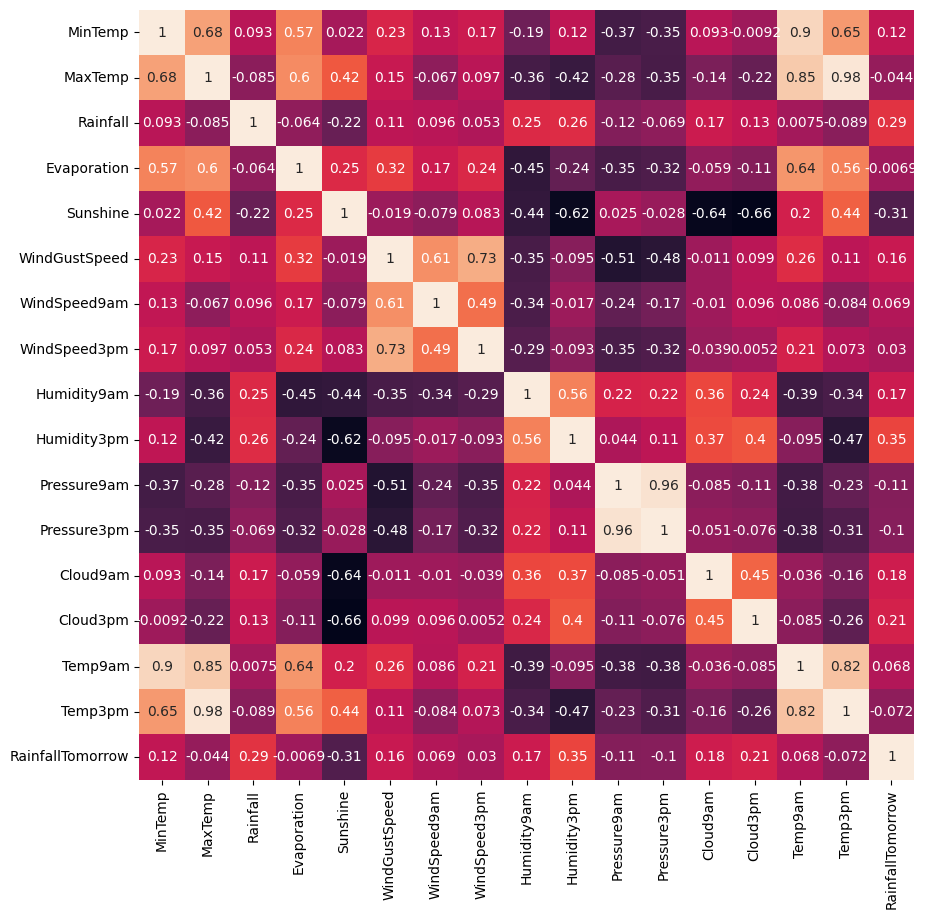

In [17]:
heatmap_data = scaled_data[numerical_vars]

plt.figure(figsize=(10, 10))
sbn.heatmap(heatmap_data.corr(numeric_only=True, method='pearson'), yticklabels=True, cbar=False, annot=True)

Concluimos que se cumple nuestra predicción anterior acerca de la correlaciones que se encuentran entre las distintas variables.
<p>Por ejemplo que Sunshine tiene una buena correlación con los dias nublados, la humedad y la temperatura.</p>
<p>Se intentera calcular los valores nulos para WindGustSpeed utilizando un modelo de regresion.</p>

<Axes: >

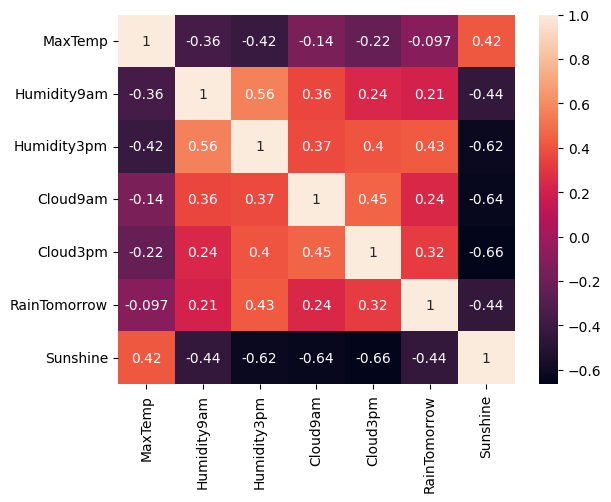

In [18]:
x_train_cols = ["MaxTemp", "Humidity9am", "Humidity3pm", "Cloud9am", "Cloud3pm","RainTomorrow"]

sunshine_data = data[ x_train_cols + ["Sunshine"] ] 
plt.figure()
sbn.heatmap(sunshine_data.corr(numeric_only=True, method='pearson'), yticklabels=True, annot=True)


Vemos que la correlación entre las variables y Sunshine siguen siendo buenas. Por lo que intentaremos predecir los valores nulos utilizando una regresión lineal.

0.6838180528767112 4.5557675133199025
-0.7152707714509803 25.52817093048398


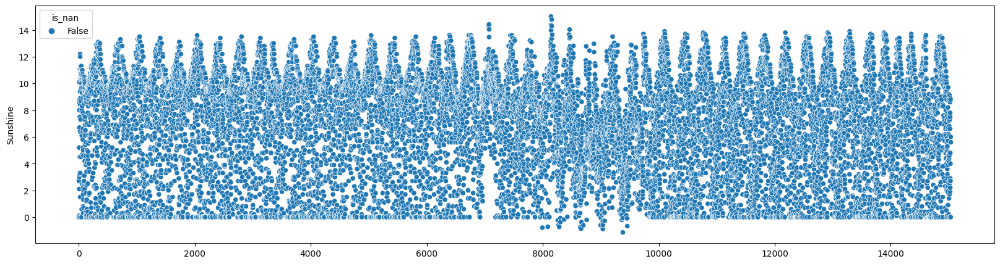

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.metrics import confusion_matrix, classification_report

sunshine_data_null =  sunshine_data[sunshine_data["Sunshine"].isnull()]
sunshine_data_not_null = sunshine_data[sunshine_data["Sunshine"].notnull()] 

x_pred = sunshine_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(sunshine_data_not_null[x_train_cols], sunshine_data_not_null["Sunshine"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["Sunshine"] = y_pred
data["Sunshine"].update(x_pred["Sunshine"])

plot_interpolated_scatter(["Sunshine"], data, method="linear",fsize=(20,5), sy=1)

### Interpolar Sunshine con regresion lineal
Como podemos ver ahora se ajustan mucho mejor los valores para esta variable. Ahora acotaremos los valores entre 0 y 12 para mejorar los datos.

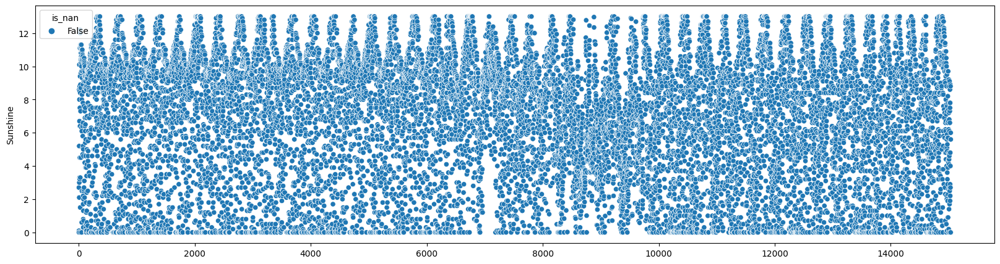

In [20]:
data["Sunshine"] = data["Sunshine"].apply(lambda value: value if value >0 else 0 )
data["Sunshine"] = data["Sunshine"].apply(lambda value: value if value <=13 else 13 )
plot_interpolated_scatter(["Sunshine"], data, method="linear",fsize=(20,5),sy=1)

### Regresión e Interpolar Evaporation
Realizamos la creacion de un modelo de regresion lineal para predecir los valores null de Evaporation

0.5870701823722724 3.9400332354943077
-0.8673926241446481 18.191248854348743


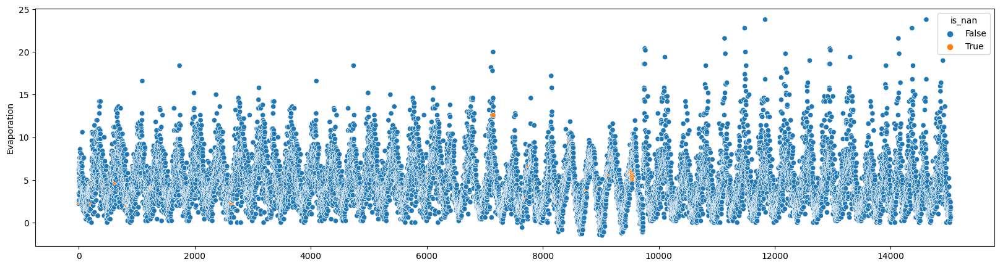

In [21]:
x_train_cols = [ c for c in data.columns if c != "Evaporation" ]

evaporation_data = data[ x_train_cols + ["Evaporation"] ] 
evaporation_data = evaporation_data[ 
    evaporation_data["WindGustSpeed"].notnull()
]

evaporation_data_null =  evaporation_data[evaporation_data["Evaporation"].isnull()]
evaporation_data_not_null = evaporation_data[evaporation_data["Evaporation"].notnull()] 

x_pred =evaporation_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(evaporation_data_not_null[x_train_cols], evaporation_data_not_null["Evaporation"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["Evaporation"] = y_pred
data["Evaporation"].update(x_pred["Evaporation"])
plot_interpolated_scatter(["Evaporation"], data, method="linear",fsize=(20,5), sy=1)

### Interpolamos Evaporation
<p> Se probaron varias formas de generar un modelo que se ajuste lo mejor posible para predecir los valores faltantes para la evaporación.</p>
<p> Se concluye heurísticamente que la mejor aproximacion parece ser utilizando el dataset completo. </p>
<p> Quedan algunos valores nulos que no pudieron ser interpolados y agregados al dataset pero vemos que se ajustan bien aplicando una interpolación lineal con el resto de los datos.</p>
<p> Vemos en el grafico que los datos se interpolan de forma mas prolija que todas las estimaciones anteriores usando lo metodos de interpolacion estandar provisto por la libreia Pandas. </p>
<p> Para los valores menores a 0 se restarán la distancia del minimo valor, para moverlos sobre 0 y simular un comportamiento mas parecido a la realidad </p>

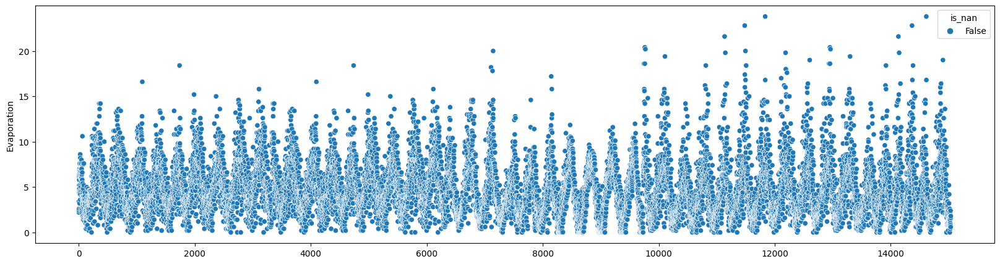

In [22]:
data["Evaporation"].interpolate(method="linear", inplace=True)
data["Evaporation"] = data["Evaporation"].apply(lambda value: 0 if value < 0 else value  )
plot_interpolated_scatter(["Evaporation"], data, method="linear",fsize=(20,5),sy=1)

# Interpolar WindGust
Se replica exactamente el mismo procedimiento que para la estimación de Evaporation y Sunshine.

0.7102562500642953 63.920628485197014
-0.8483704924961355 388.3847972378535


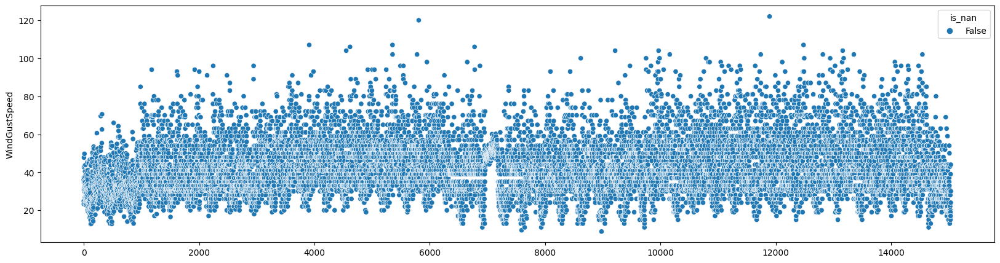

In [23]:
x_train_cols = [ c for c in data.columns if c != "WindGustSpeed" ]

windgust_data = data.copy()

windgust_data_null =  windgust_data[windgust_data["WindGustSpeed"].isnull()]
windgust_data_not_null = windgust_data[windgust_data["WindGustSpeed"].notnull()] 

x_pred = windgust_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(windgust_data_not_null[x_train_cols], windgust_data_not_null["WindGustSpeed"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["WindGustSpeed"] = y_pred
data["WindGustSpeed"].update(x_pred["WindGustSpeed"])
plot_interpolated_scatter(["WindGustSpeed"], data, method="polynomial",fsize=(20,5), sy=1, order=1)

# Escalar nuevamente los datos del dataset para toda las variables numéricas
Volvemos a escalar con nuestros datos nulos ya completos.

In [24]:
scaled_data = data.copy()
scaled_data[numerical_vars] = scale.fit_transform(data[numerical_vars])

### Graficar la matriz de correlación final escalada sin valores nulos

<Axes: >

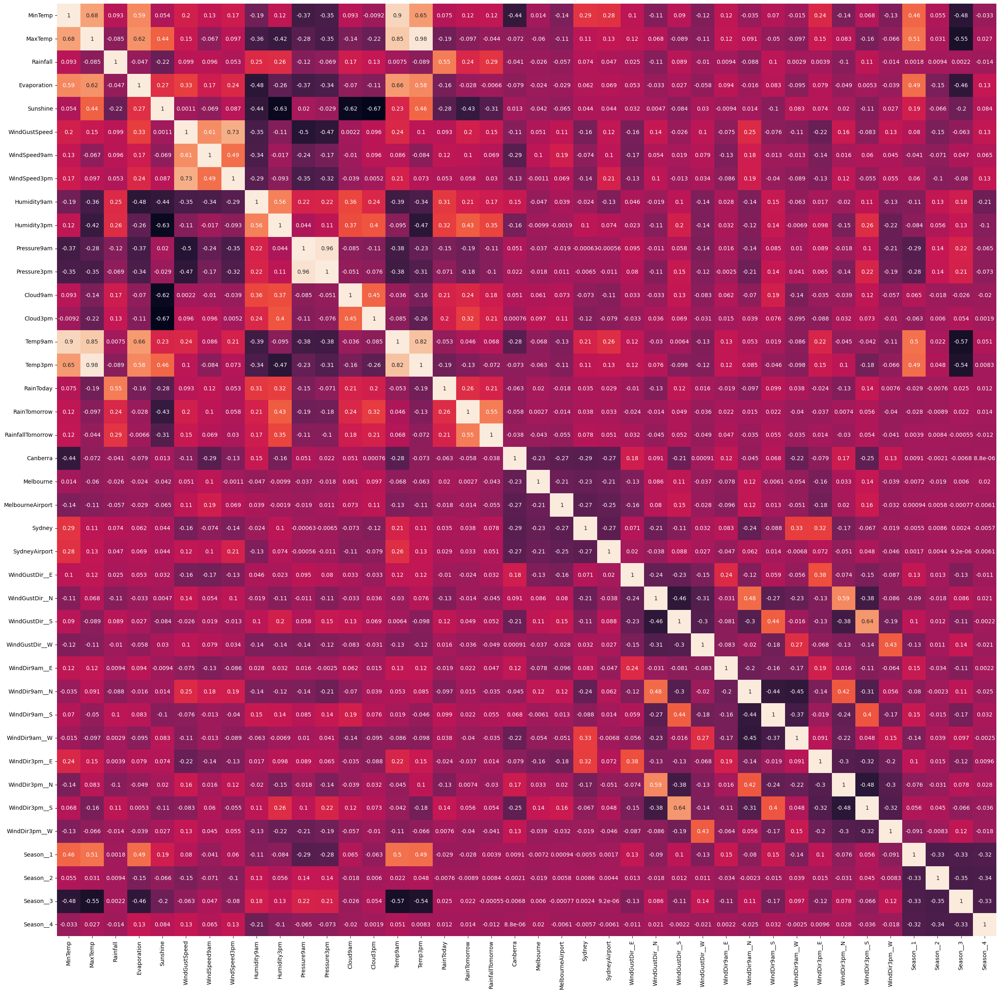

In [25]:
plt.figure(figsize=(30, 30))
sbn.heatmap(scaled_data.corr(numeric_only=True, method='pearson'), yticklabels=True, cbar=False, annot=True)

### Regresión Lineal Simple

In [26]:
x = scaled_data.copy()
y = x["RainfallTomorrow"].copy()
x.drop("RainfallTomorrow", axis=1, inplace=True)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(x_train, y_train)
y_pred = model.predict(x_test)


r2 = r2_score( y_test, y_pred)
m_e2 = mean_squared_error( y_test, y_pred)
print (f"score R2: {round(r2, 4)}")
print (f"error MSE: {round(m_e2, 4)}") 


score R2: 0.3512
error MSE: 0.6998


# Regresión Lineal sin tratamientos de los datos
Aplicaremos una regresión lineal borrando todos los datos despues de realizar el encoding de las variables y sin interpolar ningun dato.

In [27]:
full_data_encoded.dropna(inplace=True)
full_data_encoded[numerical_vars] = scale.fit_transform(full_data_encoded[numerical_vars])

fx = full_data_encoded.copy()
fy = fx["RainfallTomorrow"].copy()
fx.drop("RainfallTomorrow", axis=1, inplace=True)
fx_train, fx_test, fy_train, fy_test = train_test_split(fx, fy, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(fx_train, fy_train)
fy_pred = model.predict(fx_test)

r2 = r2_score( fy_test, fy_pred)
m_e2 = mean_squared_error( fy_test, fy_pred)
print (f"score R2: {round(r2, 4)}")
print (f"error MSE: {round(m_e2, 4)}") 

score R2: 0.4012
error MSE: 0.4243


## Conclusión Regresion Lineal
<p>Se puede ver que a pesar del esfuerzo al completar y normalizar los datos, el modelo lineal no se ajusta bien para la predicción de RainfallTomorrow con un score de 0.35. </p>
<p>Tiene mejor score y un error mas bajo al realizar un drop directamente sobre los datos nulos, por lo que seguiremos usando este set de datos en vez del interpolado.</p>

# Regularización y Regresiones Lasso, Ridge y ElasticNet 

In [28]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, RidgeCV, ElasticNetCV, LassoCV

lr = LinearRegression()
lr.fit(fx, fy)

print("Coeficientes del modelo de regresión lineal:")
#print(lr.coef_)
print(lr.score(fx,fy))

for alpha, ratio in [(0.9,0.2), (0.6,0.5), (0.3,0.5), (0.2,0.5), (0.1,0.3),
                     (0.01,0.9), (0.001,0.7), (0.0001,0.2), (0.00001,0.5), (0.000001,0.9)]:
    lasso = Lasso(alpha=0.1)
    ridge = Ridge(alpha=0.1) 
    elasticnet = ElasticNet(alpha=alpha, l1_ratio=ratio)

    lasso.fit(fx, fy)
    ridge.fit(fx, fy)
    elasticnet.fit(fx,fy)


    print(f"\nAlpha: {alpha} Ratio {ratio}")
    #print(lasso.coef_)
    print(f"Lasso Coef: {round(lasso.score(fx,fy), 4)}")

    #print(ridge.coef_)
    print(f"Ridge Coef: {round(ridge.score(fx,fy), 4)}")

    #print(elasticnet.coef_)
    print(f"ElasticNet : {round(elasticnet.score(fx,fy), 4)}")

Coeficientes del modelo de regresión lineal:
0.3461322188219069

Alpha: 0.9 Ratio 0.2
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.0815

Alpha: 0.6 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.0163

Alpha: 0.3 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.149



Alpha: 0.2 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.2211

Alpha: 0.1 Ratio 0.3
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.2973

Alpha: 0.01 Ratio 0.9
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3383

Alpha: 0.001 Ratio 0.7
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3459


/usr/local/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.440e+00, tolerance: 1.067e+00
  model = cd_fast.enet_coordinate_descent(



Alpha: 0.0001 Ratio 0.2
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3461

Alpha: 1e-05 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3461

Alpha: 1e-06 Ratio 0.9
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3461


/usr/local/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.036e+03, tolerance: 1.067e+00
  model = cd_fast.enet_coordinate_descent(


# Regularizacion y Regresiones Lasso, Ridge y ElasticNet Cross Validation 

In [29]:
lassoCV = LassoCV() 
ridgeCV = RidgeCV() 
elasticnetCV = ElasticNetCV()

lassoCV.fit(fx, fy)
ridgeCV.fit(fx, fy)
elasticnetCV.fit(fx,fy)

print("lasso alpha:",lassoCV.alpha_)
print("ridge alpha:",ridgeCV.alpha_)
print("elastic net alpha:",elasticnetCV.alpha_ )

# Mostrar coeficientes
print("\nCoeficientes del modelo Lasso:")
#print(lassoCV.coef_)
print(round(lassoCV.score(fx,fy), 4))

print("\nCoeficientes del modelo Ridge:")
#print(ridgeCV.coef_)
print(round(ridgeCV.score(fx,fy), 4))


print("\nCoeficientes del modelo ElasticNet:")
#print(elasticnetCV.coef_)
print(round(elasticnetCV.score(fx,fy), 4))

lasso alpha: 0.0011696690144337167
ridge alpha: 10.0
elastic net alpha: 0.0007144000326480316

Coeficientes del modelo Lasso:
0.3456

Coeficientes del modelo Ridge:
0.3461

Coeficientes del modelo ElasticNet:
0.346


## Analizar variables para clasificación
El propósito es ver qué variables nos permiten diferenciar correctamente si llueve o no.
Dado que ya realizamos un análisis previo de las variables para la regresión lineal no hay mucho análisis para agregar ya que la variable RainfallTomorrow explica la columna RainTomorrow

In [30]:
dfclas = data.copy()

<Figure size 640x480 with 0 Axes>

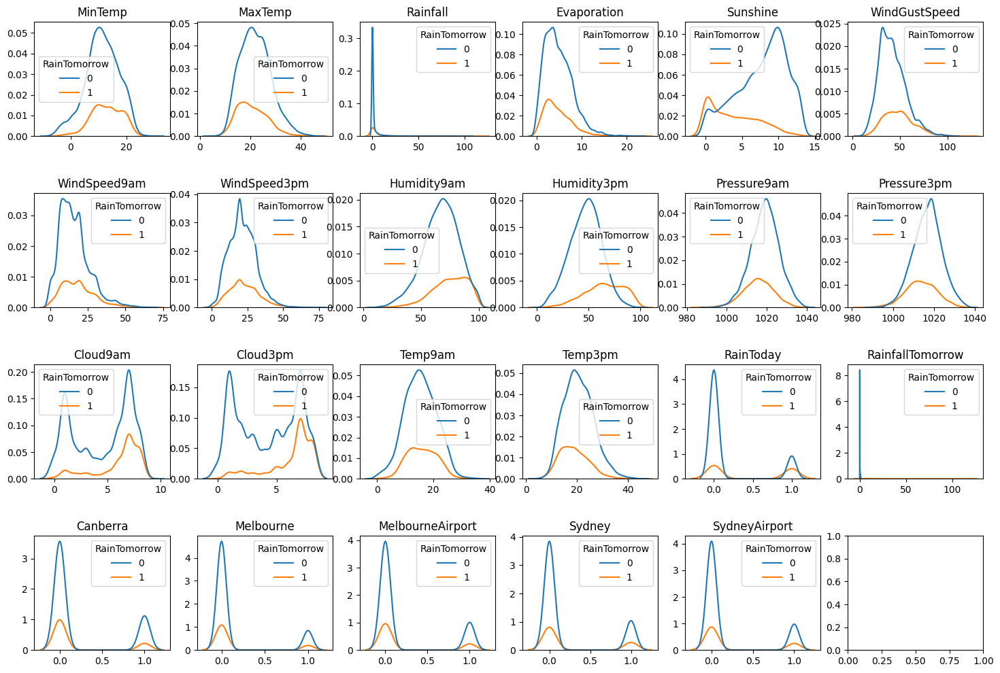

In [31]:
cols = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday', 'RainfallTomorrow',
       'Canberra', 'Melbourne', 'MelbourneAirport', 'Sydney', 'SydneyAirport']
filas = 4
columnas = 6
plt.figure()
fig, axs = plt.subplots(filas, columnas, figsize=(18, 12))
fig.subplots_adjust(hspace=0.5)
for i, columna in enumerate(cols):
    f = i // columnas
    c = i % columnas
    sbn.kdeplot(dfclas, x=columna, hue="RainTomorrow", ax=axs[f, c])
    axs[f, c].set_title(columna)
    axs[f, c].set_xlabel('')
    axs[f, c].set_ylabel('')
plt.show()

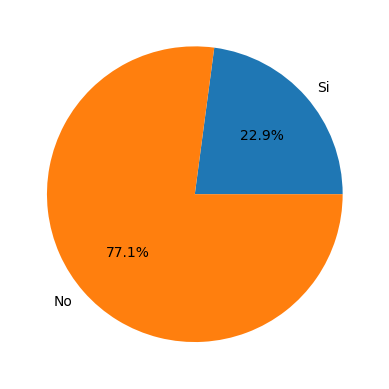

In [32]:
tot_no = data["RainTomorrow"].value_counts()[0]
tot_si = data["RainTomorrow"].value_counts()[1]
porcentaje_si = round(tot_si / (tot_no + tot_si) * 100, 2)
porcentaje_no = round(tot_no / (tot_no + tot_si) * 100, 2)
data_cantidad = pd.DataFrame(columns=["RainTomorrow", "%"], index=["Si", "No", "Total"], data=[
    [tot_si, porcentaje_si],
    [tot_no, porcentaje_no],
    [tot_si + tot_no, porcentaje_si + porcentaje_no]
])

plt.figure()
plt.pie([tot_si, tot_no], labels=["Si", "No"], autopct='%1.1f%%')
plt.show()

In [33]:
data_cantidad

,RainTomorrow,%
Si,3443,22.9
No,11593,77.1
Total,15036,100.0


Podemos ver que hay una desproporción en la cantidad de casos de lluvia con los de no lluvia. Si utilizamos el dataset como actualmente está obtendremos un modelo sesgado que tendrá preferencia por los dias de no lluvia. Para esto podemos utilizar diferentes técnicas para mantener el dataset proporcionado:
* Pesos de clase: A la clase LogisticRegression podemos setear el parámetro class_weight a "balanced" para dar más peso a los registros de lluvia
* Submuestreo: Eliminar registros de no lluvia hasta equiparar los de lluvia.
* Sobremuestreo: Generar información sintética para aumetar los registros de lluvia.

## Pesos de clase

In [34]:
logmodel = LogisticRegression(class_weight="balanced", random_state=42, max_iter=1000)

In [35]:
dflogx = full_data_encoded.copy()
dflogy = dflogx["RainTomorrow"].copy()
dflogx.drop("RainTomorrow", axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(dflogx, dflogy, test_size=0.3, random_state=42)
logmodel.fit(X_train, y_train)

LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)

In [36]:
y_predict = logmodel.predict(X_test)
conf_matrix = pd.DataFrame(confusion_matrix(y_test, y_predict), columns=["Negativo Predicho", "Positivo Predicho"], index=["Real Negativo", "Real Positivo"])
print(confusion_matrix(y_test, y_predict))
print(classification_report(y_test, y_predict))

[[2410   22]
 [   9  760]]
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      2432
           1       0.97      0.99      0.98       769

    accuracy                           0.99      3201
   macro avg       0.98      0.99      0.99      3201
weighted avg       0.99      0.99      0.99      3201



In [37]:
conf_matrix

,Negativo Predicho,Positivo Predicho
Real Negativo,2410,22
Real Positivo,9,760


## Submuestreo
Para el submuestreo vamos a crear una función que elimine aleatoriamente registros de una clase para así poder equilibrar el dataframe

In [38]:
def submuestreo(df: pd.DataFrame, columna: str):
    clases = df[columna].unique()
    clases_count = df[columna].value_counts()
    #Encontrar clase con menor frecuencia
    clase_menor = clases_count.idxmin()
    #Iterar y seleccionar aleatoriamente un nro igual de muestras de cada clase
    clase_menor_count = clases_count[clase_menor]
    data_generada = pd.DataFrame(columns=df.columns)
    dataframes = []
    for clase_target in clases:
        clase_data = df[df[columna] == clase_target]
        if clase_target != clase_menor:
            dataframes.append(clase_data.sample(clase_menor_count, replace=False))
        else:
            dataframes.append(clase_data)
    data_generada = pd.concat(dataframes)
    return data_generada

In [39]:
full_data_encoded["RainTomorrow"].value_counts()

RainTomorrow
0    8176
1    2494
Name: count, dtype: int64

([<matplotlib.patches.Wedge at 0x12c300e90>,
 [Text(6.735557395310444e-17, 1.1, 'Si'),
  Text(-2.0206672185931328e-16, -1.1, 'No')],
 [Text(3.6739403974420595e-17, 0.6, '50.0%'),
  Text(-1.1021821192326178e-16, -0.6, '50.0%')])

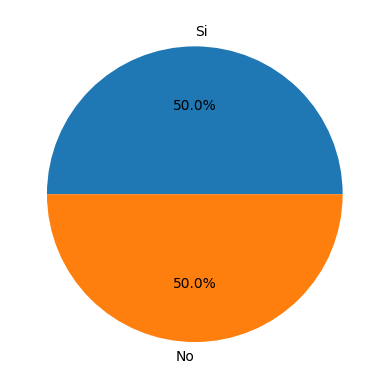

In [40]:
dfsub = submuestreo(full_data_encoded, "RainTomorrow")
plt.pie(dfsub["RainTomorrow"].value_counts(), labels=["Si", "No"], autopct='%1.1f%%')

In [41]:
logmodel = LogisticRegression(random_state=42)
dflogx = dfsub.copy()
dflogy = dflogx["RainTomorrow"].copy()
dflogx.drop("RainTomorrow", axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(dflogx, dflogy, test_size=0.3, random_state=42)
logmodel.fit(X_train, y_train)

/usr/local/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=42)

In [42]:
y_predict = logmodel.predict(X_test)
conf_matrix = pd.DataFrame(confusion_matrix(y_test, y_predict), columns=["Negativo Predicho", "Positivo Predicho"], index=["Real Negativo", "Real Positivo"])
print(confusion_matrix(y_test, y_predict))
print(classification_report(y_test, y_predict))

[[763   4]
 [ 18 712]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       767
           1       0.99      0.98      0.98       730

    accuracy                           0.99      1497
   macro avg       0.99      0.99      0.99      1497
weighted avg       0.99      0.99      0.99      1497



In [43]:
conf_matrix

,Negativo Predicho,Positivo Predicho
Real Negativo,763,4
Real Positivo,18,712


## SMOTE
Esta librería realiza los siguientes pasos para equilibrar el dataset
1. Para cada fila de la clase minoritaria, se identifican sus k vecinos más cercanos
2. Se selecciona aleatoriamente uno de los vecinos cercanos y se lo etiqueta como *Vecino Cercano*
3. Se elige un valor aleatorio entre 0 y 1, luego multiplica la diferencia entre la instancia actual y el *Vecino Cercano* por el valor aleatorio. Este resultado se suma a la instancia actual para crear una nueva con diferentes datos

In [44]:
dfsx = dfsub.copy()
dfsy = dfsx["RainTomorrow"].copy()
dfsx.drop("RainTomorrow", axis=1, inplace=True)
smote = SMOTE(random_state=42)
xsmote, ysmote = smote.fit_resample(dfsx, dfsy)
X_train, X_test, y_train, y_test = train_test_split(xsmote, ysmote, test_size=0.3, random_state=42)

In [45]:
logmodel = LogisticRegression(random_state=42, max_iter=1000)
logmodel.fit(X_train, y_train)
logpredict = logmodel.predict(X_test)

In [46]:
print(confusion_matrix(y_test, logpredict))
print(classification_report(y_test, logpredict))

[[763   4]
 [ 18 712]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       767
           1       0.99      0.98      0.98       730

    accuracy                           0.99      1497
   macro avg       0.99      0.99      0.99      1497
weighted avg       0.99      0.99      0.99      1497



In [47]:
confusion_matrix_smote = pd.DataFrame(confusion_matrix(y_test, logpredict), columns=["Negativo Predicho", "Positivo Predicho"], index=["Real Negativo", "Real Positivo"])
confusion_matrix_smote

,Negativo Predicho,Positivo Predicho
Real Negativo,763,4
Real Positivo,18,712


## Conclusión
Vemos que cualquiera de los tres métodos son útiles ya que en todos obtenemos *precision*, *recall* y *f1-score* de 0.99 y 0.98. Además, en todas las matrices de confusión podemos ver que hay muchos Negativos Positivos y Reales Positivos

## Redes neuronales con Tensorflow

In [48]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Input, Dropout
from tensorflow.keras.models import clone_model
import os
import optuna
tf.config.run_functions_eagerly(True)
tf.data.experimental.enable_debug_mode()

2023-12-05 23:07:30.218412: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/usr/local/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


#### Crear modelo para clasificación (Llueve / No llueve)

In [49]:
def objetivo_clas(trial: optuna.trial.Trial):
    num_capas = trial.suggest_int("num_layers", 1, 4)
    model = Sequential()
    for i in range(num_capas):
        num_conexiones = trial.suggest_int(f"n_units_layer_{i}", 4, 200)
        model.add(Dense(num_conexiones, activation="relu"))
    model.add(Dense(1, activation="sigmoid"))
    model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
    model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32)
    score = model.evaluate(X_test, y_test, verbose=0)
    return score[1]

Se define una función objetivo para poder encontrar los mejores hiperparámetros para el modelo. Luego, se utiliza *optuna* para maximizar la función

In [50]:
estudio = optuna.create_study(direction="maximize")
estudio.optimize(objetivo_clas, n_trials=50)

[I 2023-12-05 23:07:55,017] A new study created in memory with name: no-name-16b0ead1-4052-4952-b22f-12234dd2fa9c


Epoch 1/10
110/110 [==============================] - 4s 35ms/step - loss: 0.4114 - accuracy: 0.8164 - val_loss: 0.2762 - val_accuracy: 0.8838
Epoch 2/10
110/110 [==============================] - 4s 35ms/step - loss: 0.1949 - accuracy: 0.9244 - val_loss: 0.1349 - val_accuracy: 0.9646
Epoch 3/10
110/110 [==============================] - 4s 32ms/step - loss: 0.0992 - accuracy: 0.9616 - val_loss: 0.0817 - val_accuracy: 0.9619
Epoch 4/10
110/110 [==============================] - 4s 35ms/step - loss: 0.0528 - accuracy: 0.9805 - val_loss: 0.0632 - val_accuracy: 0.9766
Epoch 5/10
110/110 [==============================] - 4s 35ms/step - loss: 0.0433 - accuracy: 0.9837 - val_loss: 0.0905 - val_accuracy: 0.9666
Epoch 6/10
110/110 [==============================] - 4s 35ms/step - loss: 0.0348 - accuracy: 0.9880 - val_loss: 0.0637 - val_accuracy: 0.9719
Epoch 7/10
110/110 [==============================] - 4s 33ms/step - loss: 0.0217 - accuracy: 0.9931 - val_loss: 0.0596 - val_accuracy: 0.9766

[I 2023-12-05 23:08:33,203] Trial 0 finished with value: 0.9812959432601929 and parameters: {'num_layers': 3, 'n_units_layer_0': 112, 'n_units_layer_1': 28, 'n_units_layer_2': 105}. Best is trial 0 with value: 0.9812959432601929.


Epoch 1/10
110/110 [==============================] - 3s 26ms/step - loss: 0.4067 - accuracy: 0.8201 - val_loss: 0.3069 - val_accuracy: 0.8711
Epoch 2/10
110/110 [==============================] - 3s 25ms/step - loss: 0.2365 - accuracy: 0.9106 - val_loss: 0.1886 - val_accuracy: 0.9312
Epoch 3/10
110/110 [==============================] - 3s 25ms/step - loss: 0.1377 - accuracy: 0.9562 - val_loss: 0.1298 - val_accuracy: 0.9466
Epoch 4/10
110/110 [==============================] - 3s 26ms/step - loss: 0.0870 - accuracy: 0.9731 - val_loss: 0.0789 - val_accuracy: 0.9739
Epoch 5/10
110/110 [==============================] - 3s 25ms/step - loss: 0.0550 - accuracy: 0.9868 - val_loss: 0.0581 - val_accuracy: 0.9826
Epoch 6/10
110/110 [==============================] - 3s 25ms/step - loss: 0.0358 - accuracy: 0.9940 - val_loss: 0.0600 - val_accuracy: 0.9733
Epoch 7/10
110/110 [==============================] - 3s 24ms/step - loss: 0.0301 - accuracy: 0.9931 - val_loss: 0.0404 - val_accuracy: 0.9873

[I 2023-12-05 23:09:01,060] Trial 1 finished with value: 0.9879759550094604 and parameters: {'num_layers': 2, 'n_units_layer_0': 196, 'n_units_layer_1': 19}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.5580 - accuracy: 0.6989 - val_loss: 0.4501 - val_accuracy: 0.7862
Epoch 2/10
110/110 [==============================] - 3s 23ms/step - loss: 0.4047 - accuracy: 0.8244 - val_loss: 0.3846 - val_accuracy: 0.8263
Epoch 3/10
110/110 [==============================] - 3s 23ms/step - loss: 0.3489 - accuracy: 0.8519 - val_loss: 0.3352 - val_accuracy: 0.8564
Epoch 4/10
110/110 [==============================] - 2s 23ms/step - loss: 0.3047 - accuracy: 0.8757 - val_loss: 0.2965 - val_accuracy: 0.8771
Epoch 5/10
110/110 [==============================] - 3s 23ms/step - loss: 0.2652 - accuracy: 0.8969 - val_loss: 0.2596 - val_accuracy: 0.8991
Epoch 6/10
110/110 [==============================] - 3s 23ms/step - loss: 0.2319 - accuracy: 0.9141 - val_loss: 0.2267 - val_accuracy: 0.9185
Epoch 7/10
110/110 [==============================] - 3s 26ms/step - loss: 0.2012 - accuracy: 0.9258 - val_loss: 0.2023 - val_accuracy: 0.9279

[I 2023-12-05 23:09:27,466] Trial 2 finished with value: 0.9585838317871094 and parameters: {'num_layers': 1, 'n_units_layer_0': 45}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 3s 24ms/step - loss: 0.4435 - accuracy: 0.7926 - val_loss: 0.3754 - val_accuracy: 0.8350
Epoch 2/10
110/110 [==============================] - 3s 23ms/step - loss: 0.3231 - accuracy: 0.8611 - val_loss: 0.3056 - val_accuracy: 0.8737
Epoch 3/10
110/110 [==============================] - 3s 25ms/step - loss: 0.2547 - accuracy: 0.8989 - val_loss: 0.2360 - val_accuracy: 0.9098
Epoch 4/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1985 - accuracy: 0.9270 - val_loss: 0.1867 - val_accuracy: 0.9385
Epoch 5/10
110/110 [==============================] - 3s 27ms/step - loss: 0.1563 - accuracy: 0.9484 - val_loss: 0.1539 - val_accuracy: 0.9439
Epoch 6/10
110/110 [==============================] - 3s 25ms/step - loss: 0.1261 - accuracy: 0.9630 - val_loss: 0.1271 - val_accuracy: 0.9606
Epoch 7/10
110/110 [==============================] - 3s 27ms/step - loss: 0.1024 - accuracy: 0.9734 - val_loss: 0.1019 - val_accuracy: 0.9713

[I 2023-12-05 23:09:56,315] Trial 3 finished with value: 0.9886439442634583 and parameters: {'num_layers': 1, 'n_units_layer_0': 149}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 4s 36ms/step - loss: 0.4186 - accuracy: 0.8124 - val_loss: 0.3153 - val_accuracy: 0.8664
Epoch 2/10
110/110 [==============================] - 4s 33ms/step - loss: 0.2489 - accuracy: 0.8975 - val_loss: 0.2022 - val_accuracy: 0.9172
Epoch 3/10
110/110 [==============================] - 4s 36ms/step - loss: 0.1453 - accuracy: 0.9456 - val_loss: 0.1197 - val_accuracy: 0.9546
Epoch 4/10
110/110 [==============================] - 3s 27ms/step - loss: 0.0845 - accuracy: 0.9731 - val_loss: 0.0832 - val_accuracy: 0.9706
Epoch 5/10
110/110 [==============================] - 3s 30ms/step - loss: 0.0550 - accuracy: 0.9840 - val_loss: 0.0503 - val_accuracy: 0.9826
Epoch 6/10
110/110 [==============================] - 3s 27ms/step - loss: 0.0354 - accuracy: 0.9897 - val_loss: 0.0401 - val_accuracy: 0.9866
Epoch 7/10
110/110 [==============================] - 3s 30ms/step - loss: 0.0286 - accuracy: 0.9920 - val_loss: 0.0528 - val_accuracy: 0.9786

[I 2023-12-05 23:10:29,759] Trial 4 finished with value: 0.9779559373855591 and parameters: {'num_layers': 2, 'n_units_layer_0': 94, 'n_units_layer_1': 99}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 30ms/step - loss: 0.3508 - accuracy: 0.8387 - val_loss: 0.2087 - val_accuracy: 0.9192
Epoch 2/10
110/110 [==============================] - 4s 34ms/step - loss: 0.1695 - accuracy: 0.9327 - val_loss: 0.1130 - val_accuracy: 0.9593
Epoch 3/10
110/110 [==============================] - 4s 39ms/step - loss: 0.0812 - accuracy: 0.9688 - val_loss: 0.1082 - val_accuracy: 0.9559
Epoch 4/10
110/110 [==============================] - 4s 36ms/step - loss: 0.0385 - accuracy: 0.9863 - val_loss: 0.0589 - val_accuracy: 0.9766
Epoch 5/10
110/110 [==============================] - 4s 35ms/step - loss: 0.0414 - accuracy: 0.9825 - val_loss: 0.0866 - val_accuracy: 0.9706
Epoch 6/10
110/110 [==============================] - 3s 30ms/step - loss: 0.0308 - accuracy: 0.9868 - val_loss: 0.0588 - val_accuracy: 0.9773
Epoch 7/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0145 - accuracy: 0.9948 - val_loss: 0.0539 - val_accuracy: 0.9806

[I 2023-12-05 23:11:07,048] Trial 5 finished with value: 0.9772878885269165 and parameters: {'num_layers': 3, 'n_units_layer_0': 102, 'n_units_layer_1': 180, 'n_units_layer_2': 124}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 28ms/step - loss: 0.3900 - accuracy: 0.8227 - val_loss: 0.2775 - val_accuracy: 0.8844
Epoch 2/10
110/110 [==============================] - 3s 28ms/step - loss: 0.2012 - accuracy: 0.9238 - val_loss: 0.1565 - val_accuracy: 0.9559
Epoch 3/10
110/110 [==============================] - 4s 33ms/step - loss: 0.1073 - accuracy: 0.9639 - val_loss: 0.0845 - val_accuracy: 0.9699
Epoch 4/10
110/110 [==============================] - 4s 33ms/step - loss: 0.0625 - accuracy: 0.9785 - val_loss: 0.0760 - val_accuracy: 0.9679
Epoch 5/10
110/110 [==============================] - 3s 27ms/step - loss: 0.0376 - accuracy: 0.9891 - val_loss: 0.0586 - val_accuracy: 0.9760
Epoch 6/10
110/110 [==============================] - 3s 27ms/step - loss: 0.0436 - accuracy: 0.9834 - val_loss: 0.0713 - val_accuracy: 0.9699
Epoch 7/10
110/110 [==============================] - 3s 29ms/step - loss: 0.0224 - accuracy: 0.9943 - val_loss: 0.0441 - val_accuracy: 0.9840

[I 2023-12-05 23:11:38,736] Trial 6 finished with value: 0.9853039383888245 and parameters: {'num_layers': 2, 'n_units_layer_0': 187, 'n_units_layer_1': 101}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 25ms/step - loss: 0.5021 - accuracy: 0.7522 - val_loss: 0.4425 - val_accuracy: 0.7943
Epoch 2/10
110/110 [==============================] - 3s 23ms/step - loss: 0.3893 - accuracy: 0.8221 - val_loss: 0.3788 - val_accuracy: 0.8330
Epoch 3/10
110/110 [==============================] - 3s 23ms/step - loss: 0.3349 - accuracy: 0.8599 - val_loss: 0.3294 - val_accuracy: 0.8530
Epoch 4/10
110/110 [==============================] - 2s 21ms/step - loss: 0.2897 - accuracy: 0.8803 - val_loss: 0.2849 - val_accuracy: 0.8838
Epoch 5/10
110/110 [==============================] - 2s 21ms/step - loss: 0.2511 - accuracy: 0.9040 - val_loss: 0.2488 - val_accuracy: 0.9051
Epoch 6/10
110/110 [==============================] - 2s 21ms/step - loss: 0.2151 - accuracy: 0.9221 - val_loss: 0.2166 - val_accuracy: 0.9178
Epoch 7/10
110/110 [==============================] - 2s 21ms/step - loss: 0.1867 - accuracy: 0.9364 - val_loss: 0.1860 - val_accuracy: 0.9352

[I 2023-12-05 23:12:04,221] Trial 7 finished with value: 0.9639278650283813 and parameters: {'num_layers': 1, 'n_units_layer_0': 54}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 4s 34ms/step - loss: 0.3617 - accuracy: 0.8407 - val_loss: 0.3023 - val_accuracy: 0.8824
Epoch 2/10
110/110 [==============================] - 4s 33ms/step - loss: 0.1593 - accuracy: 0.9361 - val_loss: 0.1637 - val_accuracy: 0.9399
Epoch 3/10
110/110 [==============================] - 4s 33ms/step - loss: 0.0802 - accuracy: 0.9671 - val_loss: 0.0678 - val_accuracy: 0.9713
Epoch 4/10
110/110 [==============================] - 4s 32ms/step - loss: 0.0730 - accuracy: 0.9716 - val_loss: 0.1011 - val_accuracy: 0.9626
Epoch 5/10
110/110 [==============================] - 4s 32ms/step - loss: 0.0374 - accuracy: 0.9854 - val_loss: 0.1564 - val_accuracy: 0.9412
Epoch 6/10
110/110 [==============================] - 3s 32ms/step - loss: 0.0290 - accuracy: 0.9911 - val_loss: 0.1163 - val_accuracy: 0.9626
Epoch 7/10
110/110 [==============================] - 4s 37ms/step - loss: 0.0173 - accuracy: 0.9946 - val_loss: 0.0649 - val_accuracy: 0.9753

[I 2023-12-05 23:12:42,330] Trial 8 finished with value: 0.9812959432601929 and parameters: {'num_layers': 3, 'n_units_layer_0': 115, 'n_units_layer_1': 194, 'n_units_layer_2': 79}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 4s 37ms/step - loss: 0.4567 - accuracy: 0.7849 - val_loss: 0.3793 - val_accuracy: 0.8310
Epoch 2/10
110/110 [==============================] - 3s 30ms/step - loss: 0.3000 - accuracy: 0.8742 - val_loss: 0.2641 - val_accuracy: 0.8884
Epoch 3/10
110/110 [==============================] - 4s 32ms/step - loss: 0.1865 - accuracy: 0.9227 - val_loss: 0.1954 - val_accuracy: 0.9225
Epoch 4/10
110/110 [==============================] - 4s 32ms/step - loss: 0.1257 - accuracy: 0.9519 - val_loss: 0.1185 - val_accuracy: 0.9512
Epoch 5/10
110/110 [==============================] - 4s 34ms/step - loss: 0.0767 - accuracy: 0.9714 - val_loss: 0.0874 - val_accuracy: 0.9646
Epoch 6/10
110/110 [==============================] - 4s 32ms/step - loss: 0.0527 - accuracy: 0.9825 - val_loss: 0.0735 - val_accuracy: 0.9706
Epoch 7/10
110/110 [==============================] - 4s 33ms/step - loss: 0.0394 - accuracy: 0.9868 - val_loss: 0.0609 - val_accuracy: 0.9726

[I 2023-12-05 23:13:18,766] Trial 9 finished with value: 0.9746158719062805 and parameters: {'num_layers': 3, 'n_units_layer_0': 30, 'n_units_layer_1': 92, 'n_units_layer_2': 57}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 4s 38ms/step - loss: 0.3798 - accuracy: 0.8370 - val_loss: 0.2253 - val_accuracy: 0.9092
Epoch 2/10
110/110 [==============================] - 4s 34ms/step - loss: 0.1635 - accuracy: 0.9330 - val_loss: 0.1074 - val_accuracy: 0.9633
Epoch 3/10
110/110 [==============================] - 4s 33ms/step - loss: 0.0754 - accuracy: 0.9714 - val_loss: 0.0728 - val_accuracy: 0.9713
Epoch 4/10
110/110 [==============================] - 4s 32ms/step - loss: 0.0448 - accuracy: 0.9802 - val_loss: 0.1188 - val_accuracy: 0.9572
Epoch 5/10
110/110 [==============================] - 4s 34ms/step - loss: 0.0401 - accuracy: 0.9868 - val_loss: 0.0650 - val_accuracy: 0.9760
Epoch 6/10
110/110 [==============================] - 4s 36ms/step - loss: 0.0334 - accuracy: 0.9894 - val_loss: 0.0505 - val_accuracy: 0.9786
Epoch 7/10
110/110 [==============================] - 4s 35ms/step - loss: 0.0219 - accuracy: 0.9940 - val_loss: 0.0584 - val_accuracy: 0.9806

[I 2023-12-05 23:13:57,156] Trial 10 finished with value: 0.9746158719062805 and parameters: {'num_layers': 4, 'n_units_layer_0': 153, 'n_units_layer_1': 145, 'n_units_layer_2': 197, 'n_units_layer_3': 14}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 2s 22ms/step - loss: 0.4417 - accuracy: 0.7978 - val_loss: 0.3730 - val_accuracy: 0.8357
Epoch 2/10
110/110 [==============================] - 2s 21ms/step - loss: 0.3155 - accuracy: 0.8682 - val_loss: 0.2889 - val_accuracy: 0.8798
Epoch 3/10
110/110 [==============================] - 2s 21ms/step - loss: 0.2471 - accuracy: 0.9020 - val_loss: 0.2341 - val_accuracy: 0.9071
Epoch 4/10
110/110 [==============================] - 3s 23ms/step - loss: 0.1940 - accuracy: 0.9275 - val_loss: 0.1812 - val_accuracy: 0.9365
Epoch 5/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1504 - accuracy: 0.9545 - val_loss: 0.1406 - val_accuracy: 0.9552
Epoch 6/10
110/110 [==============================] - 2s 21ms/step - loss: 0.1184 - accuracy: 0.9659 - val_loss: 0.1156 - val_accuracy: 0.9659
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0947 - accuracy: 0.9748 - val_loss: 0.0951 - val_accuracy: 0.9753

[I 2023-12-05 23:14:21,404] Trial 11 finished with value: 0.9846359491348267 and parameters: {'num_layers': 1, 'n_units_layer_0': 199}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 24ms/step - loss: 0.4561 - accuracy: 0.7843 - val_loss: 0.3427 - val_accuracy: 0.8524
Epoch 2/10
110/110 [==============================] - 3s 24ms/step - loss: 0.2750 - accuracy: 0.8860 - val_loss: 0.2317 - val_accuracy: 0.9185
Epoch 3/10
110/110 [==============================] - 3s 26ms/step - loss: 0.1773 - accuracy: 0.9333 - val_loss: 0.1454 - val_accuracy: 0.9492
Epoch 4/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1102 - accuracy: 0.9668 - val_loss: 0.0978 - val_accuracy: 0.9739
Epoch 5/10
110/110 [==============================] - 3s 24ms/step - loss: 0.0715 - accuracy: 0.9799 - val_loss: 0.0715 - val_accuracy: 0.9820
Epoch 6/10
110/110 [==============================] - 3s 25ms/step - loss: 0.0525 - accuracy: 0.9868 - val_loss: 0.0545 - val_accuracy: 0.9866
Epoch 7/10
110/110 [==============================] - 3s 27ms/step - loss: 0.0367 - accuracy: 0.9920 - val_loss: 0.0529 - val_accuracy: 0.9800

[I 2023-12-05 23:14:50,715] Trial 12 finished with value: 0.9853039383888245 and parameters: {'num_layers': 2, 'n_units_layer_0': 159, 'n_units_layer_1': 13}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 27ms/step - loss: 0.4390 - accuracy: 0.7989 - val_loss: 0.3719 - val_accuracy: 0.8383
Epoch 2/10
110/110 [==============================] - 3s 23ms/step - loss: 0.3216 - accuracy: 0.8662 - val_loss: 0.2987 - val_accuracy: 0.8737
Epoch 3/10
110/110 [==============================] - 3s 24ms/step - loss: 0.2481 - accuracy: 0.9043 - val_loss: 0.2301 - val_accuracy: 0.9145
Epoch 4/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1910 - accuracy: 0.9335 - val_loss: 0.1822 - val_accuracy: 0.9379
Epoch 5/10
110/110 [==============================] - 3s 25ms/step - loss: 0.1511 - accuracy: 0.9499 - val_loss: 0.1431 - val_accuracy: 0.9506
Epoch 6/10
110/110 [==============================] - 3s 25ms/step - loss: 0.1189 - accuracy: 0.9688 - val_loss: 0.1167 - val_accuracy: 0.9646
Epoch 7/10
110/110 [==============================] - 3s 25ms/step - loss: 0.0945 - accuracy: 0.9751 - val_loss: 0.1013 - val_accuracy: 0.9693

[I 2023-12-05 23:15:17,888] Trial 13 finished with value: 0.9786239266395569 and parameters: {'num_layers': 1, 'n_units_layer_0': 162}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 29ms/step - loss: 0.4169 - accuracy: 0.8078 - val_loss: 0.3120 - val_accuracy: 0.8724
Epoch 2/10
110/110 [==============================] - 3s 28ms/step - loss: 0.2355 - accuracy: 0.9060 - val_loss: 0.1882 - val_accuracy: 0.9372
Epoch 3/10
110/110 [==============================] - 3s 29ms/step - loss: 0.1263 - accuracy: 0.9582 - val_loss: 0.1051 - val_accuracy: 0.9659
Epoch 4/10
110/110 [==============================] - 3s 28ms/step - loss: 0.0759 - accuracy: 0.9765 - val_loss: 0.0871 - val_accuracy: 0.9586
Epoch 5/10
110/110 [==============================] - 3s 27ms/step - loss: 0.0473 - accuracy: 0.9874 - val_loss: 0.0661 - val_accuracy: 0.9719
Epoch 6/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0346 - accuracy: 0.9928 - val_loss: 0.0573 - val_accuracy: 0.9806
Epoch 7/10
110/110 [==============================] - 3s 26ms/step - loss: 0.0278 - accuracy: 0.9934 - val_loss: 0.0454 - val_accuracy: 0.9800

[I 2023-12-05 23:15:51,800] Trial 14 finished with value: 0.9879759550094604 and parameters: {'num_layers': 2, 'n_units_layer_0': 137, 'n_units_layer_1': 51}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 25ms/step - loss: 0.4506 - accuracy: 0.7897 - val_loss: 0.3671 - val_accuracy: 0.8470
Epoch 2/10
110/110 [==============================] - 2s 22ms/step - loss: 0.3174 - accuracy: 0.8674 - val_loss: 0.2906 - val_accuracy: 0.8864
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.2484 - accuracy: 0.9026 - val_loss: 0.2310 - val_accuracy: 0.9198
Epoch 4/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1915 - accuracy: 0.9307 - val_loss: 0.1808 - val_accuracy: 0.9419
Epoch 5/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1514 - accuracy: 0.9510 - val_loss: 0.1440 - val_accuracy: 0.9479
Epoch 6/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1186 - accuracy: 0.9651 - val_loss: 0.1143 - val_accuracy: 0.9599
Epoch 7/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0943 - accuracy: 0.9765 - val_loss: 0.1024 - val_accuracy: 0.9606

[I 2023-12-05 23:16:22,686] Trial 15 finished with value: 0.9772878885269165 and parameters: {'num_layers': 1, 'n_units_layer_0': 179}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 30ms/step - loss: 0.3966 - accuracy: 0.8190 - val_loss: 0.3099 - val_accuracy: 0.8664
Epoch 2/10
110/110 [==============================] - 3s 27ms/step - loss: 0.2264 - accuracy: 0.9141 - val_loss: 0.1801 - val_accuracy: 0.9365
Epoch 3/10
110/110 [==============================] - 3s 30ms/step - loss: 0.1339 - accuracy: 0.9536 - val_loss: 0.1043 - val_accuracy: 0.9659
Epoch 4/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0747 - accuracy: 0.9794 - val_loss: 0.0666 - val_accuracy: 0.9846
Epoch 5/10
110/110 [==============================] - 5s 42ms/step - loss: 0.0470 - accuracy: 0.9900 - val_loss: 0.0501 - val_accuracy: 0.9826
Epoch 6/10
110/110 [==============================] - 4s 34ms/step - loss: 0.0356 - accuracy: 0.9917 - val_loss: 0.0567 - val_accuracy: 0.9746
Epoch 7/10
110/110 [==============================] - 3s 28ms/step - loss: 0.0364 - accuracy: 0.9860 - val_loss: 0.0344 - val_accuracy: 0.9900

[I 2023-12-05 23:16:58,717] Trial 16 finished with value: 0.9853039383888245 and parameters: {'num_layers': 2, 'n_units_layer_0': 135, 'n_units_layer_1': 60}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 5s 46ms/step - loss: 0.4571 - accuracy: 0.7909 - val_loss: 0.3742 - val_accuracy: 0.8363
Epoch 2/10
110/110 [==============================] - 3s 23ms/step - loss: 0.3219 - accuracy: 0.8668 - val_loss: 0.2988 - val_accuracy: 0.8831
Epoch 3/10
110/110 [==============================] - 3s 23ms/step - loss: 0.2527 - accuracy: 0.9009 - val_loss: 0.2343 - val_accuracy: 0.9158
Epoch 4/10
110/110 [==============================] - 3s 29ms/step - loss: 0.1971 - accuracy: 0.9301 - val_loss: 0.1866 - val_accuracy: 0.9392
Epoch 5/10
110/110 [==============================] - 3s 29ms/step - loss: 0.1561 - accuracy: 0.9453 - val_loss: 0.1491 - val_accuracy: 0.9519
Epoch 6/10
110/110 [==============================] - 3s 26ms/step - loss: 0.1248 - accuracy: 0.9593 - val_loss: 0.1220 - val_accuracy: 0.9559
Epoch 7/10
110/110 [==============================] - 3s 25ms/step - loss: 0.0991 - accuracy: 0.9714 - val_loss: 0.0980 - val_accuracy: 0.9753

[I 2023-12-05 23:17:30,984] Trial 17 finished with value: 0.9826319217681885 and parameters: {'num_layers': 1, 'n_units_layer_0': 174}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 6s 49ms/step - loss: 0.3725 - accuracy: 0.8350 - val_loss: 0.2082 - val_accuracy: 0.9158
Epoch 2/10
110/110 [==============================] - 5s 47ms/step - loss: 0.1457 - accuracy: 0.9427 - val_loss: 0.0905 - val_accuracy: 0.9699
Epoch 3/10
110/110 [==============================] - 6s 54ms/step - loss: 0.0653 - accuracy: 0.9745 - val_loss: 0.0794 - val_accuracy: 0.9679
Epoch 4/10
110/110 [==============================] - 6s 56ms/step - loss: 0.0572 - accuracy: 0.9765 - val_loss: 0.0691 - val_accuracy: 0.9673
Epoch 5/10
110/110 [==============================] - 7s 63ms/step - loss: 0.0310 - accuracy: 0.9888 - val_loss: 0.0396 - val_accuracy: 0.9840
Epoch 6/10
110/110 [==============================] - 6s 57ms/step - loss: 0.0207 - accuracy: 0.9928 - val_loss: 0.1031 - val_accuracy: 0.9552
Epoch 7/10
110/110 [==============================] - 7s 67ms/step - loss: 0.0273 - accuracy: 0.9880 - val_loss: 0.0456 - val_accuracy: 0.9846

[I 2023-12-05 23:18:29,455] Trial 18 finished with value: 0.9839679598808289 and parameters: {'num_layers': 4, 'n_units_layer_0': 200, 'n_units_layer_1': 145, 'n_units_layer_2': 6, 'n_units_layer_3': 179}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 4s 39ms/step - loss: 0.4511 - accuracy: 0.7900 - val_loss: 0.3515 - val_accuracy: 0.8477
Epoch 2/10
110/110 [==============================] - 3s 31ms/step - loss: 0.2783 - accuracy: 0.8840 - val_loss: 0.2502 - val_accuracy: 0.8945
Epoch 3/10
110/110 [==============================] - 3s 31ms/step - loss: 0.1785 - accuracy: 0.9301 - val_loss: 0.1536 - val_accuracy: 0.9432
Epoch 4/10
110/110 [==============================] - 4s 36ms/step - loss: 0.1105 - accuracy: 0.9619 - val_loss: 0.0976 - val_accuracy: 0.9706
Epoch 5/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0720 - accuracy: 0.9779 - val_loss: 0.0743 - val_accuracy: 0.9746
Epoch 6/10
110/110 [==============================] - 3s 27ms/step - loss: 0.0502 - accuracy: 0.9848 - val_loss: 0.0569 - val_accuracy: 0.9786
Epoch 7/10
110/110 [==============================] - 3s 28ms/step - loss: 0.0379 - accuracy: 0.9894 - val_loss: 0.0544 - val_accuracy: 0.9800

[I 2023-12-05 23:19:04,946] Trial 19 finished with value: 0.9866399168968201 and parameters: {'num_layers': 2, 'n_units_layer_0': 69, 'n_units_layer_1': 59}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 25ms/step - loss: 0.4632 - accuracy: 0.7760 - val_loss: 0.3760 - val_accuracy: 0.8410
Epoch 2/10
110/110 [==============================] - 3s 24ms/step - loss: 0.3289 - accuracy: 0.8616 - val_loss: 0.3049 - val_accuracy: 0.8751
Epoch 3/10
110/110 [==============================] - 3s 24ms/step - loss: 0.2617 - accuracy: 0.8969 - val_loss: 0.2418 - val_accuracy: 0.9092
Epoch 4/10
110/110 [==============================] - 3s 24ms/step - loss: 0.2078 - accuracy: 0.9235 - val_loss: 0.2133 - val_accuracy: 0.9238
Epoch 5/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1681 - accuracy: 0.9467 - val_loss: 0.1614 - val_accuracy: 0.9405
Epoch 6/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1346 - accuracy: 0.9579 - val_loss: 0.1297 - val_accuracy: 0.9593
Epoch 7/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1110 - accuracy: 0.9656 - val_loss: 0.1107 - val_accuracy: 0.9639

[I 2023-12-05 23:19:31,990] Trial 20 finished with value: 0.9866399168968201 and parameters: {'num_layers': 1, 'n_units_layer_0': 137}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 4s 34ms/step - loss: 0.4186 - accuracy: 0.8081 - val_loss: 0.3162 - val_accuracy: 0.8711
Epoch 2/10
110/110 [==============================] - 3s 26ms/step - loss: 0.2483 - accuracy: 0.9006 - val_loss: 0.2033 - val_accuracy: 0.9192
Epoch 3/10
110/110 [==============================] - 4s 36ms/step - loss: 0.1468 - accuracy: 0.9467 - val_loss: 0.1165 - val_accuracy: 0.9626
Epoch 4/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0827 - accuracy: 0.9768 - val_loss: 0.0748 - val_accuracy: 0.9766
Epoch 5/10
110/110 [==============================] - 3s 27ms/step - loss: 0.0531 - accuracy: 0.9845 - val_loss: 0.0547 - val_accuracy: 0.9846
Epoch 6/10
110/110 [==============================] - 3s 25ms/step - loss: 0.0367 - accuracy: 0.9920 - val_loss: 0.0446 - val_accuracy: 0.9853
Epoch 7/10
110/110 [==============================] - 3s 26ms/step - loss: 0.0253 - accuracy: 0.9960 - val_loss: 0.0414 - val_accuracy: 0.9826

[I 2023-12-05 23:20:03,603] Trial 21 finished with value: 0.9846359491348267 and parameters: {'num_layers': 2, 'n_units_layer_0': 139, 'n_units_layer_1': 43}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 27ms/step - loss: 0.5073 - accuracy: 0.7645 - val_loss: 0.4078 - val_accuracy: 0.8196
Epoch 2/10
110/110 [==============================] - 3s 25ms/step - loss: 0.3458 - accuracy: 0.8528 - val_loss: 0.3155 - val_accuracy: 0.8697
Epoch 3/10
110/110 [==============================] - 3s 25ms/step - loss: 0.2612 - accuracy: 0.8963 - val_loss: 0.2433 - val_accuracy: 0.9092
Epoch 4/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1920 - accuracy: 0.9321 - val_loss: 0.1790 - val_accuracy: 0.9392
Epoch 5/10
110/110 [==============================] - 3s 25ms/step - loss: 0.1409 - accuracy: 0.9539 - val_loss: 0.1287 - val_accuracy: 0.9566
Epoch 6/10
110/110 [==============================] - 3s 25ms/step - loss: 0.1019 - accuracy: 0.9699 - val_loss: 0.1043 - val_accuracy: 0.9719
Epoch 7/10
110/110 [==============================] - 3s 24ms/step - loss: 0.0735 - accuracy: 0.9828 - val_loss: 0.0774 - val_accuracy: 0.9753

[I 2023-12-05 23:20:31,745] Trial 22 finished with value: 0.9846359491348267 and parameters: {'num_layers': 2, 'n_units_layer_0': 82, 'n_units_layer_1': 6}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 26ms/step - loss: 0.3973 - accuracy: 0.8241 - val_loss: 0.3095 - val_accuracy: 0.8617
Epoch 2/10
110/110 [==============================] - 3s 25ms/step - loss: 0.2253 - accuracy: 0.9103 - val_loss: 0.1897 - val_accuracy: 0.9172
Epoch 3/10
110/110 [==============================] - 3s 25ms/step - loss: 0.1275 - accuracy: 0.9539 - val_loss: 0.1197 - val_accuracy: 0.9686
Epoch 4/10
110/110 [==============================] - 3s 25ms/step - loss: 0.0763 - accuracy: 0.9751 - val_loss: 0.0753 - val_accuracy: 0.9786
Epoch 5/10
110/110 [==============================] - 3s 29ms/step - loss: 0.0484 - accuracy: 0.9860 - val_loss: 0.0511 - val_accuracy: 0.9813
Epoch 6/10
110/110 [==============================] - 3s 25ms/step - loss: 0.0402 - accuracy: 0.9857 - val_loss: 0.0623 - val_accuracy: 0.9766
Epoch 7/10
110/110 [==============================] - 3s 25ms/step - loss: 0.0254 - accuracy: 0.9960 - val_loss: 0.0432 - val_accuracy: 0.9833

[I 2023-12-05 23:21:00,727] Trial 23 finished with value: 0.9853039383888245 and parameters: {'num_layers': 2, 'n_units_layer_0': 120, 'n_units_layer_1': 65}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 28ms/step - loss: 0.3787 - accuracy: 0.8284 - val_loss: 0.2245 - val_accuracy: 0.9138
Epoch 2/10
110/110 [==============================] - 3s 29ms/step - loss: 0.1649 - accuracy: 0.9327 - val_loss: 0.0987 - val_accuracy: 0.9613
Epoch 3/10
110/110 [==============================] - 3s 29ms/step - loss: 0.0739 - accuracy: 0.9716 - val_loss: 0.0628 - val_accuracy: 0.9733
Epoch 4/10
110/110 [==============================] - 3s 28ms/step - loss: 0.0449 - accuracy: 0.9831 - val_loss: 0.0640 - val_accuracy: 0.9753
Epoch 5/10
110/110 [==============================] - 3s 29ms/step - loss: 0.0326 - accuracy: 0.9900 - val_loss: 0.0865 - val_accuracy: 0.9666
Epoch 6/10
110/110 [==============================] - 3s 30ms/step - loss: 0.0253 - accuracy: 0.9911 - val_loss: 0.0581 - val_accuracy: 0.9760
Epoch 7/10
110/110 [==============================] - 3s 29ms/step - loss: 0.0269 - accuracy: 0.9897 - val_loss: 0.0962 - val_accuracy: 0.9713

[I 2023-12-05 23:21:32,881] Trial 24 finished with value: 0.9832999110221863 and parameters: {'num_layers': 3, 'n_units_layer_0': 168, 'n_units_layer_1': 34, 'n_units_layer_2': 200}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 26ms/step - loss: 0.5739 - accuracy: 0.7196 - val_loss: 0.4637 - val_accuracy: 0.7836
Epoch 2/10
110/110 [==============================] - 3s 24ms/step - loss: 0.4088 - accuracy: 0.8147 - val_loss: 0.3988 - val_accuracy: 0.8196
Epoch 3/10
110/110 [==============================] - 3s 24ms/step - loss: 0.3523 - accuracy: 0.8476 - val_loss: 0.3494 - val_accuracy: 0.8424
Epoch 4/10
110/110 [==============================] - 3s 25ms/step - loss: 0.3008 - accuracy: 0.8697 - val_loss: 0.2866 - val_accuracy: 0.8791
Epoch 5/10
110/110 [==============================] - 3s 25ms/step - loss: 0.2470 - accuracy: 0.9026 - val_loss: 0.2325 - val_accuracy: 0.9058
Epoch 6/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1942 - accuracy: 0.9218 - val_loss: 0.1792 - val_accuracy: 0.9319
Epoch 7/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1468 - accuracy: 0.9473 - val_loss: 0.1305 - val_accuracy: 0.9559

[I 2023-12-05 23:22:01,496] Trial 25 finished with value: 0.9839679598808289 and parameters: {'num_layers': 2, 'n_units_layer_0': 7, 'n_units_layer_1': 74}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 23ms/step - loss: 0.4712 - accuracy: 0.7620 - val_loss: 0.3894 - val_accuracy: 0.8270
Epoch 2/10
110/110 [==============================] - 3s 25ms/step - loss: 0.3395 - accuracy: 0.8565 - val_loss: 0.3132 - val_accuracy: 0.8657
Epoch 3/10
110/110 [==============================] - 3s 29ms/step - loss: 0.2671 - accuracy: 0.8900 - val_loss: 0.2550 - val_accuracy: 0.8978
Epoch 4/10
110/110 [==============================] - 3s 30ms/step - loss: 0.2100 - accuracy: 0.9229 - val_loss: 0.1951 - val_accuracy: 0.9312
Epoch 5/10
110/110 [==============================] - 3s 23ms/step - loss: 0.1647 - accuracy: 0.9436 - val_loss: 0.1565 - val_accuracy: 0.9499
Epoch 6/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1325 - accuracy: 0.9596 - val_loss: 0.1282 - val_accuracy: 0.9579
Epoch 7/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1076 - accuracy: 0.9708 - val_loss: 0.1070 - val_accuracy: 0.9679

[I 2023-12-05 23:22:29,145] Trial 26 finished with value: 0.9859719276428223 and parameters: {'num_layers': 1, 'n_units_layer_0': 150}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 25ms/step - loss: 0.4297 - accuracy: 0.7946 - val_loss: 0.3317 - val_accuracy: 0.8604
Epoch 2/10
110/110 [==============================] - 3s 26ms/step - loss: 0.2608 - accuracy: 0.8926 - val_loss: 0.2334 - val_accuracy: 0.9172
Epoch 3/10
110/110 [==============================] - 3s 26ms/step - loss: 0.1622 - accuracy: 0.9413 - val_loss: 0.1353 - val_accuracy: 0.9552
Epoch 4/10
110/110 [==============================] - 3s 29ms/step - loss: 0.1000 - accuracy: 0.9676 - val_loss: 0.0994 - val_accuracy: 0.9572
Epoch 5/10
110/110 [==============================] - 3s 28ms/step - loss: 0.0672 - accuracy: 0.9805 - val_loss: 0.0734 - val_accuracy: 0.9800
Epoch 6/10
110/110 [==============================] - 3s 29ms/step - loss: 0.0474 - accuracy: 0.9860 - val_loss: 0.0557 - val_accuracy: 0.9793
Epoch 7/10
110/110 [==============================] - 3s 28ms/step - loss: 0.0335 - accuracy: 0.9923 - val_loss: 0.0455 - val_accuracy: 0.9826

[I 2023-12-05 23:22:59,635] Trial 27 finished with value: 0.9866399168968201 and parameters: {'num_layers': 2, 'n_units_layer_0': 126, 'n_units_layer_1': 25}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 4s 31ms/step - loss: 0.3369 - accuracy: 0.8510 - val_loss: 0.1904 - val_accuracy: 0.9212
Epoch 2/10
110/110 [==============================] - 3s 30ms/step - loss: 0.1303 - accuracy: 0.9502 - val_loss: 0.0808 - val_accuracy: 0.9726
Epoch 3/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0808 - accuracy: 0.9676 - val_loss: 0.0813 - val_accuracy: 0.9706
Epoch 4/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0447 - accuracy: 0.9820 - val_loss: 0.0581 - val_accuracy: 0.9753
Epoch 5/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0379 - accuracy: 0.9865 - val_loss: 0.0456 - val_accuracy: 0.9833
Epoch 6/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0165 - accuracy: 0.9943 - val_loss: 0.0732 - val_accuracy: 0.9726
Epoch 7/10
110/110 [==============================] - 3s 30ms/step - loss: 0.0179 - accuracy: 0.9943 - val_loss: 0.1153 - val_accuracy: 0.9633

[I 2023-12-05 23:23:34,313] Trial 28 finished with value: 0.9866399168968201 and parameters: {'num_layers': 3, 'n_units_layer_0': 184, 'n_units_layer_1': 136, 'n_units_layer_2': 146}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 4s 35ms/step - loss: 0.4774 - accuracy: 0.7869 - val_loss: 0.3250 - val_accuracy: 0.8724
Epoch 2/10
110/110 [==============================] - 4s 33ms/step - loss: 0.2257 - accuracy: 0.9092 - val_loss: 0.1476 - val_accuracy: 0.9399
Epoch 3/10
110/110 [==============================] - 4s 36ms/step - loss: 0.1057 - accuracy: 0.9619 - val_loss: 0.0789 - val_accuracy: 0.9706
Epoch 4/10
110/110 [==============================] - 4s 34ms/step - loss: 0.0511 - accuracy: 0.9851 - val_loss: 0.0675 - val_accuracy: 0.9713
Epoch 5/10
110/110 [==============================] - 4s 34ms/step - loss: 0.0339 - accuracy: 0.9857 - val_loss: 0.0759 - val_accuracy: 0.9760
Epoch 6/10
110/110 [==============================] - 4s 35ms/step - loss: 0.0439 - accuracy: 0.9860 - val_loss: 0.0567 - val_accuracy: 0.9766
Epoch 7/10
110/110 [==============================] - 4s 34ms/step - loss: 0.0141 - accuracy: 0.9971 - val_loss: 0.0536 - val_accuracy: 0.9766

[I 2023-12-05 23:24:12,754] Trial 29 finished with value: 0.9692718982696533 and parameters: {'num_layers': 4, 'n_units_layer_0': 106, 'n_units_layer_1': 48, 'n_units_layer_2': 4, 'n_units_layer_3': 78}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 23ms/step - loss: 0.4405 - accuracy: 0.7989 - val_loss: 0.3634 - val_accuracy: 0.8450
Epoch 2/10
110/110 [==============================] - 2s 21ms/step - loss: 0.3146 - accuracy: 0.8674 - val_loss: 0.2951 - val_accuracy: 0.8798
Epoch 3/10
110/110 [==============================] - 3s 24ms/step - loss: 0.2500 - accuracy: 0.9009 - val_loss: 0.2355 - val_accuracy: 0.9092
Epoch 4/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1981 - accuracy: 0.9267 - val_loss: 0.1939 - val_accuracy: 0.9319
Epoch 5/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1589 - accuracy: 0.9473 - val_loss: 0.1542 - val_accuracy: 0.9472
Epoch 6/10
110/110 [==============================] - 2s 21ms/step - loss: 0.1278 - accuracy: 0.9636 - val_loss: 0.1239 - val_accuracy: 0.9566
Epoch 7/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1042 - accuracy: 0.9714 - val_loss: 0.1031 - val_accuracy: 0.9726

[I 2023-12-05 23:24:37,352] Trial 30 finished with value: 0.9859719276428223 and parameters: {'num_layers': 1, 'n_units_layer_0': 144}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 26ms/step - loss: 0.4233 - accuracy: 0.8075 - val_loss: 0.3427 - val_accuracy: 0.8597
Epoch 2/10
110/110 [==============================] - 3s 29ms/step - loss: 0.2691 - accuracy: 0.8932 - val_loss: 0.2294 - val_accuracy: 0.9125
Epoch 3/10
110/110 [==============================] - 3s 28ms/step - loss: 0.1750 - accuracy: 0.9367 - val_loss: 0.1528 - val_accuracy: 0.9439
Epoch 4/10
110/110 [==============================] - 3s 30ms/step - loss: 0.1108 - accuracy: 0.9602 - val_loss: 0.0944 - val_accuracy: 0.9686
Epoch 5/10
110/110 [==============================] - 3s 32ms/step - loss: 0.0751 - accuracy: 0.9765 - val_loss: 0.0706 - val_accuracy: 0.9813
Epoch 6/10
110/110 [==============================] - 3s 27ms/step - loss: 0.0490 - accuracy: 0.9851 - val_loss: 0.0576 - val_accuracy: 0.9780
Epoch 7/10
110/110 [==============================] - 3s 30ms/step - loss: 0.0366 - accuracy: 0.9897 - val_loss: 0.0524 - val_accuracy: 0.9780

[I 2023-12-05 23:25:08,899] Trial 31 finished with value: 0.9879759550094604 and parameters: {'num_layers': 2, 'n_units_layer_0': 68, 'n_units_layer_1': 79}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 27ms/step - loss: 0.4173 - accuracy: 0.8107 - val_loss: 0.3199 - val_accuracy: 0.8671
Epoch 2/10
110/110 [==============================] - 3s 26ms/step - loss: 0.2451 - accuracy: 0.8952 - val_loss: 0.2190 - val_accuracy: 0.9285
Epoch 3/10
110/110 [==============================] - 3s 26ms/step - loss: 0.1504 - accuracy: 0.9461 - val_loss: 0.1214 - val_accuracy: 0.9552
Epoch 4/10
110/110 [==============================] - 3s 26ms/step - loss: 0.0916 - accuracy: 0.9676 - val_loss: 0.0771 - val_accuracy: 0.9793
Epoch 5/10
110/110 [==============================] - 3s 26ms/step - loss: 0.0575 - accuracy: 0.9828 - val_loss: 0.0629 - val_accuracy: 0.9786
Epoch 6/10
110/110 [==============================] - 3s 25ms/step - loss: 0.0362 - accuracy: 0.9920 - val_loss: 0.0533 - val_accuracy: 0.9786
Epoch 7/10
110/110 [==============================] - 3s 26ms/step - loss: 0.0284 - accuracy: 0.9937 - val_loss: 0.0560 - val_accuracy: 0.9793

[I 2023-12-05 23:25:39,207] Trial 32 finished with value: 0.9826319217681885 and parameters: {'num_layers': 2, 'n_units_layer_0': 88, 'n_units_layer_1': 81}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 28ms/step - loss: 0.3999 - accuracy: 0.8284 - val_loss: 0.2979 - val_accuracy: 0.8791
Epoch 2/10
110/110 [==============================] - 3s 31ms/step - loss: 0.2359 - accuracy: 0.9055 - val_loss: 0.1849 - val_accuracy: 0.9345
Epoch 3/10
110/110 [==============================] - 4s 33ms/step - loss: 0.1339 - accuracy: 0.9542 - val_loss: 0.1163 - val_accuracy: 0.9559
Epoch 4/10
110/110 [==============================] - 3s 27ms/step - loss: 0.0849 - accuracy: 0.9708 - val_loss: 0.0769 - val_accuracy: 0.9746
Epoch 5/10
110/110 [==============================] - 3s 28ms/step - loss: 0.0540 - accuracy: 0.9814 - val_loss: 0.0596 - val_accuracy: 0.9733
Epoch 6/10
110/110 [==============================] - 3s 28ms/step - loss: 0.0392 - accuracy: 0.9894 - val_loss: 0.0650 - val_accuracy: 0.9733
Epoch 7/10
110/110 [==============================] - 3s 28ms/step - loss: 0.0301 - accuracy: 0.9923 - val_loss: 0.0464 - val_accuracy: 0.9826

[I 2023-12-05 23:26:12,022] Trial 33 finished with value: 0.9866399168968201 and parameters: {'num_layers': 2, 'n_units_layer_0': 74, 'n_units_layer_1': 123}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 4s 34ms/step - loss: 0.3912 - accuracy: 0.8304 - val_loss: 0.3050 - val_accuracy: 0.8677
Epoch 2/10
110/110 [==============================] - 4s 32ms/step - loss: 0.1863 - accuracy: 0.9264 - val_loss: 0.1339 - val_accuracy: 0.9526
Epoch 3/10
110/110 [==============================] - 4s 34ms/step - loss: 0.0981 - accuracy: 0.9636 - val_loss: 0.1076 - val_accuracy: 0.9526
Epoch 4/10
110/110 [==============================] - 4s 33ms/step - loss: 0.0576 - accuracy: 0.9811 - val_loss: 0.0644 - val_accuracy: 0.9760
Epoch 5/10
110/110 [==============================] - 4s 36ms/step - loss: 0.0356 - accuracy: 0.9877 - val_loss: 0.0550 - val_accuracy: 0.9760
Epoch 6/10
110/110 [==============================] - 3s 32ms/step - loss: 0.0252 - accuracy: 0.9905 - val_loss: 0.0534 - val_accuracy: 0.9753
Epoch 7/10
110/110 [==============================] - 4s 35ms/step - loss: 0.0203 - accuracy: 0.9934 - val_loss: 0.0470 - val_accuracy: 0.9813

[I 2023-12-05 23:26:49,051] Trial 34 finished with value: 0.9826319217681885 and parameters: {'num_layers': 3, 'n_units_layer_0': 126, 'n_units_layer_1': 50, 'n_units_layer_2': 51}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 31ms/step - loss: 0.4942 - accuracy: 0.7605 - val_loss: 0.4050 - val_accuracy: 0.8143
Epoch 2/10
110/110 [==============================] - 3s 29ms/step - loss: 0.3401 - accuracy: 0.8505 - val_loss: 0.3021 - val_accuracy: 0.8771
Epoch 3/10
110/110 [==============================] - 3s 27ms/step - loss: 0.2492 - accuracy: 0.9012 - val_loss: 0.2294 - val_accuracy: 0.9178
Epoch 4/10
110/110 [==============================] - 3s 28ms/step - loss: 0.1796 - accuracy: 0.9370 - val_loss: 0.1664 - val_accuracy: 0.9446
Epoch 5/10
110/110 [==============================] - 3s 26ms/step - loss: 0.1265 - accuracy: 0.9567 - val_loss: 0.1170 - val_accuracy: 0.9586
Epoch 6/10
110/110 [==============================] - 3s 26ms/step - loss: 0.0920 - accuracy: 0.9739 - val_loss: 0.0908 - val_accuracy: 0.9639
Epoch 7/10
110/110 [==============================] - 3s 26ms/step - loss: 0.0654 - accuracy: 0.9811 - val_loss: 0.0721 - val_accuracy: 0.9760

[I 2023-12-05 23:27:20,074] Trial 35 finished with value: 0.9853039383888245 and parameters: {'num_layers': 2, 'n_units_layer_0': 49, 'n_units_layer_1': 19}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 24ms/step - loss: 0.4929 - accuracy: 0.7631 - val_loss: 0.4109 - val_accuracy: 0.8116
Epoch 2/10
110/110 [==============================] - 3s 23ms/step - loss: 0.3638 - accuracy: 0.8436 - val_loss: 0.3384 - val_accuracy: 0.8530
Epoch 3/10
110/110 [==============================] - 2s 21ms/step - loss: 0.2988 - accuracy: 0.8800 - val_loss: 0.2823 - val_accuracy: 0.8898
Epoch 4/10
110/110 [==============================] - 2s 22ms/step - loss: 0.2447 - accuracy: 0.9026 - val_loss: 0.2379 - val_accuracy: 0.9118
Epoch 5/10
110/110 [==============================] - 2s 22ms/step - loss: 0.2019 - accuracy: 0.9261 - val_loss: 0.1960 - val_accuracy: 0.9359
Epoch 6/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1670 - accuracy: 0.9461 - val_loss: 0.1672 - val_accuracy: 0.9372
Epoch 7/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1386 - accuracy: 0.9553 - val_loss: 0.1393 - val_accuracy: 0.9599

[I 2023-12-05 23:27:47,954] Trial 36 finished with value: 0.9686038494110107 and parameters: {'num_layers': 1, 'n_units_layer_0': 99}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 26ms/step - loss: 0.4284 - accuracy: 0.8029 - val_loss: 0.3150 - val_accuracy: 0.8731
Epoch 2/10
110/110 [==============================] - 3s 26ms/step - loss: 0.2490 - accuracy: 0.8989 - val_loss: 0.1966 - val_accuracy: 0.9272
Epoch 3/10
110/110 [==============================] - 3s 26ms/step - loss: 0.1480 - accuracy: 0.9510 - val_loss: 0.1404 - val_accuracy: 0.9432
Epoch 4/10
110/110 [==============================] - 3s 25ms/step - loss: 0.0936 - accuracy: 0.9688 - val_loss: 0.0869 - val_accuracy: 0.9733
Epoch 5/10
110/110 [==============================] - 3s 30ms/step - loss: 0.0600 - accuracy: 0.9799 - val_loss: 0.0668 - val_accuracy: 0.9780
Epoch 6/10
110/110 [==============================] - 3s 28ms/step - loss: 0.0496 - accuracy: 0.9848 - val_loss: 0.0547 - val_accuracy: 0.9806
Epoch 7/10
110/110 [==============================] - 3s 25ms/step - loss: 0.0345 - accuracy: 0.9883 - val_loss: 0.0413 - val_accuracy: 0.9853

[I 2023-12-05 23:28:18,333] Trial 37 finished with value: 0.9866399168968201 and parameters: {'num_layers': 2, 'n_units_layer_0': 65, 'n_units_layer_1': 121}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 4s 32ms/step - loss: 0.4716 - accuracy: 0.7774 - val_loss: 0.3927 - val_accuracy: 0.8277
Epoch 2/10
110/110 [==============================] - 4s 32ms/step - loss: 0.3259 - accuracy: 0.8545 - val_loss: 0.2876 - val_accuracy: 0.8778
Epoch 3/10
110/110 [==============================] - 3s 31ms/step - loss: 0.2220 - accuracy: 0.9043 - val_loss: 0.1960 - val_accuracy: 0.9225
Epoch 4/10
110/110 [==============================] - 4s 35ms/step - loss: 0.1502 - accuracy: 0.9398 - val_loss: 0.1508 - val_accuracy: 0.9359
Epoch 5/10
110/110 [==============================] - 4s 32ms/step - loss: 0.1000 - accuracy: 0.9625 - val_loss: 0.0917 - val_accuracy: 0.9633
Epoch 6/10
110/110 [==============================] - 4s 33ms/step - loss: 0.0680 - accuracy: 0.9725 - val_loss: 0.0785 - val_accuracy: 0.9653
Epoch 7/10
110/110 [==============================] - 4s 35ms/step - loss: 0.0450 - accuracy: 0.9837 - val_loss: 0.0659 - val_accuracy: 0.9726

[I 2023-12-05 23:28:55,123] Trial 38 finished with value: 0.9786239266395569 and parameters: {'num_layers': 3, 'n_units_layer_0': 27, 'n_units_layer_1': 81, 'n_units_layer_2': 154}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 29ms/step - loss: 0.4455 - accuracy: 0.7826 - val_loss: 0.3395 - val_accuracy: 0.8557
Epoch 2/10
110/110 [==============================] - 3s 27ms/step - loss: 0.2667 - accuracy: 0.8932 - val_loss: 0.2358 - val_accuracy: 0.9152
Epoch 3/10
110/110 [==============================] - 3s 29ms/step - loss: 0.1639 - accuracy: 0.9410 - val_loss: 0.1385 - val_accuracy: 0.9452
Epoch 4/10
110/110 [==============================] - 3s 28ms/step - loss: 0.0993 - accuracy: 0.9682 - val_loss: 0.0874 - val_accuracy: 0.9773
Epoch 5/10
110/110 [==============================] - 3s 28ms/step - loss: 0.0651 - accuracy: 0.9814 - val_loss: 0.0709 - val_accuracy: 0.9646
Epoch 6/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0492 - accuracy: 0.9842 - val_loss: 0.0546 - val_accuracy: 0.9780
Epoch 7/10
110/110 [==============================] - 3s 32ms/step - loss: 0.0333 - accuracy: 0.9917 - val_loss: 0.0419 - val_accuracy: 0.9846

[I 2023-12-05 23:29:28,302] Trial 39 finished with value: 0.9806278944015503 and parameters: {'num_layers': 2, 'n_units_layer_0': 111, 'n_units_layer_1': 38}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 25ms/step - loss: 0.5033 - accuracy: 0.7453 - val_loss: 0.4247 - val_accuracy: 0.7989
Epoch 2/10
110/110 [==============================] - 3s 24ms/step - loss: 0.3881 - accuracy: 0.8235 - val_loss: 0.3689 - val_accuracy: 0.8424
Epoch 3/10
110/110 [==============================] - 3s 25ms/step - loss: 0.3379 - accuracy: 0.8531 - val_loss: 0.3250 - val_accuracy: 0.8624
Epoch 4/10
110/110 [==============================] - 3s 25ms/step - loss: 0.2965 - accuracy: 0.8768 - val_loss: 0.2885 - val_accuracy: 0.8838
Epoch 5/10
110/110 [==============================] - 3s 25ms/step - loss: 0.2569 - accuracy: 0.8997 - val_loss: 0.2512 - val_accuracy: 0.9038
Epoch 6/10
110/110 [==============================] - 3s 25ms/step - loss: 0.2243 - accuracy: 0.9166 - val_loss: 0.2202 - val_accuracy: 0.9198
Epoch 7/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1949 - accuracy: 0.9313 - val_loss: 0.1969 - val_accuracy: 0.9312

[I 2023-12-05 23:29:55,082] Trial 40 finished with value: 0.959919810295105 and parameters: {'num_layers': 1, 'n_units_layer_0': 58}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 28ms/step - loss: 0.4718 - accuracy: 0.7628 - val_loss: 0.3632 - val_accuracy: 0.8450
Epoch 2/10
110/110 [==============================] - 3s 27ms/step - loss: 0.2994 - accuracy: 0.8674 - val_loss: 0.2642 - val_accuracy: 0.8898
Epoch 3/10
110/110 [==============================] - 3s 27ms/step - loss: 0.2108 - accuracy: 0.9175 - val_loss: 0.1908 - val_accuracy: 0.9352
Epoch 4/10
110/110 [==============================] - 3s 28ms/step - loss: 0.1485 - accuracy: 0.9493 - val_loss: 0.1372 - val_accuracy: 0.9519
Epoch 5/10
110/110 [==============================] - 3s 26ms/step - loss: 0.1092 - accuracy: 0.9633 - val_loss: 0.1018 - val_accuracy: 0.9666
Epoch 6/10
110/110 [==============================] - 3s 26ms/step - loss: 0.0761 - accuracy: 0.9748 - val_loss: 0.0747 - val_accuracy: 0.9760
Epoch 7/10
110/110 [==============================] - 3s 26ms/step - loss: 0.0549 - accuracy: 0.9831 - val_loss: 0.0644 - val_accuracy: 0.9746

[I 2023-12-05 23:30:25,104] Trial 41 finished with value: 0.9786239266395569 and parameters: {'num_layers': 2, 'n_units_layer_0': 39, 'n_units_layer_1': 58}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 27ms/step - loss: 0.4547 - accuracy: 0.7834 - val_loss: 0.3795 - val_accuracy: 0.8230
Epoch 2/10
110/110 [==============================] - 3s 24ms/step - loss: 0.2970 - accuracy: 0.8665 - val_loss: 0.2631 - val_accuracy: 0.8858
Epoch 3/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1964 - accuracy: 0.9264 - val_loss: 0.1702 - val_accuracy: 0.9385
Epoch 4/10
110/110 [==============================] - 3s 26ms/step - loss: 0.1282 - accuracy: 0.9530 - val_loss: 0.1159 - val_accuracy: 0.9639
Epoch 5/10
110/110 [==============================] - 3s 25ms/step - loss: 0.0879 - accuracy: 0.9714 - val_loss: 0.0874 - val_accuracy: 0.9713
Epoch 6/10
110/110 [==============================] - 3s 26ms/step - loss: 0.0606 - accuracy: 0.9799 - val_loss: 0.0641 - val_accuracy: 0.9840
Epoch 7/10
110/110 [==============================] - 4s 34ms/step - loss: 0.0432 - accuracy: 0.9903 - val_loss: 0.0630 - val_accuracy: 0.9780

[I 2023-12-05 23:30:56,817] Trial 42 finished with value: 0.9846359491348267 and parameters: {'num_layers': 2, 'n_units_layer_0': 78, 'n_units_layer_1': 27}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 28ms/step - loss: 0.4222 - accuracy: 0.8038 - val_loss: 0.3323 - val_accuracy: 0.8577
Epoch 2/10
110/110 [==============================] - 3s 30ms/step - loss: 0.2603 - accuracy: 0.8963 - val_loss: 0.2155 - val_accuracy: 0.9218
Epoch 3/10
110/110 [==============================] - 4s 37ms/step - loss: 0.1578 - accuracy: 0.9433 - val_loss: 0.1527 - val_accuracy: 0.9552
Epoch 4/10
110/110 [==============================] - 3s 29ms/step - loss: 0.0986 - accuracy: 0.9705 - val_loss: 0.0858 - val_accuracy: 0.9726
Epoch 5/10
110/110 [==============================] - 3s 26ms/step - loss: 0.0610 - accuracy: 0.9837 - val_loss: 0.0670 - val_accuracy: 0.9780
Epoch 6/10
110/110 [==============================] - 3s 26ms/step - loss: 0.0445 - accuracy: 0.9894 - val_loss: 0.0518 - val_accuracy: 0.9820
Epoch 7/10
110/110 [==============================] - 3s 26ms/step - loss: 0.0305 - accuracy: 0.9931 - val_loss: 0.0572 - val_accuracy: 0.9760

[I 2023-12-05 23:31:28,430] Trial 43 finished with value: 0.9839679598808289 and parameters: {'num_layers': 2, 'n_units_layer_0': 94, 'n_units_layer_1': 69}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 30ms/step - loss: 0.4016 - accuracy: 0.8201 - val_loss: 0.3014 - val_accuracy: 0.8631
Epoch 2/10
110/110 [==============================] - 4s 33ms/step - loss: 0.2087 - accuracy: 0.9184 - val_loss: 0.1915 - val_accuracy: 0.9192
Epoch 3/10
110/110 [==============================] - 3s 32ms/step - loss: 0.1275 - accuracy: 0.9487 - val_loss: 0.1146 - val_accuracy: 0.9526
Epoch 4/10
110/110 [==============================] - 3s 30ms/step - loss: 0.0698 - accuracy: 0.9722 - val_loss: 0.0859 - val_accuracy: 0.9646
Epoch 5/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0493 - accuracy: 0.9817 - val_loss: 0.0902 - val_accuracy: 0.9706
Epoch 6/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0350 - accuracy: 0.9877 - val_loss: 0.0973 - val_accuracy: 0.9599
Epoch 7/10
110/110 [==============================] - 4s 32ms/step - loss: 0.0326 - accuracy: 0.9874 - val_loss: 0.0575 - val_accuracy: 0.9786

[I 2023-12-05 23:32:03,332] Trial 44 finished with value: 0.9799599051475525 and parameters: {'num_layers': 3, 'n_units_layer_0': 65, 'n_units_layer_1': 89, 'n_units_layer_2': 170}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 28ms/step - loss: 0.4597 - accuracy: 0.7809 - val_loss: 0.3527 - val_accuracy: 0.8497
Epoch 2/10
110/110 [==============================] - 3s 27ms/step - loss: 0.2890 - accuracy: 0.8817 - val_loss: 0.2529 - val_accuracy: 0.8971
Epoch 3/10
110/110 [==============================] - 4s 32ms/step - loss: 0.1951 - accuracy: 0.9247 - val_loss: 0.1747 - val_accuracy: 0.9252
Epoch 4/10
110/110 [==============================] - 3s 32ms/step - loss: 0.1257 - accuracy: 0.9596 - val_loss: 0.1137 - val_accuracy: 0.9626
Epoch 5/10
110/110 [==============================] - 3s 30ms/step - loss: 0.0864 - accuracy: 0.9716 - val_loss: 0.0806 - val_accuracy: 0.9753
Epoch 6/10
110/110 [==============================] - 3s 29ms/step - loss: 0.0588 - accuracy: 0.9831 - val_loss: 0.0615 - val_accuracy: 0.9820
Epoch 7/10
110/110 [==============================] - 4s 32ms/step - loss: 0.0429 - accuracy: 0.9894 - val_loss: 0.0597 - val_accuracy: 0.9766

[I 2023-12-05 23:32:37,155] Trial 45 finished with value: 0.9839679598808289 and parameters: {'num_layers': 2, 'n_units_layer_0': 67, 'n_units_layer_1': 54}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 4s 33ms/step - loss: 0.3697 - accuracy: 0.8370 - val_loss: 0.2517 - val_accuracy: 0.8925
Epoch 2/10
110/110 [==============================] - 3s 31ms/step - loss: 0.1516 - accuracy: 0.9421 - val_loss: 0.1298 - val_accuracy: 0.9499
Epoch 3/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0927 - accuracy: 0.9639 - val_loss: 0.0576 - val_accuracy: 0.9800
Epoch 4/10
110/110 [==============================] - 4s 32ms/step - loss: 0.0490 - accuracy: 0.9822 - val_loss: 0.0547 - val_accuracy: 0.9786
Epoch 5/10
110/110 [==============================] - 4s 33ms/step - loss: 0.0217 - accuracy: 0.9946 - val_loss: 0.0656 - val_accuracy: 0.9746
Epoch 6/10
110/110 [==============================] - 3s 32ms/step - loss: 0.0242 - accuracy: 0.9897 - val_loss: 0.0531 - val_accuracy: 0.9800
Epoch 7/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0148 - accuracy: 0.9957 - val_loss: 0.0568 - val_accuracy: 0.9739

[I 2023-12-05 23:33:13,805] Trial 46 finished with value: 0.9585838317871094 and parameters: {'num_layers': 3, 'n_units_layer_0': 194, 'n_units_layer_1': 112, 'n_units_layer_2': 35}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 30ms/step - loss: 0.4828 - accuracy: 0.7860 - val_loss: 0.3747 - val_accuracy: 0.8444
Epoch 2/10
110/110 [==============================] - 3s 29ms/step - loss: 0.3061 - accuracy: 0.8788 - val_loss: 0.2616 - val_accuracy: 0.9025
Epoch 3/10
110/110 [==============================] - 3s 27ms/step - loss: 0.2107 - accuracy: 0.9261 - val_loss: 0.1826 - val_accuracy: 0.9319
Epoch 4/10
110/110 [==============================] - 3s 27ms/step - loss: 0.1466 - accuracy: 0.9527 - val_loss: 0.1274 - val_accuracy: 0.9599
Epoch 5/10
110/110 [==============================] - 3s 26ms/step - loss: 0.1000 - accuracy: 0.9762 - val_loss: 0.0940 - val_accuracy: 0.9746
Epoch 6/10
110/110 [==============================] - 3s 29ms/step - loss: 0.0697 - accuracy: 0.9857 - val_loss: 0.0725 - val_accuracy: 0.9786
Epoch 7/10
110/110 [==============================] - 3s 27ms/step - loss: 0.0569 - accuracy: 0.9863 - val_loss: 0.0548 - val_accuracy: 0.9873

[I 2023-12-05 23:33:44,974] Trial 47 finished with value: 0.9873079657554626 and parameters: {'num_layers': 2, 'n_units_layer_0': 161, 'n_units_layer_1': 4}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 24ms/step - loss: 0.4397 - accuracy: 0.7952 - val_loss: 0.3692 - val_accuracy: 0.8383
Epoch 2/10
110/110 [==============================] - 2s 23ms/step - loss: 0.3160 - accuracy: 0.8654 - val_loss: 0.2925 - val_accuracy: 0.8851
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.2474 - accuracy: 0.9012 - val_loss: 0.2318 - val_accuracy: 0.9105
Epoch 4/10
110/110 [==============================] - 2s 23ms/step - loss: 0.1936 - accuracy: 0.9290 - val_loss: 0.1836 - val_accuracy: 0.9385
Epoch 5/10
110/110 [==============================] - 3s 25ms/step - loss: 0.1566 - accuracy: 0.9447 - val_loss: 0.1556 - val_accuracy: 0.9339
Epoch 6/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1232 - accuracy: 0.9608 - val_loss: 0.1224 - val_accuracy: 0.9679
Epoch 7/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1002 - accuracy: 0.9736 - val_loss: 0.0984 - val_accuracy: 0.9686

[I 2023-12-05 23:34:11,206] Trial 48 finished with value: 0.9812959432601929 and parameters: {'num_layers': 1, 'n_units_layer_0': 165}. Best is trial 3 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 3s 23ms/step - loss: 0.4436 - accuracy: 0.8018 - val_loss: 0.3703 - val_accuracy: 0.8410
Epoch 2/10
110/110 [==============================] - 2s 22ms/step - loss: 0.3206 - accuracy: 0.8665 - val_loss: 0.2989 - val_accuracy: 0.8811
Epoch 3/10
110/110 [==============================] - 3s 24ms/step - loss: 0.2554 - accuracy: 0.9017 - val_loss: 0.2378 - val_accuracy: 0.9172
Epoch 4/10
110/110 [==============================] - 3s 25ms/step - loss: 0.2048 - accuracy: 0.9221 - val_loss: 0.1924 - val_accuracy: 0.9412
Epoch 5/10
110/110 [==============================] - 3s 25ms/step - loss: 0.1606 - accuracy: 0.9482 - val_loss: 0.1549 - val_accuracy: 0.9593
Epoch 6/10
110/110 [==============================] - 3s 23ms/step - loss: 0.1284 - accuracy: 0.9616 - val_loss: 0.1279 - val_accuracy: 0.9593
Epoch 7/10
110/110 [==============================] - 3s 24ms/step - loss: 0.1069 - accuracy: 0.9688 - val_loss: 0.1065 - val_accuracy: 0.9699

[I 2023-12-05 23:34:37,789] Trial 49 finished with value: 0.9899799823760986 and parameters: {'num_layers': 1, 'n_units_layer_0': 152}. Best is trial 49 with value: 0.9899799823760986.


In [51]:
estudio.best_params

{'num_layers': 1, 'n_units_layer_0': 152}

In [52]:
estudio.best_value

0.9899799823760986

Los mejores parámetros:
* num_layers: 3
* Neuronas en capa 1: 71
* Neuronas en capa 2: 16
* Neuronas en capa 3: 56
<br>
Score: 0.99

## Creación del modelo

In [53]:
model = Sequential()
model.add(Input(shape=[dfsx.shape[1], ]))
model.add(Dense(71, activation="relu"))
model.add(Dense(16, activation="relu"))
model.add(Dense(56, activation="relu"))
model.add(Dense(1, activation="sigmoid"))
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32)

Epoch 1/10
  1/110 [..............................] - ETA: 11s - loss: 0.7093 - accuracy: 0.5000

110/110 [==============================] - 4s 32ms/step - loss: 0.5283 - accuracy: 0.7410 - val_loss: 0.3733 - val_accuracy: 0.8383
Epoch 2/10
110/110 [==============================] - 4s 35ms/step - loss: 0.2722 - accuracy: 0.8894 - val_loss: 0.2105 - val_accuracy: 0.9212
Epoch 3/10
110/110 [==============================] - 3s 31ms/step - loss: 0.1483 - accuracy: 0.9453 - val_loss: 0.1236 - val_accuracy: 0.9552
Epoch 4/10
110/110 [==============================] - 3s 30ms/step - loss: 0.0814 - accuracy: 0.9705 - val_loss: 0.0816 - val_accuracy: 0.9686
Epoch 5/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0525 - accuracy: 0.9834 - val_loss: 0.1071 - val_accuracy: 0.9492
Epoch 6/10
110/110 [==============================] - 3s 30ms/step - loss: 0.0421 - accuracy: 0.9857 - val_loss: 0.0587 - val_accuracy: 0.9766
Epoch 7/10
110/110 [==============================] - 3s 30ms/step - loss: 0.0256 - accuracy: 0.9903 - val_loss: 0.0430 - val_accuracy: 0.9860
Epoch 8/10

In [54]:
model.evaluate(X_test, y_test)

 1/47 [..............................] - ETA: 1s - loss: 0.0452 - accuracy: 0.9688

47/47 [==============================] - 0s 10ms/step - loss: 0.0426 - accuracy: 0.9846


[0.04261922463774681, 0.9846359491348267]

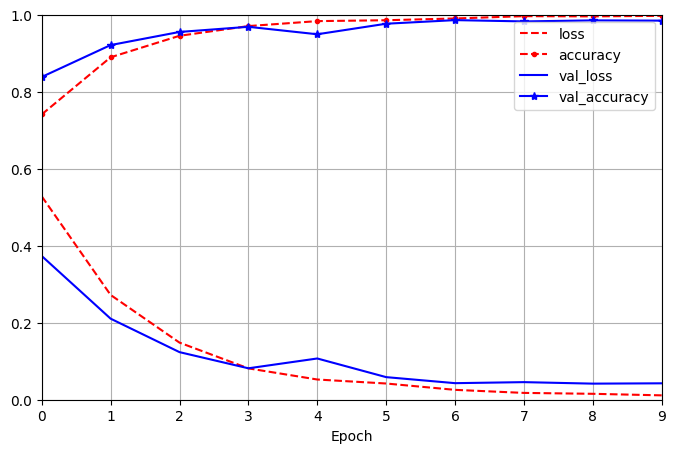

In [55]:
pd.DataFrame(history.history).plot(figsize=(8, 5), xlim=[0, 9], ylim=[0, 1], grid=True, xlabel="Epoch", style=["r--", "r--.", "b-", "b-*"])
plt.show()

Se puede ver en el gráfico que, en las épocas finales, *accuracy* y *val_accuracy* están casi encima de la otra lo que indicaría que no hay un overfitting. Viendo el gráfico se puede decir que la precisión converge a uno y la pérdida a cero.

#### Creación de modelo para regresión

In [56]:
def objetivo_reg(trial: optuna.trial.Trial):
    num_capas = trial.suggest_int("num_layers", 1, 4)
    model = Sequential()
    for i in range(num_capas):
        num_conexiones = trial.suggest_int(f"n_units_layer{i}", 4, 200)
        model.add(Dense(num_conexiones, activation="relu"))
    model.add(Dense(1))
    model.compile(optimizer="adam", loss="mean_squared_error", metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])
    model.fit(fx_train, fy_train, validation_data=(fx_test, fy_test), epochs=10, batch_size=32)
    score = model.evaluate(fx_test, fy_test, verbose=0)
    return score[1]

In [57]:
estudio_reg = optuna.create_study(direction="maximize")
estudio_reg.optimize(objetivo_reg, n_trials=50)

[I 2023-12-05 23:35:12,907] A new study created in memory with name: no-name-1099957e-7e59-4305-9679-611f959aba9e


Epoch 1/10
234/234 [==============================] - 8s 33ms/step - loss: 0.8587 - rmse: 0.9267 - val_loss: 0.3608 - val_rmse: 0.6007
Epoch 2/10
234/234 [==============================] - 8s 34ms/step - loss: 0.6954 - rmse: 0.8339 - val_loss: 0.3452 - val_rmse: 0.5876
Epoch 3/10
234/234 [==============================] - 7s 31ms/step - loss: 0.6300 - rmse: 0.7937 - val_loss: 0.4335 - val_rmse: 0.6584
Epoch 4/10
234/234 [==============================] - 8s 36ms/step - loss: 0.5963 - rmse: 0.7722 - val_loss: 0.4447 - val_rmse: 0.6668
Epoch 5/10
234/234 [==============================] - 7s 32ms/step - loss: 0.5331 - rmse: 0.7301 - val_loss: 0.3773 - val_rmse: 0.6143
Epoch 6/10
234/234 [==============================] - 7s 32ms/step - loss: 0.5087 - rmse: 0.7132 - val_loss: 0.4596 - val_rmse: 0.6780
Epoch 7/10
234/234 [==============================] - 7s 31ms/step - loss: 0.4561 - rmse: 0.6753 - val_loss: 0.4184 - val_rmse: 0.6468
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-05 23:36:30,151] Trial 0 finished with value: 0.7805337905883789 and parameters: {'num_layers': 4, 'n_units_layer0': 197, 'n_units_layer1': 28, 'n_units_layer2': 37, 'n_units_layer3': 140}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 6s 24ms/step - loss: 0.7937 - rmse: 0.8909 - val_loss: 0.3803 - val_rmse: 0.6167
Epoch 2/10
234/234 [==============================] - 6s 25ms/step - loss: 0.6778 - rmse: 0.8233 - val_loss: 0.3902 - val_rmse: 0.6246
Epoch 3/10
234/234 [==============================] - 6s 25ms/step - loss: 0.6307 - rmse: 0.7942 - val_loss: 0.3496 - val_rmse: 0.5912
Epoch 4/10
234/234 [==============================] - 6s 24ms/step - loss: 0.5857 - rmse: 0.7653 - val_loss: 0.3826 - val_rmse: 0.6186
Epoch 5/10
234/234 [==============================] - 6s 25ms/step - loss: 0.5730 - rmse: 0.7570 - val_loss: 0.4251 - val_rmse: 0.6520
Epoch 6/10
234/234 [==============================] - 6s 27ms/step - loss: 0.5150 - rmse: 0.7176 - val_loss: 0.3854 - val_rmse: 0.6208
Epoch 7/10
234/234 [==============================] - 6s 25ms/step - loss: 0.4859 - rmse: 0.6970 - val_loss: 0.4316 - val_rmse: 0.6570
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-05 23:37:30,000] Trial 1 finished with value: 0.6716169714927673 and parameters: {'num_layers': 2, 'n_units_layer0': 135, 'n_units_layer1': 140}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 8s 33ms/step - loss: 0.8762 - rmse: 0.9360 - val_loss: 0.4334 - val_rmse: 0.6583
Epoch 2/10
234/234 [==============================] - 8s 35ms/step - loss: 0.7314 - rmse: 0.8552 - val_loss: 0.3792 - val_rmse: 0.6158
Epoch 3/10
234/234 [==============================] - 8s 33ms/step - loss: 0.6735 - rmse: 0.8207 - val_loss: 0.3691 - val_rmse: 0.6075
Epoch 4/10
234/234 [==============================] - 8s 35ms/step - loss: 0.6197 - rmse: 0.7872 - val_loss: 0.4077 - val_rmse: 0.6385
Epoch 5/10
234/234 [==============================] - 8s 33ms/step - loss: 0.5761 - rmse: 0.7590 - val_loss: 0.3727 - val_rmse: 0.6105
Epoch 6/10
234/234 [==============================] - 8s 33ms/step - loss: 0.5603 - rmse: 0.7485 - val_loss: 0.4103 - val_rmse: 0.6406
Epoch 7/10
234/234 [==============================] - 8s 36ms/step - loss: 0.5129 - rmse: 0.7162 - val_loss: 0.4004 - val_rmse: 0.6328
Epoch 8/10
234/234 [==============================] - 8

[I 2023-12-05 23:38:51,077] Trial 2 finished with value: 0.7282199859619141 and parameters: {'num_layers': 4, 'n_units_layer0': 31, 'n_units_layer1': 142, 'n_units_layer2': 68, 'n_units_layer3': 64}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 7s 29ms/step - loss: 0.8076 - rmse: 0.8987 - val_loss: 0.3793 - val_rmse: 0.6158
Epoch 2/10
234/234 [==============================] - 6s 27ms/step - loss: 0.6728 - rmse: 0.8203 - val_loss: 0.3682 - val_rmse: 0.6068
Epoch 3/10
234/234 [==============================] - 7s 30ms/step - loss: 0.6133 - rmse: 0.7831 - val_loss: 0.4033 - val_rmse: 0.6351
Epoch 4/10
234/234 [==============================] - 7s 30ms/step - loss: 0.5625 - rmse: 0.7500 - val_loss: 0.4239 - val_rmse: 0.6510
Epoch 5/10
234/234 [==============================] - 7s 29ms/step - loss: 0.5087 - rmse: 0.7133 - val_loss: 0.3732 - val_rmse: 0.6109
Epoch 6/10
234/234 [==============================] - 7s 28ms/step - loss: 0.4648 - rmse: 0.6817 - val_loss: 0.4090 - val_rmse: 0.6395
Epoch 7/10
234/234 [==============================] - 7s 30ms/step - loss: 0.3971 - rmse: 0.6301 - val_loss: 0.6530 - val_rmse: 0.8081
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-05 23:40:00,590] Trial 3 finished with value: 0.7709718346595764 and parameters: {'num_layers': 3, 'n_units_layer0': 116, 'n_units_layer1': 155, 'n_units_layer2': 185}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 7s 31ms/step - loss: 0.9015 - rmse: 0.9495 - val_loss: 0.4409 - val_rmse: 0.6640
Epoch 2/10
234/234 [==============================] - 6s 27ms/step - loss: 0.7658 - rmse: 0.8751 - val_loss: 0.3861 - val_rmse: 0.6214
Epoch 3/10
234/234 [==============================] - 7s 32ms/step - loss: 0.7180 - rmse: 0.8473 - val_loss: 0.3741 - val_rmse: 0.6117
Epoch 4/10
234/234 [==============================] - 7s 31ms/step - loss: 0.6889 - rmse: 0.8300 - val_loss: 0.3624 - val_rmse: 0.6020
Epoch 5/10
234/234 [==============================] - 7s 32ms/step - loss: 0.6645 - rmse: 0.8152 - val_loss: 0.3895 - val_rmse: 0.6241
Epoch 6/10
234/234 [==============================] - 7s 32ms/step - loss: 0.6479 - rmse: 0.8049 - val_loss: 0.4198 - val_rmse: 0.6479
Epoch 7/10
234/234 [==============================] - 7s 31ms/step - loss: 0.6415 - rmse: 0.8010 - val_loss: 0.3567 - val_rmse: 0.5972
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-05 23:41:11,949] Trial 4 finished with value: 0.7342619895935059 and parameters: {'num_layers': 3, 'n_units_layer0': 8, 'n_units_layer1': 162, 'n_units_layer2': 74}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 5s 22ms/step - loss: 0.8464 - rmse: 0.9200 - val_loss: 0.4011 - val_rmse: 0.6333
Epoch 2/10
234/234 [==============================] - 5s 20ms/step - loss: 0.7103 - rmse: 0.8428 - val_loss: 0.3856 - val_rmse: 0.6209
Epoch 3/10
234/234 [==============================] - 5s 20ms/step - loss: 0.6855 - rmse: 0.8279 - val_loss: 0.3781 - val_rmse: 0.6149
Epoch 4/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6635 - rmse: 0.8145 - val_loss: 0.3776 - val_rmse: 0.6145
Epoch 5/10
234/234 [==============================] - 5s 22ms/step - loss: 0.6499 - rmse: 0.8061 - val_loss: 0.3796 - val_rmse: 0.6161
Epoch 6/10
234/234 [==============================] - 4s 19ms/step - loss: 0.6343 - rmse: 0.7965 - val_loss: 0.3757 - val_rmse: 0.6129
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6246 - rmse: 0.7903 - val_loss: 0.3741 - val_rmse: 0.6116
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-05 23:42:02,660] Trial 5 finished with value: 0.6150109171867371 and parameters: {'num_layers': 1, 'n_units_layer0': 137}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 8s 36ms/step - loss: 0.8259 - rmse: 0.9088 - val_loss: 0.3658 - val_rmse: 0.6048
Epoch 2/10
234/234 [==============================] - 8s 32ms/step - loss: 0.6724 - rmse: 0.8200 - val_loss: 0.3888 - val_rmse: 0.6235
Epoch 3/10
234/234 [==============================] - 8s 32ms/step - loss: 0.6224 - rmse: 0.7889 - val_loss: 0.3815 - val_rmse: 0.6176
Epoch 4/10
234/234 [==============================] - 8s 33ms/step - loss: 0.5779 - rmse: 0.7602 - val_loss: 0.3770 - val_rmse: 0.6140
Epoch 5/10
234/234 [==============================] - 8s 32ms/step - loss: 0.5084 - rmse: 0.7130 - val_loss: 0.4269 - val_rmse: 0.6534
Epoch 6/10
234/234 [==============================] - 8s 33ms/step - loss: 0.4959 - rmse: 0.7042 - val_loss: 0.4498 - val_rmse: 0.6706
Epoch 7/10
234/234 [==============================] - 8s 32ms/step - loss: 0.4284 - rmse: 0.6545 - val_loss: 0.5790 - val_rmse: 0.7609
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-05 23:43:20,462] Trial 6 finished with value: 0.6804490685462952 and parameters: {'num_layers': 4, 'n_units_layer0': 136, 'n_units_layer1': 48, 'n_units_layer2': 200, 'n_units_layer3': 158}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 5s 20ms/step - loss: 0.9166 - rmse: 0.9574 - val_loss: 0.4523 - val_rmse: 0.6725
Epoch 2/10
234/234 [==============================] - 5s 20ms/step - loss: 0.7801 - rmse: 0.8832 - val_loss: 0.4107 - val_rmse: 0.6408
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.7414 - rmse: 0.8611 - val_loss: 0.3985 - val_rmse: 0.6313
Epoch 4/10
234/234 [==============================] - 5s 20ms/step - loss: 0.7197 - rmse: 0.8484 - val_loss: 0.3882 - val_rmse: 0.6231
Epoch 5/10
234/234 [==============================] - 5s 20ms/step - loss: 0.7061 - rmse: 0.8403 - val_loss: 0.3925 - val_rmse: 0.6265
Epoch 6/10
234/234 [==============================] - 5s 20ms/step - loss: 0.6939 - rmse: 0.8330 - val_loss: 0.3839 - val_rmse: 0.6196
Epoch 7/10
234/234 [==============================] - 5s 20ms/step - loss: 0.6819 - rmse: 0.8258 - val_loss: 0.3892 - val_rmse: 0.6238
Epoch 8/10
234/234 [==============================] - 5

[I 2023-12-05 23:44:09,108] Trial 7 finished with value: 0.6112044453620911 and parameters: {'num_layers': 1, 'n_units_layer0': 20}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 8s 33ms/step - loss: 0.8039 - rmse: 0.8966 - val_loss: 0.3947 - val_rmse: 0.6283
Epoch 2/10
234/234 [==============================] - 7s 31ms/step - loss: 0.6941 - rmse: 0.8331 - val_loss: 0.3426 - val_rmse: 0.5853
Epoch 3/10
234/234 [==============================] - 7s 32ms/step - loss: 0.6278 - rmse: 0.7923 - val_loss: 0.3671 - val_rmse: 0.6059
Epoch 4/10
234/234 [==============================] - 7s 30ms/step - loss: 0.5912 - rmse: 0.7689 - val_loss: 0.4214 - val_rmse: 0.6492
Epoch 5/10
234/234 [==============================] - 9s 38ms/step - loss: 0.5630 - rmse: 0.7503 - val_loss: 0.3742 - val_rmse: 0.6117
Epoch 6/10
234/234 [==============================] - 8s 34ms/step - loss: 0.4817 - rmse: 0.6941 - val_loss: 0.4904 - val_rmse: 0.7003
Epoch 7/10
234/234 [==============================] - 8s 34ms/step - loss: 0.4294 - rmse: 0.6553 - val_loss: 0.4630 - val_rmse: 0.6804
Epoch 8/10
234/234 [==============================] - 8

[I 2023-12-05 23:45:29,718] Trial 8 finished with value: 0.6995676159858704 and parameters: {'num_layers': 4, 'n_units_layer0': 169, 'n_units_layer1': 42, 'n_units_layer2': 133, 'n_units_layer3': 73}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 5s 22ms/step - loss: 0.8443 - rmse: 0.9189 - val_loss: 0.4110 - val_rmse: 0.6411
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.7215 - rmse: 0.8494 - val_loss: 0.3901 - val_rmse: 0.6246
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6918 - rmse: 0.8317 - val_loss: 0.4035 - val_rmse: 0.6352
Epoch 4/10
234/234 [==============================] - 5s 23ms/step - loss: 0.6818 - rmse: 0.8257 - val_loss: 0.4006 - val_rmse: 0.6329
Epoch 5/10
234/234 [==============================] - 8s 33ms/step - loss: 0.6631 - rmse: 0.8143 - val_loss: 0.3931 - val_rmse: 0.6270
Epoch 6/10
234/234 [==============================] - 9s 38ms/step - loss: 0.6442 - rmse: 0.8026 - val_loss: 0.4130 - val_rmse: 0.6426
Epoch 7/10
234/234 [==============================] - 8s 33ms/step - loss: 0.6334 - rmse: 0.7959 - val_loss: 0.3797 - val_rmse: 0.6162
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-05 23:46:34,274] Trial 9 finished with value: 0.6157838106155396 and parameters: {'num_layers': 1, 'n_units_layer0': 117}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 6s 27ms/step - loss: 0.7982 - rmse: 0.8934 - val_loss: 0.3495 - val_rmse: 0.5912
Epoch 2/10
234/234 [==============================] - 6s 26ms/step - loss: 0.6692 - rmse: 0.8180 - val_loss: 0.3714 - val_rmse: 0.6094
Epoch 3/10
234/234 [==============================] - 6s 26ms/step - loss: 0.6402 - rmse: 0.8001 - val_loss: 0.3308 - val_rmse: 0.5752
Epoch 4/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5928 - rmse: 0.7699 - val_loss: 0.4134 - val_rmse: 0.6429
Epoch 5/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5759 - rmse: 0.7589 - val_loss: 0.3447 - val_rmse: 0.5871
Epoch 6/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5312 - rmse: 0.7288 - val_loss: 0.3898 - val_rmse: 0.6243
Epoch 7/10
234/234 [==============================] - 6s 26ms/step - loss: 0.4990 - rmse: 0.7064 - val_loss: 0.3865 - val_rmse: 0.6217
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-05 23:47:36,490] Trial 10 finished with value: 0.6445509195327759 and parameters: {'num_layers': 3, 'n_units_layer0': 190, 'n_units_layer1': 9, 'n_units_layer2': 7}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 6s 26ms/step - loss: 0.8161 - rmse: 0.9034 - val_loss: 0.4657 - val_rmse: 0.6824
Epoch 2/10
234/234 [==============================] - 6s 27ms/step - loss: 0.6991 - rmse: 0.8361 - val_loss: 0.3625 - val_rmse: 0.6021
Epoch 3/10
234/234 [==============================] - 6s 26ms/step - loss: 0.6276 - rmse: 0.7922 - val_loss: 0.4660 - val_rmse: 0.6826
Epoch 4/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5933 - rmse: 0.7702 - val_loss: 0.4105 - val_rmse: 0.6407
Epoch 5/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5139 - rmse: 0.7169 - val_loss: 0.8726 - val_rmse: 0.9341
Epoch 6/10
234/234 [==============================] - 6s 26ms/step - loss: 0.4949 - rmse: 0.7035 - val_loss: 0.3832 - val_rmse: 0.6190
Epoch 7/10
234/234 [==============================] - 6s 26ms/step - loss: 0.4340 - rmse: 0.6588 - val_loss: 0.4198 - val_rmse: 0.6480
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-05 23:48:38,681] Trial 11 finished with value: 0.6497288346290588 and parameters: {'num_layers': 3, 'n_units_layer0': 53, 'n_units_layer1': 194, 'n_units_layer2': 198}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 5s 23ms/step - loss: 0.8245 - rmse: 0.9080 - val_loss: 0.3755 - val_rmse: 0.6128
Epoch 2/10
234/234 [==============================] - 5s 22ms/step - loss: 0.7049 - rmse: 0.8396 - val_loss: 0.3600 - val_rmse: 0.6000
Epoch 3/10
234/234 [==============================] - 5s 22ms/step - loss: 0.6516 - rmse: 0.8072 - val_loss: 0.3844 - val_rmse: 0.6200
Epoch 4/10
234/234 [==============================] - 5s 22ms/step - loss: 0.6277 - rmse: 0.7923 - val_loss: 0.3660 - val_rmse: 0.6050
Epoch 5/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5841 - rmse: 0.7642 - val_loss: 0.3588 - val_rmse: 0.5990
Epoch 6/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5636 - rmse: 0.7507 - val_loss: 0.3762 - val_rmse: 0.6134
Epoch 7/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5456 - rmse: 0.7387 - val_loss: 0.3765 - val_rmse: 0.6136
Epoch 8/10
234/234 [==============================] - 5

[I 2023-12-05 23:49:31,177] Trial 12 finished with value: 0.6450756192207336 and parameters: {'num_layers': 2, 'n_units_layer0': 72, 'n_units_layer1': 84}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 7s 30ms/step - loss: 0.8187 - rmse: 0.9048 - val_loss: 0.4028 - val_rmse: 0.6347
Epoch 2/10
234/234 [==============================] - 7s 30ms/step - loss: 0.6719 - rmse: 0.8197 - val_loss: 0.3756 - val_rmse: 0.6128
Epoch 3/10
234/234 [==============================] - 7s 29ms/step - loss: 0.6112 - rmse: 0.7818 - val_loss: 0.3731 - val_rmse: 0.6108
Epoch 4/10
234/234 [==============================] - 7s 30ms/step - loss: 0.5786 - rmse: 0.7606 - val_loss: 0.3842 - val_rmse: 0.6198
Epoch 5/10
234/234 [==============================] - 7s 30ms/step - loss: 0.5198 - rmse: 0.7210 - val_loss: 0.4111 - val_rmse: 0.6411
Epoch 6/10
234/234 [==============================] - 7s 30ms/step - loss: 0.4947 - rmse: 0.7034 - val_loss: 0.4354 - val_rmse: 0.6599
Epoch 7/10
234/234 [==============================] - 7s 30ms/step - loss: 0.4532 - rmse: 0.6732 - val_loss: 0.5053 - val_rmse: 0.7109
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-05 23:50:41,848] Trial 13 finished with value: 0.7344030141830444 and parameters: {'num_layers': 4, 'n_units_layer0': 86, 'n_units_layer1': 102, 'n_units_layer2': 9, 'n_units_layer3': 197}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 6s 27ms/step - loss: 0.7911 - rmse: 0.8894 - val_loss: 0.3907 - val_rmse: 0.6250
Epoch 2/10
234/234 [==============================] - 6s 26ms/step - loss: 0.6628 - rmse: 0.8142 - val_loss: 0.3593 - val_rmse: 0.5994
Epoch 3/10
234/234 [==============================] - 6s 27ms/step - loss: 0.6153 - rmse: 0.7844 - val_loss: 0.3634 - val_rmse: 0.6028
Epoch 4/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5797 - rmse: 0.7614 - val_loss: 0.3630 - val_rmse: 0.6025
Epoch 5/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5294 - rmse: 0.7276 - val_loss: 0.4427 - val_rmse: 0.6654
Epoch 6/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5081 - rmse: 0.7128 - val_loss: 0.4104 - val_rmse: 0.6407
Epoch 7/10
234/234 [==============================] - 7s 28ms/step - loss: 0.4784 - rmse: 0.6917 - val_loss: 0.3825 - val_rmse: 0.6185
Epoch 8/10
234/234 [==============================] - 8

[I 2023-12-05 23:51:47,228] Trial 14 finished with value: 0.7800086140632629 and parameters: {'num_layers': 3, 'n_units_layer0': 196, 'n_units_layer1': 66, 'n_units_layer2': 133}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 5s 23ms/step - loss: 0.8005 - rmse: 0.8947 - val_loss: 0.3750 - val_rmse: 0.6124
Epoch 2/10
234/234 [==============================] - 5s 22ms/step - loss: 0.6691 - rmse: 0.8180 - val_loss: 0.3711 - val_rmse: 0.6092
Epoch 3/10
234/234 [==============================] - 5s 23ms/step - loss: 0.6291 - rmse: 0.7931 - val_loss: 0.3622 - val_rmse: 0.6018
Epoch 4/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5570 - rmse: 0.7463 - val_loss: 0.3750 - val_rmse: 0.6124
Epoch 5/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5452 - rmse: 0.7384 - val_loss: 0.4148 - val_rmse: 0.6440
Epoch 6/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5110 - rmse: 0.7149 - val_loss: 0.3960 - val_rmse: 0.6293
Epoch 7/10
234/234 [==============================] - 5s 23ms/step - loss: 0.4751 - rmse: 0.6893 - val_loss: 0.3876 - val_rmse: 0.6225
Epoch 8/10
234/234 [==============================] - 5

[I 2023-12-05 23:52:40,476] Trial 15 finished with value: 0.7101876735687256 and parameters: {'num_layers': 2, 'n_units_layer0': 192, 'n_units_layer1': 57}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 7s 31ms/step - loss: 0.8064 - rmse: 0.8980 - val_loss: 0.3841 - val_rmse: 0.6198
Epoch 2/10
234/234 [==============================] - 7s 30ms/step - loss: 0.6782 - rmse: 0.8235 - val_loss: 0.3508 - val_rmse: 0.5923
Epoch 3/10
234/234 [==============================] - 7s 30ms/step - loss: 0.6235 - rmse: 0.7896 - val_loss: 0.3579 - val_rmse: 0.5983
Epoch 4/10
234/234 [==============================] - 7s 31ms/step - loss: 0.5703 - rmse: 0.7552 - val_loss: 0.4350 - val_rmse: 0.6596
Epoch 5/10
234/234 [==============================] - 7s 31ms/step - loss: 0.5426 - rmse: 0.7366 - val_loss: 0.4118 - val_rmse: 0.6417
Epoch 6/10
234/234 [==============================] - 7s 30ms/step - loss: 0.4946 - rmse: 0.7033 - val_loss: 0.4677 - val_rmse: 0.6839
Epoch 7/10
234/234 [==============================] - 7s 30ms/step - loss: 0.4257 - rmse: 0.6525 - val_loss: 0.4521 - val_rmse: 0.6724
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-05 23:53:53,852] Trial 16 finished with value: 0.7643587589263916 and parameters: {'num_layers': 4, 'n_units_layer0': 164, 'n_units_layer1': 12, 'n_units_layer2': 127, 'n_units_layer3': 135}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 8s 33ms/step - loss: 0.7875 - rmse: 0.8874 - val_loss: 0.4255 - val_rmse: 0.6523
Epoch 2/10
234/234 [==============================] - 8s 32ms/step - loss: 0.6670 - rmse: 0.8167 - val_loss: 0.3695 - val_rmse: 0.6079
Epoch 3/10
234/234 [==============================] - 8s 32ms/step - loss: 0.6285 - rmse: 0.7928 - val_loss: 0.3555 - val_rmse: 0.5962
Epoch 4/10
234/234 [==============================] - 9s 37ms/step - loss: 0.5641 - rmse: 0.7510 - val_loss: 0.5150 - val_rmse: 0.7177
Epoch 5/10
234/234 [==============================] - 9s 39ms/step - loss: 0.5354 - rmse: 0.7317 - val_loss: 0.4720 - val_rmse: 0.6870
Epoch 6/10
234/234 [==============================] - 9s 36ms/step - loss: 0.4802 - rmse: 0.6930 - val_loss: 0.4591 - val_rmse: 0.6776
Epoch 7/10
234/234 [==============================] - 7s 29ms/step - loss: 0.4282 - rmse: 0.6544 - val_loss: 0.4523 - val_rmse: 0.6725
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-05 23:55:11,149] Trial 17 finished with value: 0.7405404448509216 and parameters: {'num_layers': 3, 'n_units_layer0': 167, 'n_units_layer1': 76, 'n_units_layer2': 51}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 8s 35ms/step - loss: 0.8136 - rmse: 0.9020 - val_loss: 0.4030 - val_rmse: 0.6348
Epoch 2/10
234/234 [==============================] - 8s 35ms/step - loss: 0.6589 - rmse: 0.8117 - val_loss: 0.4519 - val_rmse: 0.6723
Epoch 3/10
234/234 [==============================] - 8s 34ms/step - loss: 0.6165 - rmse: 0.7851 - val_loss: 0.3728 - val_rmse: 0.6106
Epoch 4/10
234/234 [==============================] - 9s 37ms/step - loss: 0.5402 - rmse: 0.7350 - val_loss: 0.4482 - val_rmse: 0.6695
Epoch 5/10
234/234 [==============================] - 8s 34ms/step - loss: 0.4979 - rmse: 0.7056 - val_loss: 0.3909 - val_rmse: 0.6253
Epoch 6/10
234/234 [==============================] - 7s 31ms/step - loss: 0.4481 - rmse: 0.6694 - val_loss: 0.4041 - val_rmse: 0.6357
Epoch 7/10
234/234 [==============================] - 8s 35ms/step - loss: 0.4088 - rmse: 0.6394 - val_loss: 0.4601 - val_rmse: 0.6783
Epoch 8/10
234/234 [==============================] - 9

[I 2023-12-05 23:56:35,264] Trial 18 finished with value: 0.7070279717445374 and parameters: {'num_layers': 4, 'n_units_layer0': 193, 'n_units_layer1': 29, 'n_units_layer2': 148, 'n_units_layer3': 117}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 7s 31ms/step - loss: 0.7920 - rmse: 0.8899 - val_loss: 0.4480 - val_rmse: 0.6693
Epoch 2/10
234/234 [==============================] - 8s 32ms/step - loss: 0.7003 - rmse: 0.8368 - val_loss: 0.4529 - val_rmse: 0.6730
Epoch 3/10
234/234 [==============================] - 8s 33ms/step - loss: 0.6122 - rmse: 0.7824 - val_loss: 0.4082 - val_rmse: 0.6389
Epoch 4/10
234/234 [==============================] - 8s 33ms/step - loss: 0.5826 - rmse: 0.7633 - val_loss: 0.3658 - val_rmse: 0.6048
Epoch 5/10
234/234 [==============================] - 7s 31ms/step - loss: 0.5182 - rmse: 0.7198 - val_loss: 0.4041 - val_rmse: 0.6357
Epoch 6/10
234/234 [==============================] - 7s 29ms/step - loss: 0.4923 - rmse: 0.7017 - val_loss: 0.3723 - val_rmse: 0.6101
Epoch 7/10
234/234 [==============================] - 7s 29ms/step - loss: 0.4500 - rmse: 0.6708 - val_loss: 0.3608 - val_rmse: 0.6007
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-05 23:57:48,831] Trial 19 finished with value: 0.6941275000572205 and parameters: {'num_layers': 3, 'n_units_layer0': 158, 'n_units_layer1': 68, 'n_units_layer2': 100}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 6s 26ms/step - loss: 0.7964 - rmse: 0.8924 - val_loss: 0.3914 - val_rmse: 0.6256
Epoch 2/10
234/234 [==============================] - 6s 24ms/step - loss: 0.6838 - rmse: 0.8269 - val_loss: 0.3684 - val_rmse: 0.6069
Epoch 3/10
234/234 [==============================] - 5s 23ms/step - loss: 0.6433 - rmse: 0.8021 - val_loss: 0.3674 - val_rmse: 0.6061
Epoch 4/10
234/234 [==============================] - 6s 25ms/step - loss: 0.5925 - rmse: 0.7697 - val_loss: 0.3612 - val_rmse: 0.6010
Epoch 5/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5474 - rmse: 0.7399 - val_loss: 0.3767 - val_rmse: 0.6137
Epoch 6/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5101 - rmse: 0.7142 - val_loss: 0.3970 - val_rmse: 0.6301
Epoch 7/10
234/234 [==============================] - 6s 26ms/step - loss: 0.4788 - rmse: 0.6919 - val_loss: 0.4435 - val_rmse: 0.6659
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-05 23:58:48,651] Trial 20 finished with value: 0.6556570529937744 and parameters: {'num_layers': 2, 'n_units_layer0': 198, 'n_units_layer1': 100}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 7s 29ms/step - loss: 0.7880 - rmse: 0.8877 - val_loss: 0.3739 - val_rmse: 0.6115
Epoch 2/10
234/234 [==============================] - 7s 30ms/step - loss: 0.6717 - rmse: 0.8196 - val_loss: 0.3537 - val_rmse: 0.5948
Epoch 3/10
234/234 [==============================] - 7s 29ms/step - loss: 0.6214 - rmse: 0.7883 - val_loss: 0.3562 - val_rmse: 0.5968
Epoch 4/10
234/234 [==============================] - 8s 32ms/step - loss: 0.5831 - rmse: 0.7636 - val_loss: 0.4200 - val_rmse: 0.6481
Epoch 5/10
234/234 [==============================] - 8s 35ms/step - loss: 0.5218 - rmse: 0.7224 - val_loss: 0.4498 - val_rmse: 0.6706
Epoch 6/10
234/234 [==============================] - 8s 33ms/step - loss: 0.4668 - rmse: 0.6832 - val_loss: 0.3718 - val_rmse: 0.6097
Epoch 7/10
234/234 [==============================] - 7s 30ms/step - loss: 0.4190 - rmse: 0.6473 - val_loss: 0.4097 - val_rmse: 0.6401
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-06 00:00:06,381] Trial 21 finished with value: 0.6724287271499634 and parameters: {'num_layers': 3, 'n_units_layer0': 176, 'n_units_layer1': 129, 'n_units_layer2': 168}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 10s 42ms/step - loss: 0.7671 - rmse: 0.8758 - val_loss: 0.3727 - val_rmse: 0.6105
Epoch 2/10
234/234 [==============================] - 9s 40ms/step - loss: 0.6798 - rmse: 0.8245 - val_loss: 0.3399 - val_rmse: 0.5830
Epoch 3/10
234/234 [==============================] - 9s 36ms/step - loss: 0.6045 - rmse: 0.7775 - val_loss: 0.4179 - val_rmse: 0.6464
Epoch 4/10
234/234 [==============================] - 8s 34ms/step - loss: 0.5555 - rmse: 0.7453 - val_loss: 0.4019 - val_rmse: 0.6339
Epoch 5/10
234/234 [==============================] - 7s 31ms/step - loss: 0.4782 - rmse: 0.6915 - val_loss: 0.4236 - val_rmse: 0.6508
Epoch 6/10
234/234 [==============================] - 7s 31ms/step - loss: 0.4390 - rmse: 0.6625 - val_loss: 0.3857 - val_rmse: 0.6210
Epoch 7/10
234/234 [==============================] - 7s 29ms/step - loss: 0.3938 - rmse: 0.6275 - val_loss: 0.5024 - val_rmse: 0.7088
Epoch 8/10
234/234 [==============================] - 

[I 2023-12-06 00:01:31,472] Trial 22 finished with value: 0.6866762042045593 and parameters: {'num_layers': 3, 'n_units_layer0': 108, 'n_units_layer1': 196, 'n_units_layer2': 170}. Best is trial 0 with value: 0.7805337905883789.


Epoch 1/10
234/234 [==============================] - 7s 30ms/step - loss: 0.8056 - rmse: 0.8975 - val_loss: 0.3781 - val_rmse: 0.6149
Epoch 2/10
234/234 [==============================] - 7s 29ms/step - loss: 0.6753 - rmse: 0.8218 - val_loss: 0.3530 - val_rmse: 0.5941
Epoch 3/10
234/234 [==============================] - 7s 28ms/step - loss: 0.6292 - rmse: 0.7932 - val_loss: 0.3632 - val_rmse: 0.6027
Epoch 4/10
234/234 [==============================] - 6s 27ms/step - loss: 0.5912 - rmse: 0.7689 - val_loss: 0.3667 - val_rmse: 0.6055
Epoch 5/10
234/234 [==============================] - 6s 28ms/step - loss: 0.5562 - rmse: 0.7458 - val_loss: 0.3678 - val_rmse: 0.6065
Epoch 6/10
234/234 [==============================] - 7s 29ms/step - loss: 0.5354 - rmse: 0.7317 - val_loss: 0.3917 - val_rmse: 0.6258
Epoch 7/10
234/234 [==============================] - 7s 29ms/step - loss: 0.4751 - rmse: 0.6893 - val_loss: 0.4280 - val_rmse: 0.6543
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-06 00:02:38,496] Trial 23 finished with value: 0.8484416007995605 and parameters: {'num_layers': 3, 'n_units_layer0': 152, 'n_units_layer1': 31, 'n_units_layer2': 104}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 8s 33ms/step - loss: 0.8175 - rmse: 0.9042 - val_loss: 0.4118 - val_rmse: 0.6417
Epoch 2/10
234/234 [==============================] - 8s 35ms/step - loss: 0.6800 - rmse: 0.8246 - val_loss: 0.3779 - val_rmse: 0.6148
Epoch 3/10
234/234 [==============================] - 8s 34ms/step - loss: 0.6476 - rmse: 0.8047 - val_loss: 0.3494 - val_rmse: 0.5911
Epoch 4/10
234/234 [==============================] - 8s 32ms/step - loss: 0.6123 - rmse: 0.7825 - val_loss: 0.3921 - val_rmse: 0.6262
Epoch 5/10
234/234 [==============================] - 8s 32ms/step - loss: 0.5696 - rmse: 0.7547 - val_loss: 0.3587 - val_rmse: 0.5989
Epoch 6/10
234/234 [==============================] - 7s 31ms/step - loss: 0.5373 - rmse: 0.7330 - val_loss: 0.3592 - val_rmse: 0.5994
Epoch 7/10
234/234 [==============================] - 8s 33ms/step - loss: 0.5142 - rmse: 0.7171 - val_loss: 0.5271 - val_rmse: 0.7260
Epoch 8/10
234/234 [==============================] - 8

[I 2023-12-06 00:03:55,965] Trial 24 finished with value: 0.7004669904708862 and parameters: {'num_layers': 4, 'n_units_layer0': 149, 'n_units_layer1': 29, 'n_units_layer2': 109, 'n_units_layer3': 5}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 5s 23ms/step - loss: 0.8188 - rmse: 0.9049 - val_loss: 0.3775 - val_rmse: 0.6144
Epoch 2/10
234/234 [==============================] - 5s 23ms/step - loss: 0.6860 - rmse: 0.8283 - val_loss: 0.3640 - val_rmse: 0.6033
Epoch 3/10
234/234 [==============================] - 6s 24ms/step - loss: 0.6422 - rmse: 0.8014 - val_loss: 0.3489 - val_rmse: 0.5907
Epoch 4/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5989 - rmse: 0.7739 - val_loss: 0.3552 - val_rmse: 0.5960
Epoch 5/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5683 - rmse: 0.7539 - val_loss: 0.3452 - val_rmse: 0.5876
Epoch 6/10
234/234 [==============================] - 5s 23ms/step - loss: 0.5291 - rmse: 0.7274 - val_loss: 0.3607 - val_rmse: 0.6006
Epoch 7/10
234/234 [==============================] - 5s 23ms/step - loss: 0.4895 - rmse: 0.6996 - val_loss: 0.3778 - val_rmse: 0.6147
Epoch 8/10
234/234 [==============================] - 5

[I 2023-12-06 00:04:51,738] Trial 25 finished with value: 0.7005056142807007 and parameters: {'num_layers': 2, 'n_units_layer0': 179, 'n_units_layer1': 28}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 7s 30ms/step - loss: 0.8030 - rmse: 0.8961 - val_loss: 0.3672 - val_rmse: 0.6060
Epoch 2/10
234/234 [==============================] - 7s 29ms/step - loss: 0.6723 - rmse: 0.8200 - val_loss: 0.4011 - val_rmse: 0.6334
Epoch 3/10
234/234 [==============================] - 7s 32ms/step - loss: 0.6234 - rmse: 0.7895 - val_loss: 0.3761 - val_rmse: 0.6133
Epoch 4/10
234/234 [==============================] - 7s 30ms/step - loss: 0.5792 - rmse: 0.7610 - val_loss: 0.3577 - val_rmse: 0.5981
Epoch 5/10
234/234 [==============================] - 7s 28ms/step - loss: 0.5346 - rmse: 0.7311 - val_loss: 0.3769 - val_rmse: 0.6140
Epoch 6/10
234/234 [==============================] - 7s 29ms/step - loss: 0.4816 - rmse: 0.6940 - val_loss: 0.3683 - val_rmse: 0.6068
Epoch 7/10
234/234 [==============================] - 7s 29ms/step - loss: 0.4471 - rmse: 0.6687 - val_loss: 0.3780 - val_rmse: 0.6148
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-06 00:06:02,697] Trial 26 finished with value: 0.6867756247520447 and parameters: {'num_layers': 3, 'n_units_layer0': 148, 'n_units_layer1': 53, 'n_units_layer2': 94}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 8s 35ms/step - loss: 0.8873 - rmse: 0.9419 - val_loss: 0.4056 - val_rmse: 0.6368
Epoch 2/10
234/234 [==============================] - 9s 38ms/step - loss: 0.7472 - rmse: 0.8644 - val_loss: 0.3858 - val_rmse: 0.6211
Epoch 3/10
234/234 [==============================] - 9s 40ms/step - loss: 0.7012 - rmse: 0.8374 - val_loss: 0.4219 - val_rmse: 0.6496
Epoch 4/10
234/234 [==============================] - 8s 35ms/step - loss: 0.6771 - rmse: 0.8229 - val_loss: 0.3762 - val_rmse: 0.6133
Epoch 5/10
234/234 [==============================] - 8s 35ms/step - loss: 0.6246 - rmse: 0.7903 - val_loss: 0.3770 - val_rmse: 0.6140
Epoch 6/10
234/234 [==============================] - 8s 33ms/step - loss: 0.5766 - rmse: 0.7593 - val_loss: 0.3950 - val_rmse: 0.6285
Epoch 7/10
234/234 [==============================] - 8s 35ms/step - loss: 0.5849 - rmse: 0.7648 - val_loss: 0.4235 - val_rmse: 0.6508
Epoch 8/10
234/234 [==============================] - 8

[I 2023-12-06 00:07:25,782] Trial 27 finished with value: 0.6963334083557129 and parameters: {'num_layers': 4, 'n_units_layer0': 181, 'n_units_layer1': 4, 'n_units_layer2': 31, 'n_units_layer3': 197}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 6s 27ms/step - loss: 0.7857 - rmse: 0.8864 - val_loss: 0.3634 - val_rmse: 0.6028
Epoch 2/10
234/234 [==============================] - 6s 27ms/step - loss: 0.6853 - rmse: 0.8278 - val_loss: 0.3620 - val_rmse: 0.6017
Epoch 3/10
234/234 [==============================] - 6s 27ms/step - loss: 0.6336 - rmse: 0.7960 - val_loss: 0.3961 - val_rmse: 0.6293
Epoch 4/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5945 - rmse: 0.7711 - val_loss: 0.3573 - val_rmse: 0.5977
Epoch 5/10
234/234 [==============================] - 6s 28ms/step - loss: 0.5241 - rmse: 0.7239 - val_loss: 0.3853 - val_rmse: 0.6207
Epoch 6/10
234/234 [==============================] - 7s 31ms/step - loss: 0.4551 - rmse: 0.6746 - val_loss: 0.4318 - val_rmse: 0.6571
Epoch 7/10
234/234 [==============================] - 6s 27ms/step - loss: 0.3950 - rmse: 0.6285 - val_loss: 0.5085 - val_rmse: 0.7131
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-06 00:08:31,129] Trial 28 finished with value: 0.690348744392395 and parameters: {'num_layers': 3, 'n_units_layer0': 198, 'n_units_layer1': 101, 'n_units_layer2': 125}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 6s 26ms/step - loss: 0.8055 - rmse: 0.8975 - val_loss: 0.3769 - val_rmse: 0.6139
Epoch 2/10
234/234 [==============================] - 5s 22ms/step - loss: 0.6881 - rmse: 0.8295 - val_loss: 0.3575 - val_rmse: 0.5979
Epoch 3/10
234/234 [==============================] - 6s 25ms/step - loss: 0.6470 - rmse: 0.8044 - val_loss: 0.3693 - val_rmse: 0.6077
Epoch 4/10
234/234 [==============================] - 6s 24ms/step - loss: 0.6124 - rmse: 0.7826 - val_loss: 0.3554 - val_rmse: 0.5962
Epoch 5/10
234/234 [==============================] - 6s 25ms/step - loss: 0.5887 - rmse: 0.7673 - val_loss: 0.4005 - val_rmse: 0.6329
Epoch 6/10
234/234 [==============================] - 6s 24ms/step - loss: 0.5417 - rmse: 0.7360 - val_loss: 0.3819 - val_rmse: 0.6180
Epoch 7/10
234/234 [==============================] - 6s 27ms/step - loss: 0.5073 - rmse: 0.7123 - val_loss: 0.4214 - val_rmse: 0.6491
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-06 00:09:29,452] Trial 29 finished with value: 0.6462942361831665 and parameters: {'num_layers': 2, 'n_units_layer0': 151, 'n_units_layer1': 36}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 9s 36ms/step - loss: 0.7977 - rmse: 0.8932 - val_loss: 0.3542 - val_rmse: 0.5952
Epoch 2/10
234/234 [==============================] - 8s 35ms/step - loss: 0.6669 - rmse: 0.8166 - val_loss: 0.3965 - val_rmse: 0.6297
Epoch 3/10
234/234 [==============================] - 7s 32ms/step - loss: 0.6032 - rmse: 0.7766 - val_loss: 0.4089 - val_rmse: 0.6394
Epoch 4/10
234/234 [==============================] - 8s 33ms/step - loss: 0.5730 - rmse: 0.7569 - val_loss: 0.4438 - val_rmse: 0.6662
Epoch 5/10
234/234 [==============================] - 8s 33ms/step - loss: 0.5070 - rmse: 0.7120 - val_loss: 0.5280 - val_rmse: 0.7267
Epoch 6/10
234/234 [==============================] - 8s 34ms/step - loss: 0.4854 - rmse: 0.6967 - val_loss: 0.4869 - val_rmse: 0.6978
Epoch 7/10
234/234 [==============================] - 8s 33ms/step - loss: 0.4565 - rmse: 0.6756 - val_loss: 0.5840 - val_rmse: 0.7642
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-06 00:10:48,057] Trial 30 finished with value: 0.7091068029403687 and parameters: {'num_layers': 4, 'n_units_layer0': 132, 'n_units_layer1': 70, 'n_units_layer2': 81, 'n_units_layer3': 78}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 7s 30ms/step - loss: 0.7936 - rmse: 0.8909 - val_loss: 0.4629 - val_rmse: 0.6803
Epoch 2/10
234/234 [==============================] - 7s 28ms/step - loss: 0.6987 - rmse: 0.8359 - val_loss: 0.3555 - val_rmse: 0.5962
Epoch 3/10
234/234 [==============================] - 7s 29ms/step - loss: 0.6065 - rmse: 0.7788 - val_loss: 0.3625 - val_rmse: 0.6021
Epoch 4/10
234/234 [==============================] - 7s 29ms/step - loss: 0.5548 - rmse: 0.7448 - val_loss: 0.4048 - val_rmse: 0.6362
Epoch 5/10
234/234 [==============================] - 7s 29ms/step - loss: 0.5044 - rmse: 0.7102 - val_loss: 0.3956 - val_rmse: 0.6290
Epoch 6/10
234/234 [==============================] - 7s 30ms/step - loss: 0.4838 - rmse: 0.6955 - val_loss: 0.3816 - val_rmse: 0.6178
Epoch 7/10
234/234 [==============================] - 7s 28ms/step - loss: 0.3921 - rmse: 0.6262 - val_loss: 0.4177 - val_rmse: 0.6463
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-06 00:11:57,474] Trial 31 finished with value: 0.6394742131233215 and parameters: {'num_layers': 3, 'n_units_layer0': 115, 'n_units_layer1': 162, 'n_units_layer2': 158}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 7s 28ms/step - loss: 0.8748 - rmse: 0.9353 - val_loss: 0.3804 - val_rmse: 0.6167
Epoch 2/10
234/234 [==============================] - 6s 27ms/step - loss: 0.6923 - rmse: 0.8321 - val_loss: 0.3592 - val_rmse: 0.5993
Epoch 3/10
234/234 [==============================] - 6s 26ms/step - loss: 0.6389 - rmse: 0.7993 - val_loss: 0.3700 - val_rmse: 0.6083
Epoch 4/10
234/234 [==============================] - 7s 28ms/step - loss: 0.6149 - rmse: 0.7842 - val_loss: 0.3551 - val_rmse: 0.5959
Epoch 5/10
234/234 [==============================] - 6s 27ms/step - loss: 0.5810 - rmse: 0.7623 - val_loss: 0.3560 - val_rmse: 0.5966
Epoch 6/10
234/234 [==============================] - 7s 28ms/step - loss: 0.5523 - rmse: 0.7432 - val_loss: 0.3956 - val_rmse: 0.6290
Epoch 7/10
234/234 [==============================] - 6s 27ms/step - loss: 0.5208 - rmse: 0.7216 - val_loss: 0.4582 - val_rmse: 0.6769
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-06 00:13:03,223] Trial 32 finished with value: 0.6834660172462463 and parameters: {'num_layers': 3, 'n_units_layer0': 93, 'n_units_layer1': 19, 'n_units_layer2': 47}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 6s 27ms/step - loss: 0.7968 - rmse: 0.8926 - val_loss: 0.3691 - val_rmse: 0.6075
Epoch 2/10
234/234 [==============================] - 6s 27ms/step - loss: 0.6854 - rmse: 0.8279 - val_loss: 0.3593 - val_rmse: 0.5994
Epoch 3/10
234/234 [==============================] - 6s 27ms/step - loss: 0.6203 - rmse: 0.7876 - val_loss: 0.3886 - val_rmse: 0.6234
Epoch 4/10
234/234 [==============================] - 6s 27ms/step - loss: 0.5693 - rmse: 0.7545 - val_loss: 0.4037 - val_rmse: 0.6354
Epoch 5/10
234/234 [==============================] - 7s 30ms/step - loss: 0.5238 - rmse: 0.7237 - val_loss: 0.4159 - val_rmse: 0.6449
Epoch 6/10
234/234 [==============================] - 7s 28ms/step - loss: 0.4597 - rmse: 0.6780 - val_loss: 0.3830 - val_rmse: 0.6189
Epoch 7/10
234/234 [==============================] - 7s 29ms/step - loss: 0.3878 - rmse: 0.6227 - val_loss: 0.4277 - val_rmse: 0.6540
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-06 00:14:11,529] Trial 33 finished with value: 0.732340395450592 and parameters: {'num_layers': 3, 'n_units_layer0': 128, 'n_units_layer1': 119, 'n_units_layer2': 178}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 7s 29ms/step - loss: 0.8045 - rmse: 0.8969 - val_loss: 0.3653 - val_rmse: 0.6044
Epoch 2/10
234/234 [==============================] - 7s 30ms/step - loss: 0.6749 - rmse: 0.8215 - val_loss: 0.4100 - val_rmse: 0.6403
Epoch 3/10
234/234 [==============================] - 7s 31ms/step - loss: 0.6280 - rmse: 0.7925 - val_loss: 0.4235 - val_rmse: 0.6508
Epoch 4/10
234/234 [==============================] - 7s 31ms/step - loss: 0.5998 - rmse: 0.7744 - val_loss: 0.3613 - val_rmse: 0.6011
Epoch 5/10
234/234 [==============================] - 7s 31ms/step - loss: 0.5186 - rmse: 0.7202 - val_loss: 0.4593 - val_rmse: 0.6777
Epoch 6/10
234/234 [==============================] - 7s 30ms/step - loss: 0.4883 - rmse: 0.6988 - val_loss: 0.4725 - val_rmse: 0.6874
Epoch 7/10
234/234 [==============================] - 7s 30ms/step - loss: 0.4884 - rmse: 0.6989 - val_loss: 0.4189 - val_rmse: 0.6472
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-06 00:15:21,756] Trial 34 finished with value: 0.651311457157135 and parameters: {'num_layers': 3, 'n_units_layer0': 180, 'n_units_layer1': 60, 'n_units_layer2': 112}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 8s 34ms/step - loss: 0.8266 - rmse: 0.9092 - val_loss: 0.3705 - val_rmse: 0.6087
Epoch 2/10
234/234 [==============================] - 7s 31ms/step - loss: 0.6831 - rmse: 0.8265 - val_loss: 0.4028 - val_rmse: 0.6347
Epoch 3/10
234/234 [==============================] - 7s 32ms/step - loss: 0.6355 - rmse: 0.7972 - val_loss: 0.3909 - val_rmse: 0.6252
Epoch 4/10
234/234 [==============================] - 8s 35ms/step - loss: 0.5774 - rmse: 0.7599 - val_loss: 0.4396 - val_rmse: 0.6630
Epoch 5/10
234/234 [==============================] - 8s 34ms/step - loss: 0.5267 - rmse: 0.7257 - val_loss: 0.3930 - val_rmse: 0.6269
Epoch 6/10
234/234 [==============================] - 8s 33ms/step - loss: 0.4764 - rmse: 0.6902 - val_loss: 0.4043 - val_rmse: 0.6358
Epoch 7/10
234/234 [==============================] - 8s 34ms/step - loss: 0.4162 - rmse: 0.6451 - val_loss: 0.4820 - val_rmse: 0.6943
Epoch 8/10
234/234 [==============================] - 8

[I 2023-12-06 00:16:42,024] Trial 35 finished with value: 0.6801354289054871 and parameters: {'num_layers': 4, 'n_units_layer0': 65, 'n_units_layer1': 154, 'n_units_layer2': 150, 'n_units_layer3': 151}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 6s 25ms/step - loss: 0.8187 - rmse: 0.9048 - val_loss: 0.3707 - val_rmse: 0.6089
Epoch 2/10
234/234 [==============================] - 5s 23ms/step - loss: 0.6859 - rmse: 0.8282 - val_loss: 0.3733 - val_rmse: 0.6110
Epoch 3/10
234/234 [==============================] - 5s 23ms/step - loss: 0.6507 - rmse: 0.8067 - val_loss: 0.3468 - val_rmse: 0.5889
Epoch 4/10
234/234 [==============================] - 5s 23ms/step - loss: 0.6088 - rmse: 0.7803 - val_loss: 0.3707 - val_rmse: 0.6089
Epoch 5/10
234/234 [==============================] - 6s 24ms/step - loss: 0.5882 - rmse: 0.7669 - val_loss: 0.3651 - val_rmse: 0.6042
Epoch 6/10
234/234 [==============================] - 6s 25ms/step - loss: 0.5430 - rmse: 0.7369 - val_loss: 0.3842 - val_rmse: 0.6199
Epoch 7/10
234/234 [==============================] - 6s 27ms/step - loss: 0.5189 - rmse: 0.7204 - val_loss: 0.4072 - val_rmse: 0.6382
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-06 00:17:40,706] Trial 36 finished with value: 0.6444928646087646 and parameters: {'num_layers': 2, 'n_units_layer0': 125, 'n_units_layer1': 86}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 6s 27ms/step - loss: 0.8092 - rmse: 0.8995 - val_loss: 0.4041 - val_rmse: 0.6357
Epoch 2/10
234/234 [==============================] - 7s 28ms/step - loss: 0.6866 - rmse: 0.8286 - val_loss: 0.3403 - val_rmse: 0.5834
Epoch 3/10
234/234 [==============================] - 6s 26ms/step - loss: 0.6332 - rmse: 0.7957 - val_loss: 0.3360 - val_rmse: 0.5797
Epoch 4/10
234/234 [==============================] - 6s 27ms/step - loss: 0.5903 - rmse: 0.7683 - val_loss: 0.3621 - val_rmse: 0.6017
Epoch 5/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5505 - rmse: 0.7420 - val_loss: 0.3857 - val_rmse: 0.6210
Epoch 6/10
234/234 [==============================] - 6s 27ms/step - loss: 0.5096 - rmse: 0.7139 - val_loss: 0.4236 - val_rmse: 0.6508
Epoch 7/10
234/234 [==============================] - 6s 27ms/step - loss: 0.4725 - rmse: 0.6874 - val_loss: 0.4467 - val_rmse: 0.6684
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-06 00:18:46,567] Trial 37 finished with value: 0.7763976454734802 and parameters: {'num_layers': 3, 'n_units_layer0': 139, 'n_units_layer1': 44, 'n_units_layer2': 88}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 7s 30ms/step - loss: 0.8106 - rmse: 0.9003 - val_loss: 0.3617 - val_rmse: 0.6014
Epoch 2/10
234/234 [==============================] - 7s 31ms/step - loss: 0.6815 - rmse: 0.8255 - val_loss: 0.3655 - val_rmse: 0.6045
Epoch 3/10
234/234 [==============================] - 7s 28ms/step - loss: 0.6461 - rmse: 0.8038 - val_loss: 0.3768 - val_rmse: 0.6139
Epoch 4/10
234/234 [==============================] - 7s 32ms/step - loss: 0.5821 - rmse: 0.7630 - val_loss: 0.3615 - val_rmse: 0.6013
Epoch 5/10
234/234 [==============================] - 7s 31ms/step - loss: 0.5590 - rmse: 0.7477 - val_loss: 0.3993 - val_rmse: 0.6319
Epoch 6/10
234/234 [==============================] - 7s 31ms/step - loss: 0.5234 - rmse: 0.7235 - val_loss: 0.3851 - val_rmse: 0.6205
Epoch 7/10
234/234 [==============================] - 6s 27ms/step - loss: 0.4593 - rmse: 0.6777 - val_loss: 0.4209 - val_rmse: 0.6488
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-06 00:19:54,739] Trial 38 finished with value: 0.7411583065986633 and parameters: {'num_layers': 3, 'n_units_layer0': 141, 'n_units_layer1': 42, 'n_units_layer2': 88}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 7s 30ms/step - loss: 0.7900 - rmse: 0.8888 - val_loss: 0.3873 - val_rmse: 0.6223
Epoch 2/10
234/234 [==============================] - 7s 30ms/step - loss: 0.6868 - rmse: 0.8287 - val_loss: 0.3634 - val_rmse: 0.6028
Epoch 3/10
234/234 [==============================] - 7s 30ms/step - loss: 0.6486 - rmse: 0.8053 - val_loss: 0.3740 - val_rmse: 0.6115
Epoch 4/10
234/234 [==============================] - 7s 30ms/step - loss: 0.6108 - rmse: 0.7816 - val_loss: 0.3618 - val_rmse: 0.6015
Epoch 5/10
234/234 [==============================] - 7s 29ms/step - loss: 0.5695 - rmse: 0.7547 - val_loss: 0.4088 - val_rmse: 0.6394
Epoch 6/10
234/234 [==============================] - 7s 31ms/step - loss: 0.5304 - rmse: 0.7283 - val_loss: 0.4051 - val_rmse: 0.6365
Epoch 7/10
234/234 [==============================] - 7s 30ms/step - loss: 0.5203 - rmse: 0.7213 - val_loss: 0.4046 - val_rmse: 0.6361
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-06 00:21:04,996] Trial 39 finished with value: 0.6997690200805664 and parameters: {'num_layers': 4, 'n_units_layer0': 157, 'n_units_layer1': 19, 'n_units_layer2': 56, 'n_units_layer3': 16}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 4s 19ms/step - loss: 0.8233 - rmse: 0.9074 - val_loss: 0.4022 - val_rmse: 0.6342
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.7086 - rmse: 0.8418 - val_loss: 0.3771 - val_rmse: 0.6141
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6776 - rmse: 0.8232 - val_loss: 0.3948 - val_rmse: 0.6284
Epoch 4/10
234/234 [==============================] - 4s 19ms/step - loss: 0.6595 - rmse: 0.8121 - val_loss: 0.3911 - val_rmse: 0.6253
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6393 - rmse: 0.7996 - val_loss: 0.3717 - val_rmse: 0.6097
Epoch 6/10
234/234 [==============================] - 4s 19ms/step - loss: 0.6209 - rmse: 0.7880 - val_loss: 0.4149 - val_rmse: 0.6441
Epoch 7/10
234/234 [==============================] - 4s 19ms/step - loss: 0.6245 - rmse: 0.7903 - val_loss: 0.3711 - val_rmse: 0.6091
Epoch 8/10
234/234 [==============================] - 4

[I 2023-12-06 00:21:48,923] Trial 40 finished with value: 0.6340727210044861 and parameters: {'num_layers': 1, 'n_units_layer0': 185}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 6s 26ms/step - loss: 0.8044 - rmse: 0.8969 - val_loss: 0.4091 - val_rmse: 0.6396
Epoch 2/10
234/234 [==============================] - 6s 25ms/step - loss: 0.6889 - rmse: 0.8300 - val_loss: 0.3587 - val_rmse: 0.5989
Epoch 3/10
234/234 [==============================] - 6s 25ms/step - loss: 0.6369 - rmse: 0.7980 - val_loss: 0.3643 - val_rmse: 0.6036
Epoch 4/10
234/234 [==============================] - 6s 25ms/step - loss: 0.6062 - rmse: 0.7786 - val_loss: 0.4083 - val_rmse: 0.6390
Epoch 5/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5838 - rmse: 0.7641 - val_loss: 0.5744 - val_rmse: 0.7579
Epoch 6/10
234/234 [==============================] - 6s 25ms/step - loss: 0.5539 - rmse: 0.7443 - val_loss: 0.4059 - val_rmse: 0.6371
Epoch 7/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5264 - rmse: 0.7255 - val_loss: 0.3939 - val_rmse: 0.6276
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-06 00:22:50,461] Trial 41 finished with value: 0.6703042984008789 and parameters: {'num_layers': 3, 'n_units_layer0': 102, 'n_units_layer1': 43, 'n_units_layer2': 37}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 6s 27ms/step - loss: 0.8180 - rmse: 0.9044 - val_loss: 0.3745 - val_rmse: 0.6120
Epoch 2/10
234/234 [==============================] - 6s 26ms/step - loss: 0.6767 - rmse: 0.8226 - val_loss: 0.3543 - val_rmse: 0.5953
Epoch 3/10
234/234 [==============================] - 6s 26ms/step - loss: 0.6255 - rmse: 0.7909 - val_loss: 0.3867 - val_rmse: 0.6219
Epoch 4/10
234/234 [==============================] - 6s 26ms/step - loss: 0.6001 - rmse: 0.7747 - val_loss: 0.3929 - val_rmse: 0.6268
Epoch 5/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5498 - rmse: 0.7415 - val_loss: 0.3832 - val_rmse: 0.6190
Epoch 6/10
234/234 [==============================] - 6s 26ms/step - loss: 0.4959 - rmse: 0.7042 - val_loss: 0.4117 - val_rmse: 0.6416
Epoch 7/10
234/234 [==============================] - 6s 26ms/step - loss: 0.4525 - rmse: 0.6727 - val_loss: 0.4292 - val_rmse: 0.6552
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-06 00:23:54,426] Trial 42 finished with value: 0.7157447934150696 and parameters: {'num_layers': 3, 'n_units_layer0': 119, 'n_units_layer1': 51, 'n_units_layer2': 70}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 7s 31ms/step - loss: 0.7920 - rmse: 0.8899 - val_loss: 0.3589 - val_rmse: 0.5991
Epoch 2/10
234/234 [==============================] - 7s 29ms/step - loss: 0.6717 - rmse: 0.8196 - val_loss: 0.3676 - val_rmse: 0.6063
Epoch 3/10
234/234 [==============================] - 7s 31ms/step - loss: 0.6201 - rmse: 0.7874 - val_loss: 0.3596 - val_rmse: 0.5996
Epoch 4/10
234/234 [==============================] - 7s 32ms/step - loss: 0.5697 - rmse: 0.7548 - val_loss: 0.4959 - val_rmse: 0.7042
Epoch 5/10
234/234 [==============================] - 6s 28ms/step - loss: 0.5240 - rmse: 0.7238 - val_loss: 0.4987 - val_rmse: 0.7062
Epoch 6/10
234/234 [==============================] - 7s 31ms/step - loss: 0.4786 - rmse: 0.6918 - val_loss: 0.4044 - val_rmse: 0.6359
Epoch 7/10
234/234 [==============================] - 7s 28ms/step - loss: 0.4248 - rmse: 0.6517 - val_loss: 0.4235 - val_rmse: 0.6508
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-06 00:25:01,679] Trial 43 finished with value: 0.6604318618774414 and parameters: {'num_layers': 3, 'n_units_layer0': 170, 'n_units_layer1': 180, 'n_units_layer2': 134}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 6s 25ms/step - loss: 0.8176 - rmse: 0.9042 - val_loss: 0.3708 - val_rmse: 0.6089
Epoch 2/10
234/234 [==============================] - 6s 24ms/step - loss: 0.6788 - rmse: 0.8239 - val_loss: 0.3639 - val_rmse: 0.6032
Epoch 3/10
234/234 [==============================] - 6s 24ms/step - loss: 0.6351 - rmse: 0.7969 - val_loss: 0.4613 - val_rmse: 0.6792
Epoch 4/10
234/234 [==============================] - 6s 24ms/step - loss: 0.5958 - rmse: 0.7719 - val_loss: 0.3679 - val_rmse: 0.6065
Epoch 5/10
234/234 [==============================] - 6s 25ms/step - loss: 0.5421 - rmse: 0.7363 - val_loss: 0.3932 - val_rmse: 0.6271
Epoch 6/10
234/234 [==============================] - 7s 31ms/step - loss: 0.5065 - rmse: 0.7117 - val_loss: 0.4229 - val_rmse: 0.6503
Epoch 7/10
234/234 [==============================] - 8s 33ms/step - loss: 0.4689 - rmse: 0.6848 - val_loss: 0.4452 - val_rmse: 0.6672
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-06 00:26:05,367] Trial 44 finished with value: 0.6736670732498169 and parameters: {'num_layers': 3, 'n_units_layer0': 136, 'n_units_layer1': 35, 'n_units_layer2': 117}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 6s 24ms/step - loss: 0.8318 - rmse: 0.9120 - val_loss: 0.3945 - val_rmse: 0.6281
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6874 - rmse: 0.8291 - val_loss: 0.3608 - val_rmse: 0.6007
Epoch 3/10
234/234 [==============================] - 5s 22ms/step - loss: 0.6345 - rmse: 0.7966 - val_loss: 0.3938 - val_rmse: 0.6276
Epoch 4/10
234/234 [==============================] - 5s 22ms/step - loss: 0.6007 - rmse: 0.7750 - val_loss: 0.3539 - val_rmse: 0.5949
Epoch 5/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5644 - rmse: 0.7513 - val_loss: 0.3625 - val_rmse: 0.6021
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5210 - rmse: 0.7218 - val_loss: 0.4412 - val_rmse: 0.6642
Epoch 7/10
234/234 [==============================] - 6s 27ms/step - loss: 0.5069 - rmse: 0.7120 - val_loss: 0.3701 - val_rmse: 0.6083
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-06 00:27:01,622] Trial 45 finished with value: 0.7358028888702393 and parameters: {'num_layers': 2, 'n_units_layer0': 144, 'n_units_layer1': 64}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 8s 32ms/step - loss: 0.8266 - rmse: 0.9092 - val_loss: 0.3908 - val_rmse: 0.6251
Epoch 2/10
234/234 [==============================] - 7s 30ms/step - loss: 0.7066 - rmse: 0.8406 - val_loss: 0.3545 - val_rmse: 0.5954
Epoch 3/10
234/234 [==============================] - 7s 29ms/step - loss: 0.6543 - rmse: 0.8089 - val_loss: 0.3648 - val_rmse: 0.6040
Epoch 4/10
234/234 [==============================] - 7s 30ms/step - loss: 0.6079 - rmse: 0.7797 - val_loss: 0.3877 - val_rmse: 0.6227
Epoch 5/10
234/234 [==============================] - 7s 29ms/step - loss: 0.5584 - rmse: 0.7473 - val_loss: 0.3790 - val_rmse: 0.6156
Epoch 6/10
234/234 [==============================] - 7s 31ms/step - loss: 0.5518 - rmse: 0.7428 - val_loss: 0.4387 - val_rmse: 0.6623
Epoch 7/10
234/234 [==============================] - 8s 35ms/step - loss: 0.4722 - rmse: 0.6872 - val_loss: 0.4548 - val_rmse: 0.6744
Epoch 8/10
234/234 [==============================] - 7

[I 2023-12-06 00:28:16,304] Trial 46 finished with value: 0.7264862656593323 and parameters: {'num_layers': 4, 'n_units_layer0': 94, 'n_units_layer1': 17, 'n_units_layer2': 74, 'n_units_layer3': 104}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 7s 31ms/step - loss: 0.7973 - rmse: 0.8929 - val_loss: 0.4081 - val_rmse: 0.6388
Epoch 2/10
234/234 [==============================] - 6s 28ms/step - loss: 0.6586 - rmse: 0.8115 - val_loss: 0.3640 - val_rmse: 0.6033
Epoch 3/10
234/234 [==============================] - 6s 26ms/step - loss: 0.6208 - rmse: 0.7879 - val_loss: 0.3613 - val_rmse: 0.6011
Epoch 4/10
234/234 [==============================] - 6s 26ms/step - loss: 0.5665 - rmse: 0.7526 - val_loss: 0.3936 - val_rmse: 0.6274
Epoch 5/10
234/234 [==============================] - 6s 27ms/step - loss: 0.5176 - rmse: 0.7194 - val_loss: 0.3950 - val_rmse: 0.6285
Epoch 6/10
234/234 [==============================] - 6s 27ms/step - loss: 0.4665 - rmse: 0.6830 - val_loss: 0.4656 - val_rmse: 0.6823
Epoch 7/10
234/234 [==============================] - 6s 26ms/step - loss: 0.4093 - rmse: 0.6397 - val_loss: 0.4888 - val_rmse: 0.6991
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-06 00:29:19,933] Trial 47 finished with value: 0.6574111580848694 and parameters: {'num_layers': 3, 'n_units_layer0': 164, 'n_units_layer1': 79, 'n_units_layer2': 187}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 7s 29ms/step - loss: 0.9527 - rmse: 0.9761 - val_loss: 0.4595 - val_rmse: 0.6779
Epoch 2/10
234/234 [==============================] - 7s 29ms/step - loss: 0.7851 - rmse: 0.8861 - val_loss: 0.4024 - val_rmse: 0.6344
Epoch 3/10
234/234 [==============================] - 7s 30ms/step - loss: 0.7455 - rmse: 0.8634 - val_loss: 0.4114 - val_rmse: 0.6414
Epoch 4/10
234/234 [==============================] - 7s 31ms/step - loss: 0.7098 - rmse: 0.8425 - val_loss: 0.3764 - val_rmse: 0.6135
Epoch 5/10
234/234 [==============================] - 7s 31ms/step - loss: 0.6895 - rmse: 0.8303 - val_loss: 0.4235 - val_rmse: 0.6507
Epoch 6/10
234/234 [==============================] - 7s 30ms/step - loss: 0.6663 - rmse: 0.8163 - val_loss: 0.3756 - val_rmse: 0.6129
Epoch 7/10
234/234 [==============================] - 8s 33ms/step - loss: 0.6555 - rmse: 0.8096 - val_loss: 0.3768 - val_rmse: 0.6138
Epoch 8/10
234/234 [==============================] - 8

[I 2023-12-06 00:30:33,489] Trial 48 finished with value: 0.6621285676956177 and parameters: {'num_layers': 4, 'n_units_layer0': 8, 'n_units_layer1': 92, 'n_units_layer2': 22, 'n_units_layer3': 40}. Best is trial 23 with value: 0.8484416007995605.


Epoch 1/10
234/234 [==============================] - 7s 28ms/step - loss: 0.8111 - rmse: 0.9006 - val_loss: 0.3515 - val_rmse: 0.5928
Epoch 2/10
234/234 [==============================] - 7s 30ms/step - loss: 0.6948 - rmse: 0.8336 - val_loss: 0.3594 - val_rmse: 0.5995
Epoch 3/10
234/234 [==============================] - 6s 27ms/step - loss: 0.6212 - rmse: 0.7882 - val_loss: 0.3651 - val_rmse: 0.6042
Epoch 4/10
234/234 [==============================] - 6s 27ms/step - loss: 0.5585 - rmse: 0.7474 - val_loss: 0.4031 - val_rmse: 0.6349
Epoch 5/10
234/234 [==============================] - 6s 27ms/step - loss: 0.5247 - rmse: 0.7243 - val_loss: 0.4000 - val_rmse: 0.6324
Epoch 6/10
234/234 [==============================] - 7s 32ms/step - loss: 0.4810 - rmse: 0.6935 - val_loss: 0.4421 - val_rmse: 0.6649
Epoch 7/10
234/234 [==============================] - 7s 32ms/step - loss: 0.4568 - rmse: 0.6759 - val_loss: 0.4517 - val_rmse: 0.6721
Epoch 8/10
234/234 [==============================] - 6

[I 2023-12-06 00:31:41,623] Trial 49 finished with value: 0.7721209526062012 and parameters: {'num_layers': 3, 'n_units_layer0': 189, 'n_units_layer1': 142, 'n_units_layer2': 99}. Best is trial 23 with value: 0.8484416007995605.


In [58]:
estudio_reg.best_params

{'num_layers': 3,
 'n_units_layer0': 152,
 'n_units_layer1': 31,
 'n_units_layer2': 104}

In [59]:
estudio_reg.best_value

0.8484416007995605

Luego de haber realizado distintas pruebas utilizando optula se encontró que los mejores parámetros son:
* Número de capas: 4
* Neuronas en capa 1: 152
* Neuronas en capa 2: 143
* Neuronas en capa 3: 118
* Neuronas en capa 4: 135
<br>
Score: 0.92

#### Creación del modelo

In [67]:
modelo_reg = Sequential()
modelo_reg.add(Input(shape=[fx_train.shape[1], ]))
modelo_reg.add(Dense(152, activation="relu"))
modelo_reg.add(Dense(143, activation="relu"))
modelo_reg.add(Dense(118, activation="relu"))
modelo_reg.add(Dense(135, activation="relu"))
modelo_reg.add(Dense(1))
modelo_reg.compile(optimizer="adam", loss="mean_squared_error", metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])
history_reg = modelo_reg.fit(fx_train, fy_train, validation_data=(fx_test, fy_test), epochs=10, batch_size=32)

Epoch 1/10
234/234 [==============================] - 8s 34ms/step - loss: 0.8187 - rmse: 0.9048 - val_loss: 0.3611 - val_rmse: 0.6009
Epoch 2/10
234/234 [==============================] - 8s 33ms/step - loss: 0.6776 - rmse: 0.8232 - val_loss: 0.3794 - val_rmse: 0.6160
Epoch 3/10
234/234 [==============================] - 8s 33ms/step - loss: 0.6323 - rmse: 0.7952 - val_loss: 0.3886 - val_rmse: 0.6234
Epoch 4/10
234/234 [==============================] - 9s 36ms/step - loss: 0.5767 - rmse: 0.7594 - val_loss: 0.3756 - val_rmse: 0.6129
Epoch 5/10
234/234 [==============================] - 8s 34ms/step - loss: 0.5441 - rmse: 0.7377 - val_loss: 0.3985 - val_rmse: 0.6313
Epoch 6/10
234/234 [==============================] - 8s 34ms/step - loss: 0.4397 - rmse: 0.6631 - val_loss: 0.4040 - val_rmse: 0.6356
Epoch 7/10
234/234 [==============================] - 8s 35ms/step - loss: 0.3807 - rmse: 0.6170 - val_loss: 0.4865 - val_rmse: 0.6975
Epoch 8/10
234/234 [==============================] - 8

In [68]:
modelo_reg.evaluate(fx_test, fy_test)

101/101 [==============================] - 1s 11ms/step - loss: 0.6216 - rmse: 0.7884


[0.6216214299201965, 0.7884297370910645]

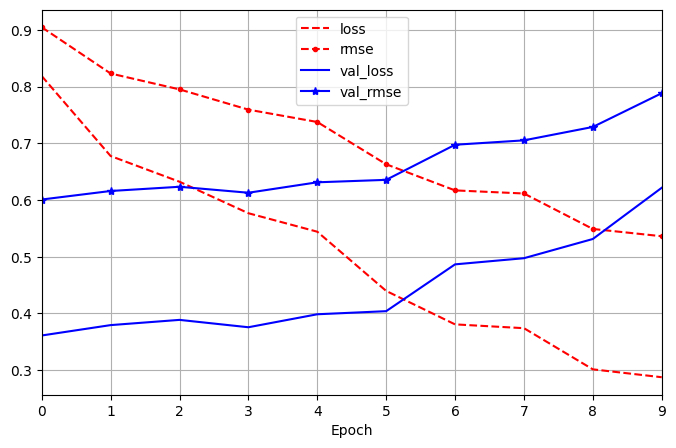

In [69]:
pd.DataFrame(history_reg.history).plot(figsize=(8, 5), xlim=[0, 9],  grid=True, xlabel="Epoch", style=["r--", "r--.", "b-", "b-*"])
plt.show()

Analizando el gráfico, podemos ver que la métrica RMSE de training está muy por encima del RMSE de testing y lo mismo sucede con la pérdida, por lo tanto contamos con overfitting. Además, no vemos que el modelo mejore a lo largo de las iteraciones

## Creacion del modelo utilizando Pipelines

In [83]:
from sklearn.pipeline import Pipeline
from keras.wrappers.scikit_learn import KerasRegressor

def create_model(layers,
                 model = None,
                 activation_functions=[],
                 metrics= ['accuracy'],
                 loss_func = 'mean_squared_error',
                 default_activation_function="relu",
                 optimizer='adam',
                 kernel_initializer=None, 
                 dropout=0.2,
                ):
    
    model = Sequential() if not model else model
    for m_name, l_val in layers.items():
        act_func = activation_functions.pop(0) if activation_functions else default_activation_function
        if kernel_initializer:
            model.add(Dense(l_val,activation=act_func,kernel_initializer=kernel_initializer))
        else:
            model.add(Dense(l_val,activation=act_func))
        
    model.add(Dense(1))
    model.compile(loss=loss_func,optimizer=optimizer, metrics=metrics)

    return model

#clf = KerasRegressor(build_fn=create_model,verbose=0)

layers=estudio_reg.best_params
del layers["num_layers"]

estimator = create_model(
    layers=layers,
    loss_func='binary_crossentropy',
    metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")]
)

pipeline = Pipeline([
    ('custom_model',estimator)
])

pipeline.fit(fx_train, fy_train)
pipeline[0].evaluate(fx_test, fy_test)

101/101 [==============================] - 1s 8ms/step - loss: -3.2924 - rmse: 0.7292


[-3.2924349308013916, 0.7292126417160034]

# Exporting Pipeline

In [85]:
import joblib
joblib.dump(pipeline, 'models/rain.pkl')

['models/rain.pkl']